# Setup


In [2]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:

from CartPole_ import *
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from scipy.stats import qmc
from matplotlib.collections import LineCollection

from numpy.random import default_rng

from utilities import *
from task2 import *

# matplotlib.use("pgf")
matplotlib.rcParams.update({
    "pgf.texsystem": "pdflatex",
    'font.family': 'serif',
    'text.usetex': True,
    'pgf.rcfonts': False,
})


# Task 2.1

In [4]:
N = 1000
M = 320

rng = default_rng(10)

X0 = rng.random(N) * (POS_HIGH - POS_LOW) + POS_LOW
X1 = rng.random(N) * (VEL_HIGH - VEL_LOW) + VEL_LOW
X2 = rng.random(N) * (ANG_HIGH - ANG_LOW) + ANG_LOW
X3 = rng.random(N) * (ANG_VEL_HIGH - ANG_VEL_LOW) + ANG_VEL_LOW

X = np.vstack([X0, X1, X2, X3]).T
print(X.shape)

SIGMA = X.std(axis=0)
XI = rng.choice(X, size=M, replace=False)
print(XI.shape)
print(SIGMA.shape)

K_NM = K(X, XI, SIGMA)
K_MM = K(XI, XI, SIGMA)
print(K_NM.shape)


(1000, 4)
(320, 4)
(4,)
(1000, 320)


In [5]:
LAMBDA = 0
Y = np.apply_along_axis(simulate, axis=1, arr=X)

W1 = np.linalg.inv(K_NM.T @ K_NM + LAMBDA * K_MM) @ K_NM.T @ Y # Manual method
W2, residuals, rank, s = np.linalg.lstsq(K_NM, Y)
print(np.sqrt(np.sum(W1 - W2) ** 2))
print(residuals)


9.48168774050906e-08
[  0.44143304  36.25455219   2.12563604 209.16514731]


/var/folders/80/9k30qm0x143dm5hn3w1wtzzm0000gn/T/ipykernel_37224/2339851829.py:5: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W2, residuals, rank, s = np.linalg.lstsq(K_NM, Y)


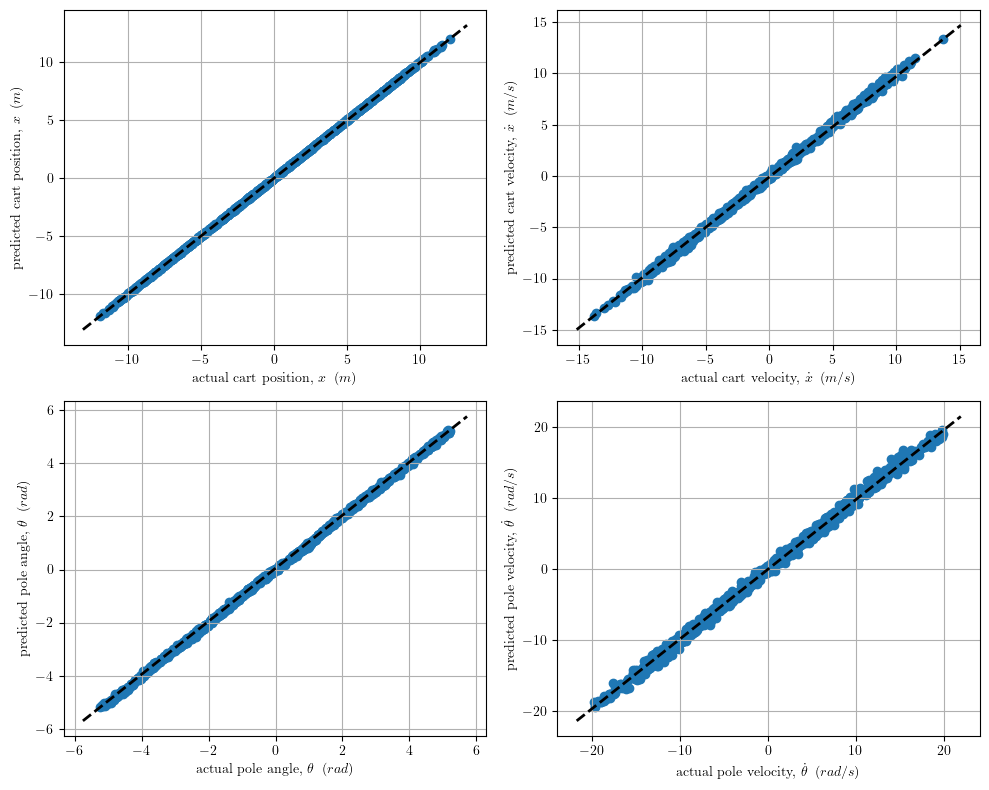

In [6]:
# Try stable equilibrium as a starting point

Y_hat = K_NM @ W2
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

labels = [STATE0, STATE1, STATE2, STATE3]
xlabels = ["actual " + l for l in labels]
ylabels = ["predicted " + l for l in labels]
plot_scatter(x=Y + X, y=Y_hat + X, fig=fig, axs=axs, ylabels=ylabels, xlabels=xlabels)
fig.tight_layout()
fig.savefig("./assets2/task2_1__1.png")


### Sweep, one time step, starting from stable eq

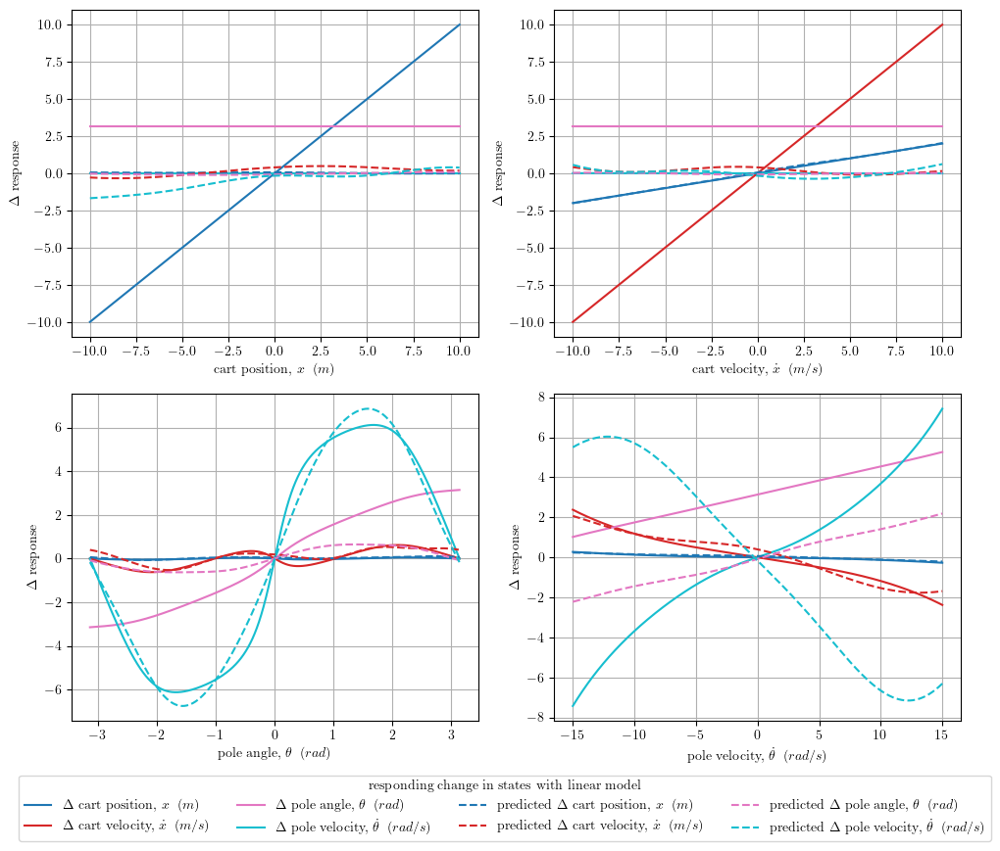

In [10]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

xlabels = [STATE0, STATE1, STATE2, STATE3] * 2
n_c = 4
colors = plt.cm.tab10(np.linspace(0,1,n_c))

for i, x in enumerate(get_ranges(N)):  
    cp = CartPole(False)
    y = np.zeros(4)
    y_hat = np.zeros(4)

    for var in x:
        state = [STABLE_POS, STABLE_VEL, STABLE_ANG, STABLE_ANG_VEL]
        state[i] = var
        y0 = np.array(state)
        cp.setState(y0)
        cp.performAction()
        y = np.vstack([y, cp.getState()])

        K1 = K(y0, XI, SIGMA)
        y_hat = np.vstack([y_hat, K1 @ W2])
        cp.reset()
    
    y = y[1:, :]
    y_hat = y_hat[1:, :]
    ax = axs[i // 2][i % 2]
    ax.grid()
    plot_all_states_in_a_subplot_1_3(x, y, fig=fig, ax=ax, xlabel=xlabels[i], ylabel=f"{DELTA} response", colors=colors, linestyle='solid')
    plot_all_states_in_a_subplot_1_3(x, y_hat, fig=fig, ax=ax, xlabel=xlabels[i], ylabel=f"{DELTA} response", colors=colors, linestyle='dashed')

label1 = [DELTA + l for l in xlabels[:4]]
label2 = ["predicted " + DELTA + l for l in xlabels[:4]]
lgd = fig.legend(bbox_to_anchor=(0.52, -0.08), loc="lower center", borderaxespad=0, ncol=4, labels=label1+label2, title='responding change in states with linear model')
fig.tight_layout()
fig.savefig("./assets2/task2_1__2.png",  bbox_extra_artists=(lgd,), bbox_inches='tight')


### Random vs Sobol

In [9]:
# Random vs Sobol

X_rand, XI_rand, Y_rand, W_rand, K_NM_rand = compute_weights(1000, 160, basis_placement='random')

labels = [STATE0, STATE1, STATE2, STATE3]
xlabels = ["actual " + l for l in labels]
ylabels = ["predicted " + l for l in labels]

Samples drawn: 1024
SE: [  6.32648558 210.02767532  13.5578942  635.93350745]


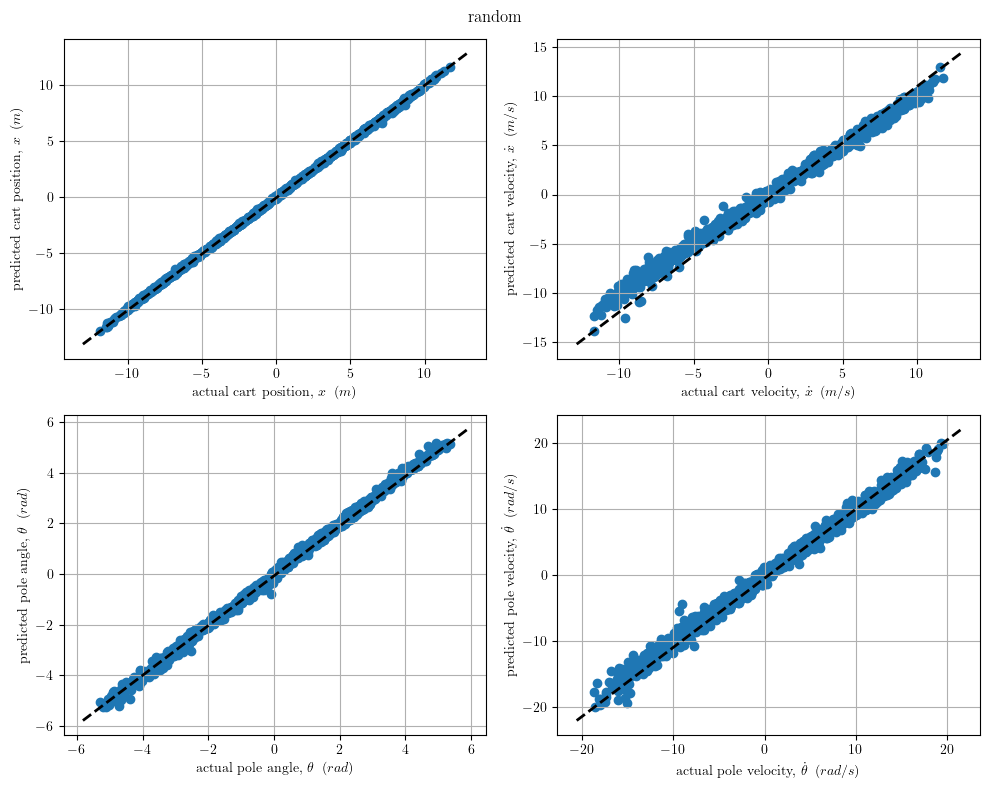

In [10]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8))
plot_scatter(x=X_rand + K_NM_rand @ W_rand, y=Y_rand + X_rand, fig=fig, axs=axs, ylabels=ylabels, xlabels=xlabels)
fig.suptitle('random')

fig.tight_layout()
fig.savefig("./assets2/task2_1__4.png")

In [11]:
X_sobol, XI_sobol, Y_sobol, W_sobol, K_NM_sobol = compute_weights(1000, 160, basis_placement='sobol')

labels = [STATE0, STATE1, STATE2, STATE3]
xlabels = ["actual " + l for l in labels]
ylabels = ["predicted " + l for l in labels]


Samples drawn: 1024
SE: [  4.36576128 181.71781485  13.61328977 398.30611693]


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:106: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y)


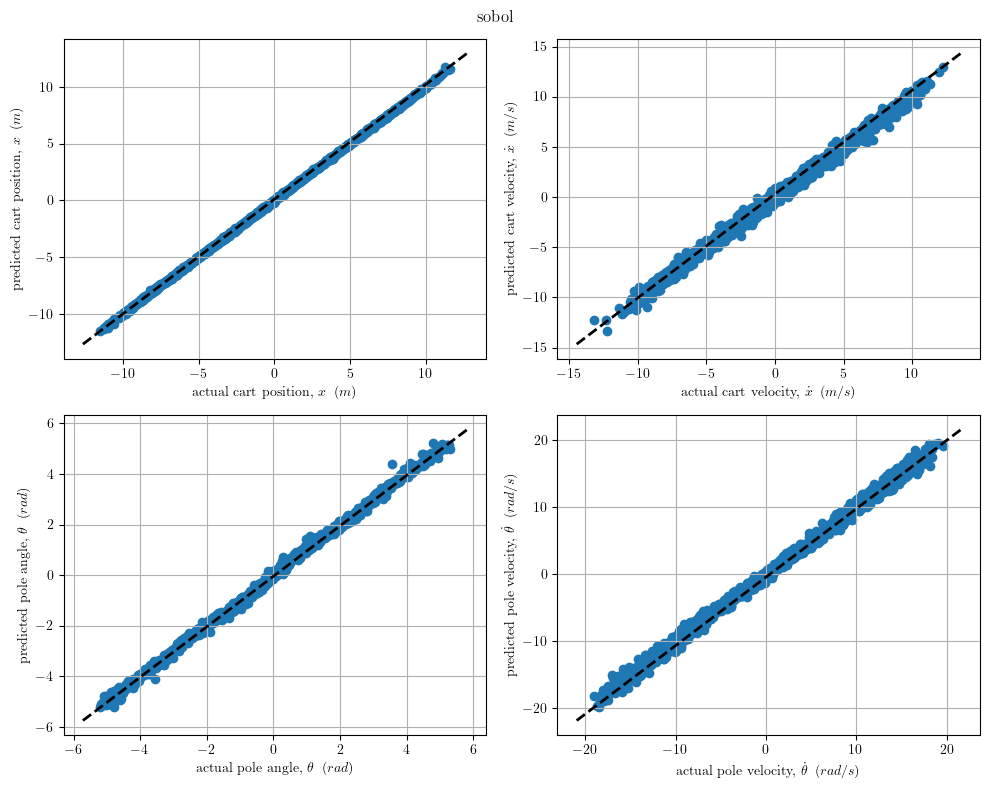

In [12]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8))
plot_scatter(x=X_sobol + K_NM_sobol @ W_sobol, y=Y_sobol + X_sobol, fig=fig, axs=axs, ylabels=ylabels, xlabels=xlabels)
fig.suptitle('sobol')
fig.tight_layout()
fig.savefig("./assets2/task2_1__5.png")

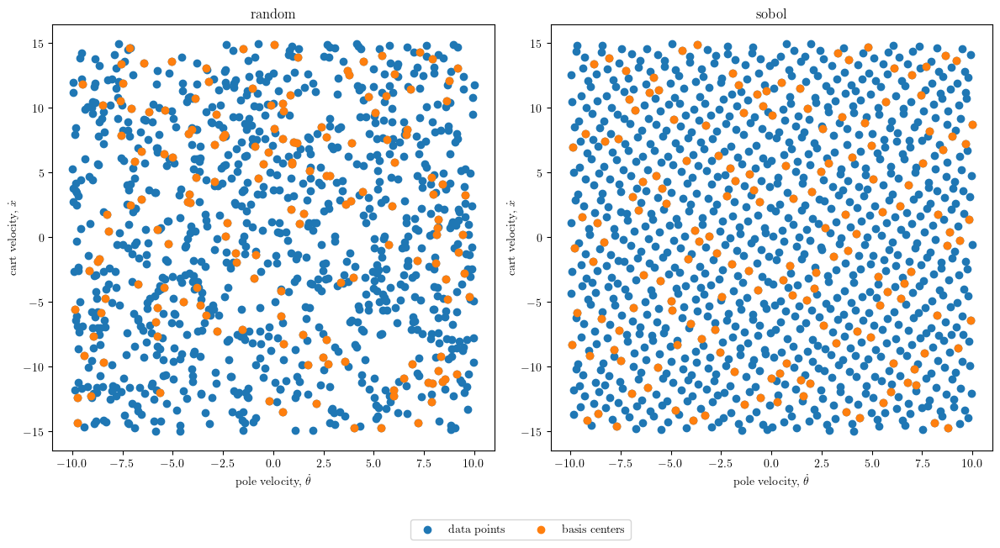

In [13]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].scatter(X_rand[:, 1], X_rand[:, 3], label='data points')
axs[0].scatter(XI_rand[:, 1], XI_rand[:, 3], label='basis centers')

axs[1].scatter(X_sobol[:, 1], X_sobol[:, 3],)
axs[1].scatter(XI_sobol[:, 1], XI_sobol[:, 3],)

axs[0].set(
    xlabel=r"pole velocity, $\dot \theta$",
    ylabel=r"cart velocity, $\dot x$",
    title='random'
)

axs[1].set(
    xlabel=r"pole velocity, $\dot \theta$",
    ylabel=r"cart velocity, $\dot x$",
    title='sobol'
    
)

lgd = fig.legend(bbox_to_anchor=(0.52, -0.08), loc="lower center", borderaxespad=0, ncol=2)
fig.tight_layout()
fig.savefig("./assets/task2_1__10.png", bbox_extra_artists=(lgd,), bbox_inches='tight')

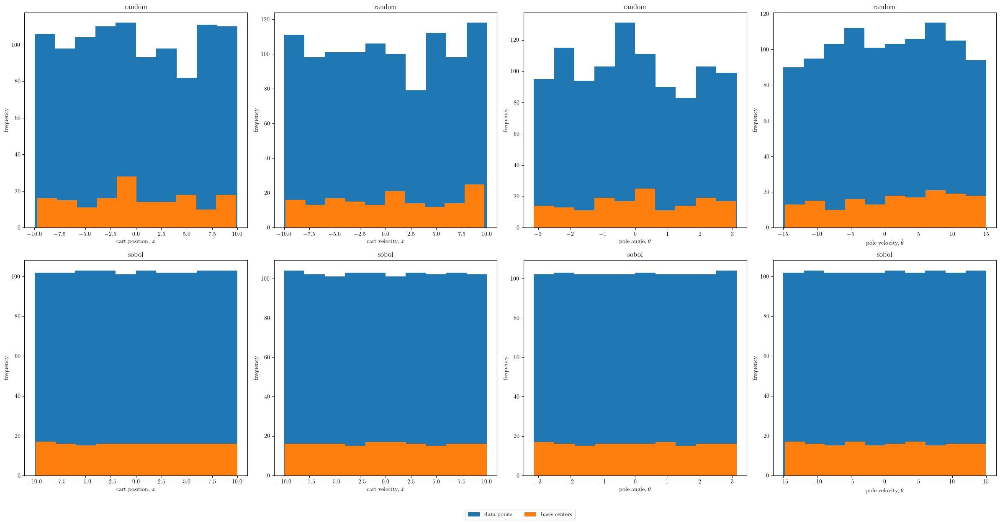

In [16]:
fig, axs = plt.subplots(2, 4, figsize=(24, 12))

axs[0][0].hist(X_rand[:, 0], label='data points')
axs[0][0].hist(XI_rand[:, 0], label='basis centers')

axs[0][1].hist(X_rand[:, 1], )
axs[0][1].hist(XI_rand[:, 1],)

axs[0][2].hist(X_rand[:, 2], )
axs[0][2].hist(XI_rand[:, 2], )

axs[0][3].hist(X_rand[:, 3], )
axs[0][3].hist(XI_rand[:, 3], )

axs[1][0].hist(X_sobol[:, 0], )
axs[1][0].hist(XI_sobol[:, 0],)

axs[1][1].hist(X_sobol[:, 1],)
axs[1][1].hist(XI_sobol[:, 1], )

axs[1][2].hist(X_sobol[:, 2],)
axs[1][2].hist(XI_sobol[:, 2],)

axs[1][3].hist(X_sobol[:, 3],)
axs[1][3].hist(XI_sobol[:, 3],)


axs[0][0].set(
    xlabel=r"cart position, $x$",
    ylabel=r"frequency",
    title='random'
)

axs[0][1].set(
    xlabel=r"cart velocity, $\dot x$",
    ylabel=r"frequency",
    title='random'
    
)

axs[0][2].set(
    xlabel=r"pole angle, $\theta$",
    ylabel=r"frequency",
    title='random'
)

axs[0][3].set(
    xlabel=r"pole velocity, $\dot \theta$",
    ylabel=r"frequency",
    title='random'   
)

axs[1][0].set(
    xlabel=r"cart position, $x$",
    ylabel=r"frequency",
    title='sobol'
)

axs[1][1].set(
    xlabel=r"cart velocity, $\dot x$",
    ylabel=r"frequency",
    title='sobol'
    
)

axs[1][2].set(
    xlabel=r"pole angle, $\theta$",
    ylabel=r"frequency",
    title='sobol'
)

axs[1][3].set(
    xlabel=r"pole velocity, $\dot \theta$",
    ylabel=r"frequency",
    title='sobol'   
)

lgd = fig.legend(bbox_to_anchor=(0.52, -0.04), loc="lower center", borderaxespad=0, ncol=2)
fig.tight_layout()
fig.savefig("./assets/task2_1__50.png", bbox_extra_artists=(lgd,), bbox_inches='tight')

### Roll out (Sobol)

In [17]:
_, xi, _ , w, _ = compute_weights(1000, 160, basis_placement='sobol')

Samples drawn: 1024


/var/folders/80/9k30qm0x143dm5hn3w1wtzzm0000gn/T/ipykernel_97724/4088524216.py:36: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y)


SE: [  4.36576128 181.71781485  13.61328977 398.30611693]


Point of divergence: (50.00, 21.53, 16.67), (9.00, 2.61, 3.00), (39.00, -36.89, 13.00), (32.00, 7.69, 10.67)
Point of divergence: (50.00, 6.20, 16.67), (9.00, 0.55, 3.00), (50.00, 3.00, 16.67), (50.00, -3.86, 16.67)
Point of divergence: (18.00, -2.29, 6.00), (1.00, -0.50, 0.33), (50.00, 3.29, 16.67), (50.00, 3.86, 16.67)
Point of divergence: (50.00, -21.53, 16.67), (6.00, -2.60, 2.00), (36.00, 38.52, 12.00), (42.00, -12.95, 14.00)


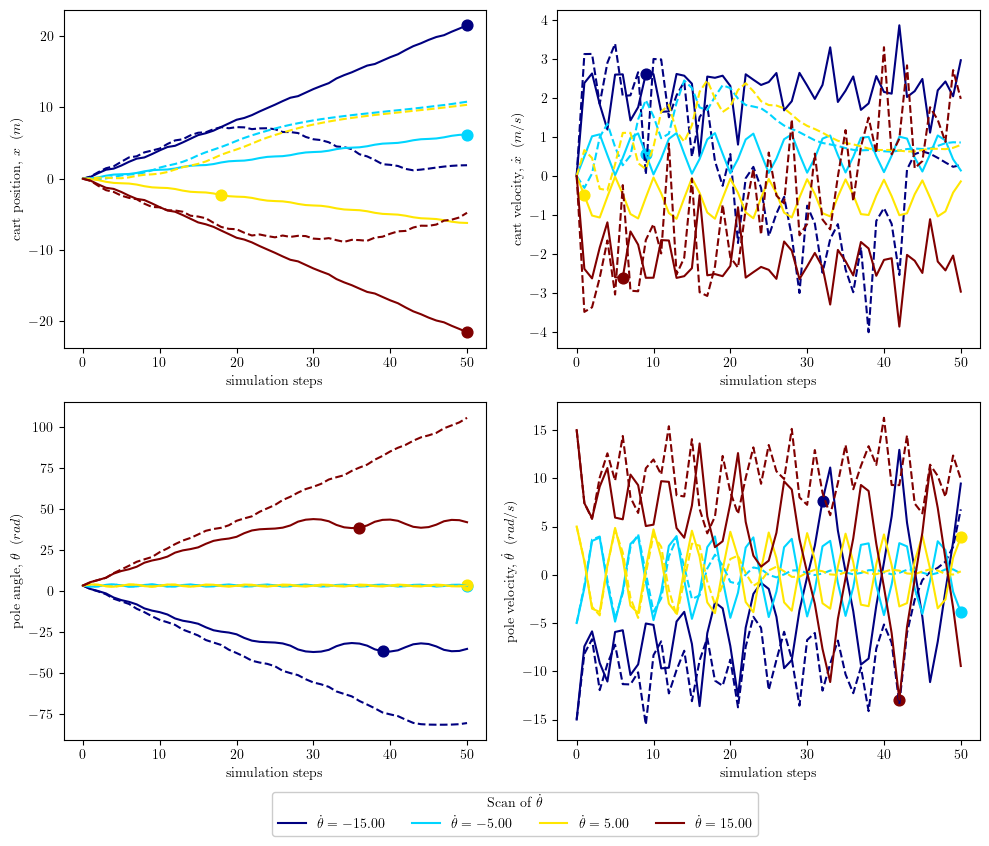

In [63]:
l = 4
colors = plt.cm.jet(np.linspace(0, 1, l))
_, _, _, ang_vel_range = get_ranges(l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
T = 50
steps = np.arange(0, T + 1)

for i, ang_vel in enumerate(ang_vel_range):
    x0 = np.array([STABLE_POS, STABLE_VEL, STABLE_ANG, ang_vel])
    cp.setState(x0)
    
    x = x0[None, ...]
    x_hat = x0[None, ...]
    
    for _ in steps[1:]:
        cp.performAction()
        t = cp.getState()
        x = np.vstack([x, t])
        
        prev = x_hat[-1, :]
        kernel = K(prev, xi, SIGMA)
        x_hat = np.vstack([x_hat, kernel @ w + prev])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps", label=r"$\dot \theta={a:.2f}$".format(a=ang_vel), color=colors[i])

    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__11.png", bbox_extra_artists=(), bbox_inches='tight')


### Model accuracy against no. data points and basis

In [45]:
# Using sobol, we vary N and fix M to 320 = 2 ** 4 * 10

def task_2_1_1(start=8, stop=15):
    N = np.arange(start, stop)
    mse_hist = [float('inf')]
    param_hist = [0]
    min_mse = float('inf')
    min_params = (0, 0)
    m = 5
    
    for n in N:
        n_data = 2 ** n
        n_basis = 2 ** m * 10
        
        if n_data / n_basis <= 1: continue
        
        with redirect_stdout(None):    
            _, _, Y, W, K_NM = compute_weights(n_data, n_basis, basis_placement='sobol')
        
        diff = Y - K_NM @ W
        mse = np.sqrt(np.sum(diff ** 2)) / Y.size
        mse_hist.append(mse)
        param_hist.append(n)
        
        if min_mse > mse:
            min_mse = mse
            min_params = (n, m)
    
    mse_hist = mse_hist[1:]
    param_hist = param_hist[1:]
    return min_params, min_mse, param_hist, mse_hist
    
min_params, min_mse, param_hist, mse_hist = task_2_1_1()

print(f"Opt. parameters: {min_params}, Minimum MSE: {min_mse}")

/var/folders/80/9k30qm0x143dm5hn3w1wtzzm0000gn/T/ipykernel_41758/4088524216.py:36: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y)


Opt. parameters: (14, 5), Minimum MSE: 0.0011924999753769928


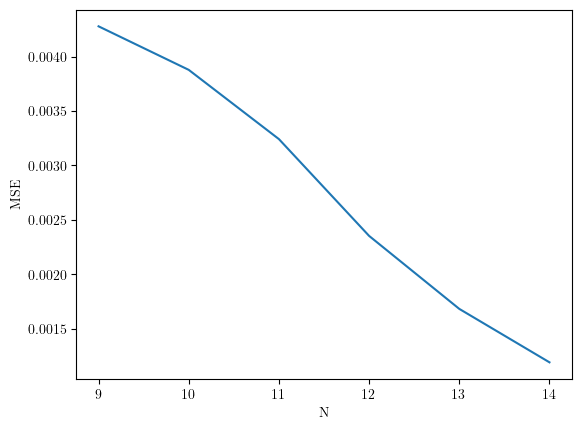

In [46]:
plt.plot(param_hist, mse_hist)
plt.xlabel('N')
plt.ylabel('MSE')
plt.savefig("./assets2/task2_1__21.png")

In [47]:
def compute_weights_tts(N, M, basis_placement='random', k_func=K, train_split=1.0):
    def simulate(X):
        cp = CartPole(False)
        cp.setState(X)
        cp.performAction()
        return cp.getState() - X # Change in state

    exponent = int(np.ceil(np.log2(N)))
    seed = 10
    split = int(N * train_split)

    print(f"Samples drawn: {2 ** exponent}")
    if basis_placement == 'random':
        rng = default_rng(seed)
        size = int(2 ** exponent)
        X0 = rng.random(size) * (POS_HIGH - POS_LOW) + POS_LOW
        X1 = rng.random(size) * (VEL_HIGH - VEL_LOW) + VEL_LOW
        X2 = rng.random(size) * (ANG_HIGH - ANG_LOW) + ANG_LOW
        X3 = rng.random(size) * (ANG_VEL_HIGH - ANG_VEL_LOW) + ANG_VEL_LOW
        X = np.vstack([X0, X1, X2, X3]).T
        
        X_train = X[:split, ...]
        X_test = X[split:, ...]
        XI = rng.choice(X_train, size=M, replace=False)


    elif basis_placement == 'sobol':
        sampler = qmc.Sobol(d=4, seed=seed)
        X = sampler.random_base2(m=exponent)
        X[:, 0] = X[:, 0] * (POS_HIGH - POS_LOW) + POS_LOW
        X[:, 1] = X[:, 1] * (VEL_HIGH - VEL_LOW) + VEL_LOW
        X[:, 2] = X[:, 2] * (ANG_HIGH - ANG_LOW) + ANG_LOW
        X[:, 3] = X[:, 3] * (ANG_VEL_HIGH - ANG_VEL_LOW) + ANG_VEL_LOW
        
        X_train = X[:split, ...]
        X_test = X[split:, ...] if split != N else None
        XI = X_train[:M]
    
    SIGMA = X_train.std(axis=0)
    K_NM = k_func(X_train, XI, SIGMA)
    
    
    Y_train = np.apply_along_axis(simulate, axis=1, arr=X_train)
    Y_test = np.apply_along_axis(simulate, axis=1, arr=X_test) if split != N else None
    
    W, residuals, rank, s = np.linalg.lstsq(K_NM, Y_train)
    print(f"SE: {residuals}")
    
    diff_train = Y_train - K_NM @ W
    mse_train = np.sqrt(np.sum(diff_train ** 2)) / Y_train.size
    
    diff_test = Y_test - k_func(X_test, XI, SIGMA) @ W
    mse_test = np.sqrt(np.sum(diff_test ** 2)) / Y_test.size
    

    return X_train, XI, Y_train, X_test, Y_test, W, K_NM, mse_train, mse_test

    

In [17]:
# Try using train test split to see if we can get some optimal balance between train and test MSE

def task_2_1_10(start=8, stop=15):
    N = np.arange(start, stop)
    param_hist = []
    mse_train_hist = []
    mse_test_hist = []
    m = 5
    
    for n in N:
        n_data = 2 ** n
        n_basis = 2 ** m * 10
        
        if n_data / n_basis <= 1: continue
        
        with redirect_stdout(None):    
            _, _, _, _, Y, W, K_NM, mse_train, mse_test = compute_weights_tts(n_data, n_basis, basis_placement='sobol', train_split=0.8)
        
        mse_train_hist.append(mse_train)
        mse_test_hist.append(mse_test)
        param_hist.append(n)
    
    return param_hist, mse_train_hist, mse_test_hist
    
param_hist, mse_train_hist, mse_test_hist = task_2_1_10(8, 15)


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:156: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y_train)


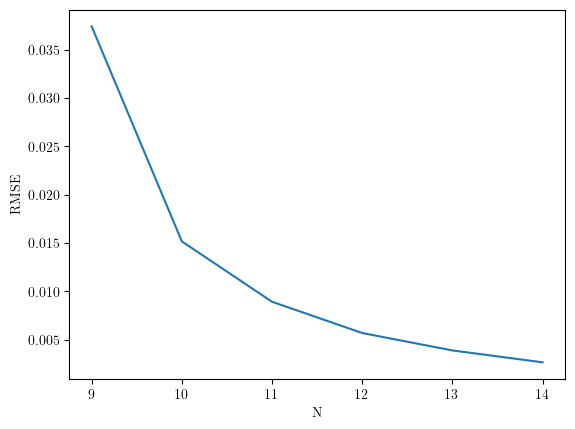

In [18]:
# Plotting the test MSE, we can see that its plateus
plt.plot(param_hist, mse_test_hist) 
plt.xlabel('N')
plt.ylabel('RMSE')
plt.savefig("./assets2/task2_1__22.png")

In [ ]:
def task_2_1_2(start=6, stop=9):
    n = 13
    M = np.arange(start, stop)
    param_hist = []
    mse_train_hist = []
    mse_test_hist = []
    
    for m in M:
        n_data = 2 ** n
        n_basis = 2 ** m * 10
        
        if n_data / n_basis <= 1: continue
        
        with redirect_stdout(None):    
            _, _, _, _, Y, W, K_NM, mse_train, mse_test = compute_weights_tts(n_data, n_basis, basis_placement='sobol', train_split=0.8)
        
        mse_train_hist.append(mse_train)
        mse_test_hist.append(mse_test)
        param_hist.append(m)
    
    return param_hist, mse_train_hist, mse_test_hist
    
param_hist, mse_train_hist, mse_test_hist = task_2_1_2(4, 8)


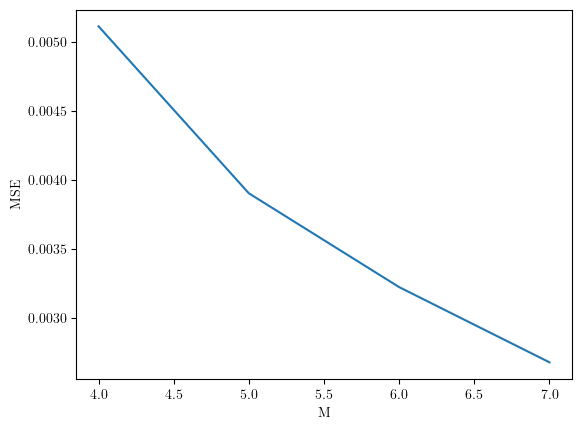

In [61]:
# Plotting the test MSE, we can see that its plateus
plt.plot(param_hist, mse_test_hist) 
plt.xlabel('M')
plt.ylabel('MSE')
plt.savefig("./assets2/task2_1__23.png")

In [20]:
# Using sobol, we do a grid search and see if the MSE decreases

def task_2_1_3():

    N = np.arange(8, 15) # 2**8 -> 2**12 data points
    M = np.arange(4, 8) # No. basis points must be smaller than the no. data points
    mse_train_hist= {}
    mse_test_hist= {}
    min_mse = float('inf')
    min_params = (0, 0)

    for n in N:
        for m in M:
            n_data = 2 ** n
            n_basis = 2 ** m * 10
            if n_data // n_basis < 25: break # To reduce search space
            
            with redirect_stdout(None): 
                _, _, _, _, Y, W, K_NM, mse_train, mse_test = compute_weights_tts(n_data, n_basis, basis_placement='sobol', train_split=0.8)
            
            mse_train_hist[(m, n)] = mse_train
            mse_test_hist[(m, n)] = mse_test
            
            if min_mse > mse_test:
                min_mse = mse_test
                min_params = (m, n)
    
    return min_params, min_mse, mse_train_hist, mse_test_hist
            
min_params, min_mse, mse_train_hist, mse_test_hist = task_2_1_3()
print(f"Parameters: {min_params}, Minimum MSE: {min_mse}")
    

/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:156: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y_train)


KeyboardInterrupt: 

In [34]:
# What about sigma
from task2 import t2_1_vary_sigma

x, y, sigma = t2_1_vary_sigma()

[5.77350269 5.77350269 1.81379937 8.66025404]
[3.84900179 4.33012702 4.81125224 5.29237747 5.77350269 6.25462792
 6.73575314 7.21687836 7.69800359]


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:511: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  _, residuals, _, _ = np.linalg.lstsq(K_NM, Y)


[5.77350269 5.77350269 1.81379937 8.66025404]
[3.84900179 4.33012702 4.81125224 5.29237747 5.77350269 6.25462792
 6.73575314 7.21687836 7.69800359]
[5.77350269 5.77350269 1.81379937 8.66025404]
[1.20919958 1.36034953 1.51149948 1.66264943 1.81379937 1.96494932
 2.11609927 2.26724922 2.41839917]
[5.77350269 5.77350269 1.81379937 8.66025404]
[ 5.77350269  6.49519053  7.21687836  7.9385662   8.66025404  9.38194187
 10.10362971 10.82531755 11.54700538]


In [31]:
sigma

array([ 7.69800359,  7.69800359,  2.41839917, 11.54700538])

In [27]:
x[0]

array([3.84900179, 4.33012702, 4.81125224, 5.29237747, 5.77350269,
       6.25462792, 6.73575314, 7.21687836, 7.69800359])

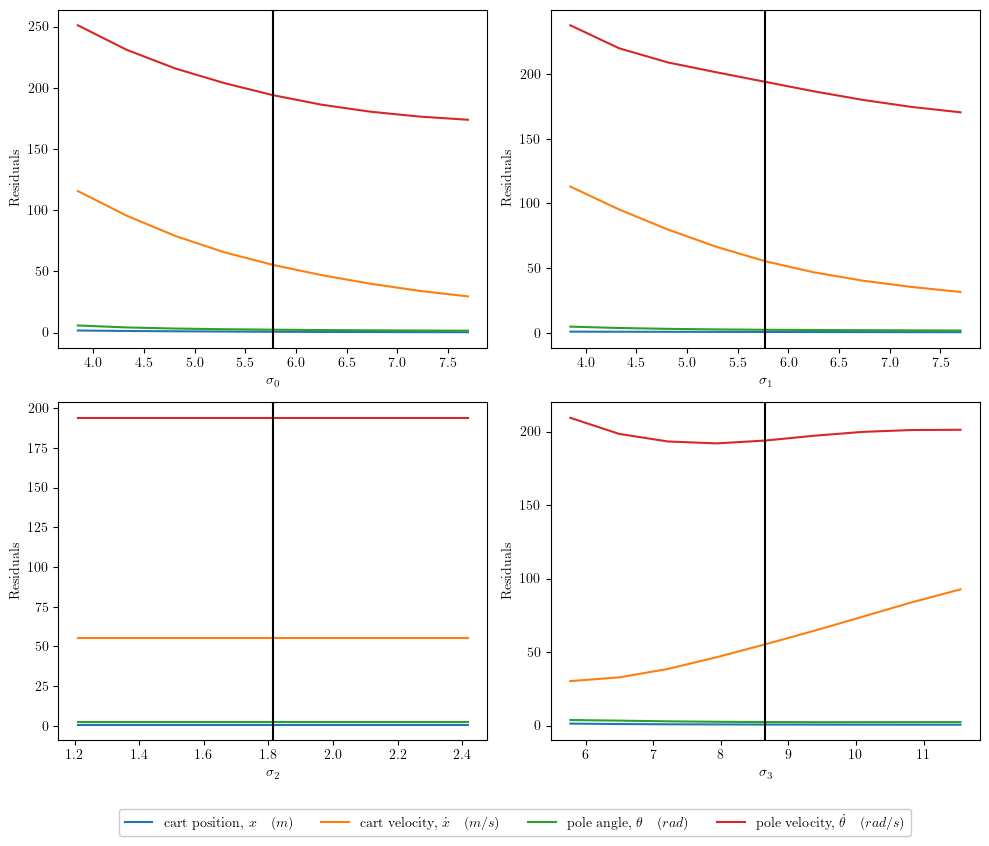

In [39]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8))
t2_1_plot_sigma(x, y, sigma, fig, axs)
fig.tight_layout()

lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=4)
fig.savefig("./assets2/task2_1__15.png", bbox_extra_artists=(), bbox_inches='tight')


### Do roll-outs

Samples drawn: 2048


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:82: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y)


SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (1.00, -0.10, 0.33), (1.00, 0.00, 0.33), (1.00, 0.00, 0.33), (1.00, 0.00, 0.33)
(1, 4) (1, 4)
Point of divergence: (1.00, -0.06, 0.33), (1.00, 0.00, 0.33), (1.00, 0.00, 0.33), (1.00, 0.00, 0.33)
(1, 4) (1, 4)
Point of divergence: (1.00, -0.02, 0.33), (1.00, 0.00, 0.33), (1.00, 0.00, 0.33), (1.00, 0.00, 0.33)
(1, 4) (1, 4)
Point of divergence: (1.00, 0.02, 0.33), (1.00, 0.00, 0.33), (1.00, 0.00, 0.33), (1.00, 0.00, 0.33)
(1, 4) (1, 4)
Point of divergence: (1.00, 0.06, 0.33), (1.00, 0.00, 0.33), (1.00, 0.00, 0.33), (1.00, 0.00, 0.33)
(1, 4) (1, 4)
Point of divergence: (1.00, 0.10, 0.33), (1.00, 0.00, 0.33), (1.00, 0.00, 0.33), (1.00, 0.00, 0.33)


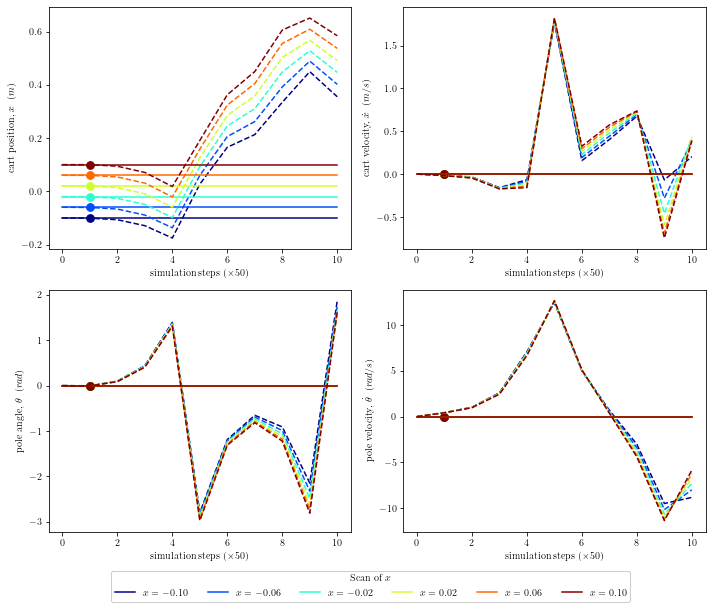

In [60]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
pos_range = np.linspace(-0.1, 0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, pos in enumerate(pos_range):
    x0 = np.array([pos, STABLE_VEL, UNSTABLE_ANG, STABLE_ANG_VEL])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$x={a:.2f}$".format(a=pos), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__20.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (6.00, 0.02, 2.00), (5.00, 0.10, 1.67), (5.00, 0.00, 1.67), (5.00, 0.03, 1.67)
(1, 4) (1, 4)
Point of divergence: (6.00, 0.06, 2.00), (5.00, 0.10, 1.67), (5.00, 0.00, 1.67), (5.00, 0.03, 1.67)
(1, 4) (1, 4)
Point of divergence: (6.00, 0.10, 2.00), (5.00, 0.10, 1.67), (5.00, 0.00, 1.67), (5.00, 0.03, 1.67)
(1, 4) (1, 4)
Point of divergence: (6.00, 0.14, 2.00), (5.00, 0.10, 1.67), (5.00, 0.00, 1.67), (5.00, 0.03, 1.67)
(1, 4) (1, 4)
Point of divergence: (6.00, 0.18, 2.00), (5.00, 0.10, 1.67), (5.00, 0.00, 1.67), (5.00, 0.03, 1.67)
(1, 4) (1, 4)
Point of divergence: (6.00, 0.22, 2.00), (5.00, 0.10, 1.67), (5.00, 0.00, 1.67), (5.00, 0.03, 1.67)


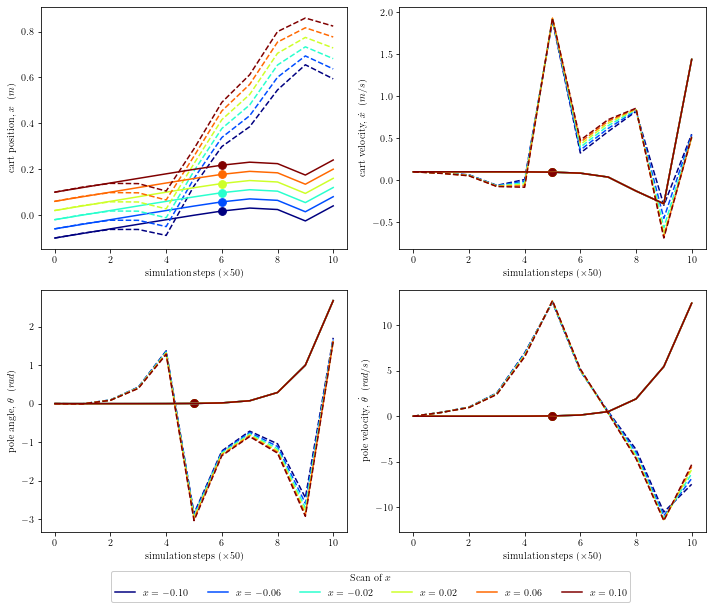

In [61]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
pos_range = np.linspace(-0.1, 0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, pos in enumerate(pos_range):
    x0 = np.array([pos, 0.1, UNSTABLE_ANG, STABLE_ANG_VEL])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$x={a:.2f}$".format(a=pos), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__21.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, 1.96, 3.33), (5.00, 0.96, 1.67), (10.00, -0.73, 3.33), (5.00, 0.33, 1.67)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.00, 3.33), (5.00, 0.96, 1.67), (10.00, -0.73, 3.33), (5.00, 0.33, 1.67)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.04, 3.33), (5.00, 0.96, 1.67), (10.00, -0.73, 3.33), (5.00, 0.33, 1.67)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.08, 3.33), (5.00, 0.96, 1.67), (10.00, -0.73, 3.33), (5.00, 0.33, 1.67)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.12, 3.33), (5.00, 0.96, 1.67), (10.00, -0.73, 3.33), (5.00, 0.33, 1.67)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.16, 3.33), (5.00, 0.96, 1.67), (9.00, -1.97, 3.00), (5.00, 0.33, 1.67)


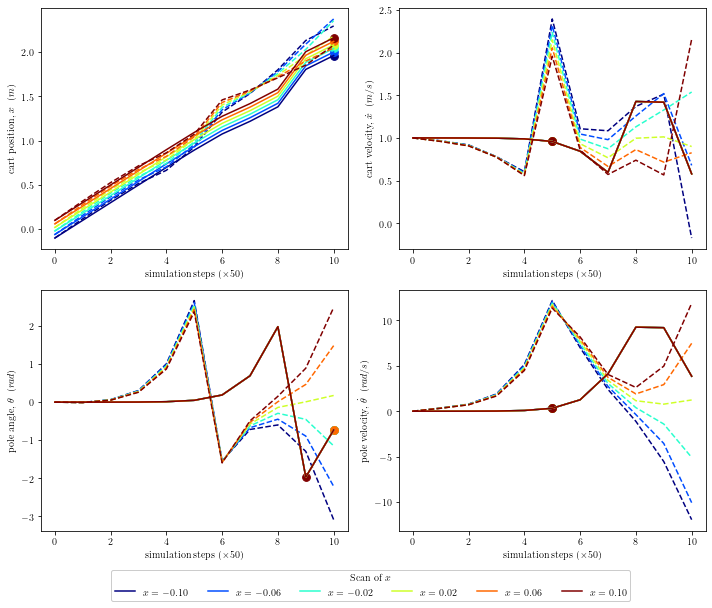

In [62]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
pos_range = np.linspace(-0.1, 0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, pos in enumerate(pos_range):
    x0 = np.array([pos, 1, UNSTABLE_ANG, STABLE_ANG_VEL])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$x={a:.2f}$".format(a=pos), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__22.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:82: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y)


SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, 1.75, 3.33), (8.00, 0.68, 2.67), (8.00, -1.84, 2.67), (8.00, -8.44, 2.67)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.79, 3.33), (8.00, 0.68, 2.67), (8.00, -1.84, 2.67), (8.00, -8.44, 2.67)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.83, 3.33), (8.00, 0.68, 2.67), (8.00, -1.84, 2.67), (8.00, -8.44, 2.67)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.87, 3.33), (8.00, 0.68, 2.67), (8.00, -1.84, 2.67), (8.00, -8.44, 2.67)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.91, 3.33), (8.00, 0.68, 2.67), (8.00, -1.84, 2.67), (8.00, -8.44, 2.67)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.95, 3.33), (8.00, 0.68, 2.67), (8.00, -1.84, 2.67), (8.00, -8.44, 2.67)


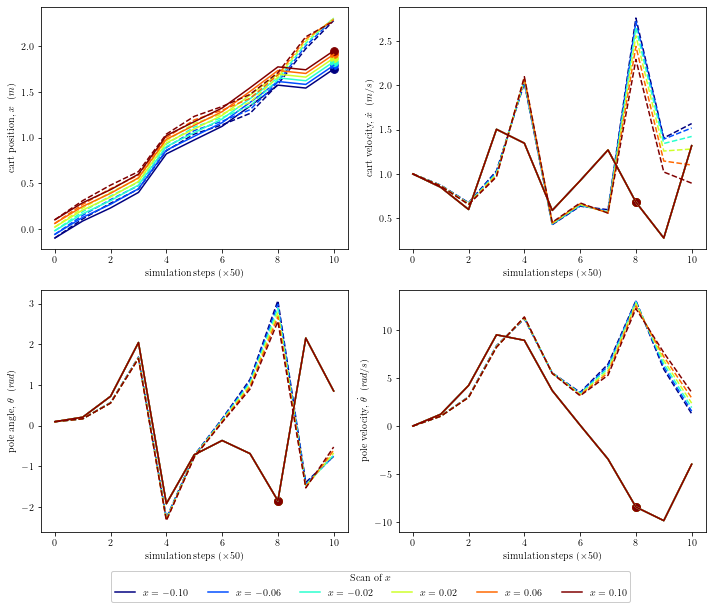

In [38]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
pos_range = np.linspace(-0.1, 0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, pos in enumerate(pos_range):
    x0 = np.array([pos, 1, 0.1, STABLE_ANG_VEL])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$x={a:.2f}$".format(a=pos), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__23.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:106: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y)


SE: [  1.75409652 135.92114523   6.0526496  561.67482327]
(1, 4) (1, 4)
Point of divergence: (10.00, 2.07, 3.33), (10.00, 1.21, 3.33), (10.00, -1.86, 3.33), (10.00, 6.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.11, 3.33), (10.00, 1.21, 3.33), (10.00, -1.86, 3.33), (10.00, 6.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.15, 3.33), (10.00, 1.21, 3.33), (10.00, -1.86, 3.33), (10.00, 6.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.19, 3.33), (10.00, 1.21, 3.33), (10.00, -1.86, 3.33), (10.00, 6.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.23, 3.33), (10.00, 1.21, 3.33), (10.00, -1.86, 3.33), (10.00, 6.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.27, 3.33), (10.00, 1.21, 3.33), (10.00, -1.86, 3.33), (10.00, 6.59, 3.33)


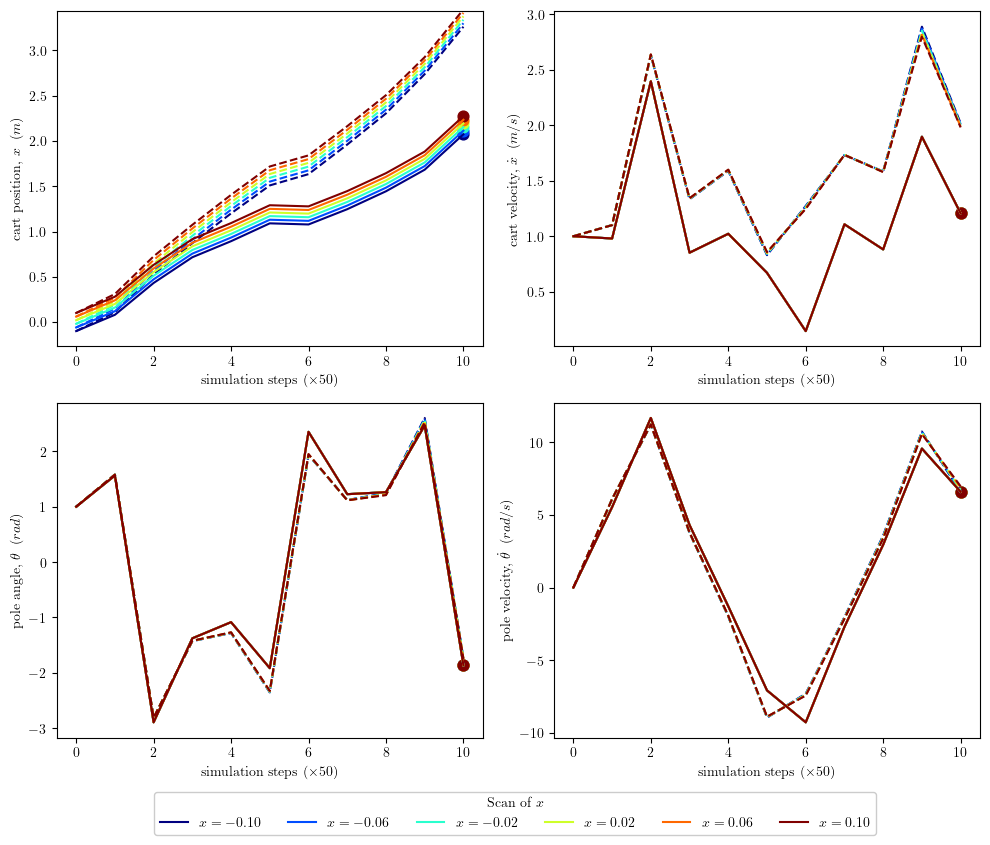

In [5]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
pos_range = np.linspace(-0.1, 0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, pos in enumerate(pos_range):
    x0 = np.array([pos, 1, 1, STABLE_ANG_VEL])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$x={a:.2f}$".format(a=pos), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__24.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:82: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y)


SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, 2.09, 3.33), (10.00, 1.19, 3.33), (10.00, -1.84, 3.33), (10.00, 6.48, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.13, 3.33), (10.00, 1.19, 3.33), (10.00, -1.84, 3.33), (10.00, 6.48, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.17, 3.33), (10.00, 1.19, 3.33), (10.00, -1.84, 3.33), (10.00, 6.48, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.21, 3.33), (10.00, 1.19, 3.33), (10.00, -1.84, 3.33), (10.00, 6.48, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.25, 3.33), (10.00, 1.19, 3.33), (10.00, -1.84, 3.33), (10.00, 6.48, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.29, 3.33), (10.00, 1.19, 3.33), (10.00, -1.84, 3.33), (10.00, 6.48, 3.33)


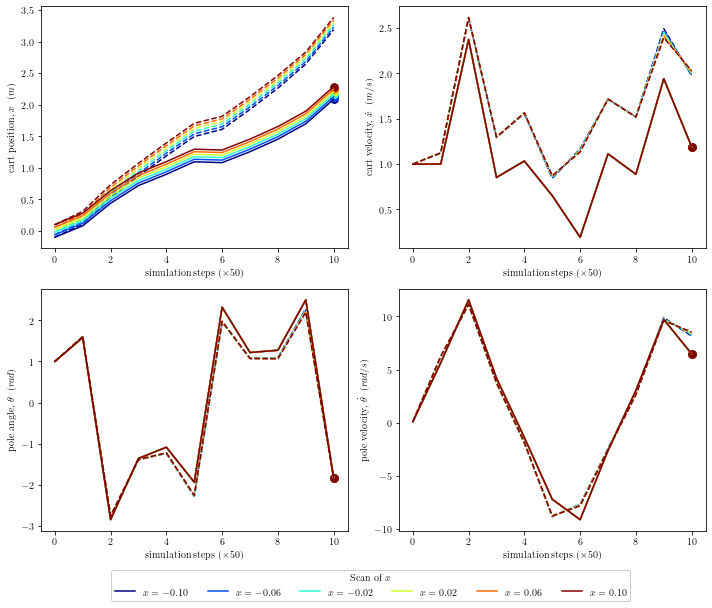

In [ ]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
pos_range = np.linspace(-0.1, 0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, pos in enumerate(pos_range):
    x0 = np.array([pos, 1, 1, 0.1])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$x={a:.2f}$".format(a=pos), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__25.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, 2.21, 3.33), (10.00, 1.13, 3.33), (10.00, -1.71, 3.33), (10.00, 5.82, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.25, 3.33), (10.00, 1.13, 3.33), (10.00, -1.71, 3.33), (10.00, 5.82, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.29, 3.33), (10.00, 1.13, 3.33), (10.00, -1.71, 3.33), (10.00, 5.82, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.33, 3.33), (10.00, 1.13, 3.33), (10.00, -1.71, 3.33), (10.00, 5.82, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.37, 3.33), (10.00, 1.13, 3.33), (10.00, -1.71, 3.33), (10.00, 5.82, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.41, 3.33), (10.00, 1.13, 3.33), (10.00, -1.71, 3.33), (10.00, 5.82, 3.33)


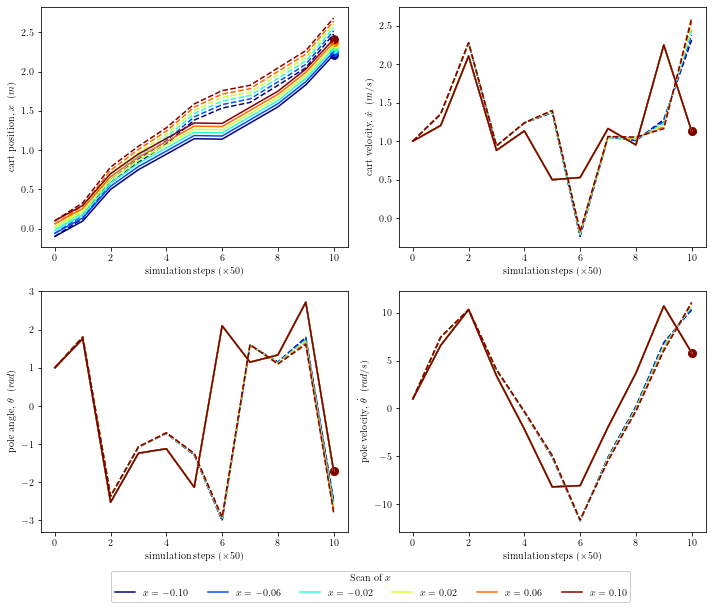

In [44]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
pos_range = np.linspace(-0.1, 0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, pos in enumerate(pos_range):
    x0 = np.array([pos, 1, 1, 1])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$x={a:.2f}$".format(a=pos), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__26.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:82: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y)


SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, -2.69, 3.33), (10.00, 1.13, 3.33), (10.00, -1.71, 3.33), (10.00, 5.82, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, -0.69, 3.33), (10.00, 1.13, 3.33), (10.00, -1.71, 3.33), (10.00, 5.82, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.31, 3.33), (10.00, 1.13, 3.33), (10.00, -1.71, 3.33), (10.00, 5.82, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 3.31, 3.33), (10.00, 1.13, 3.33), (10.00, -1.71, 3.33), (10.00, 5.82, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 5.31, 3.33), (10.00, 1.13, 3.33), (10.00, -1.71, 3.33), (10.00, 5.82, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 7.31, 3.33), (6.00, 0.53, 2.00), (10.00, -1.71, 3.33), (10.00, 5.82, 3.33)


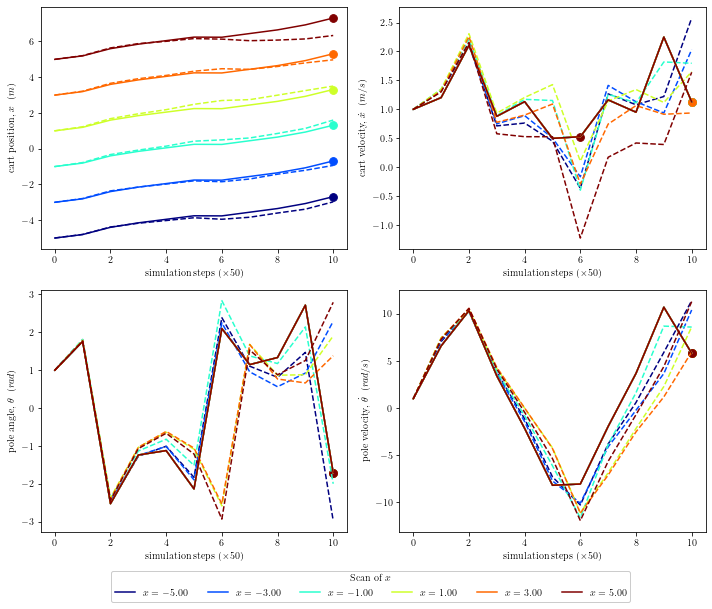

In [55]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
pos_range = np.linspace(-5, 5, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, pos in enumerate(pos_range):
    x0 = np.array([pos, 1, 1, 1])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$x={a:.2f}$".format(a=pos), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__27.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (2.00, -0.12, 0.67), (10.00, -0.07, 3.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (2.00, -0.08, 0.67), (10.00, -0.07, 3.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (2.00, -0.04, 0.67), (10.00, -0.07, 3.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (2.00, -0.00, 0.67), (10.00, -0.07, 3.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (2.00, 0.04, 0.67), (10.00, -0.07, 3.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (2.00, 0.08, 0.67), (10.00, -0.07, 3.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)


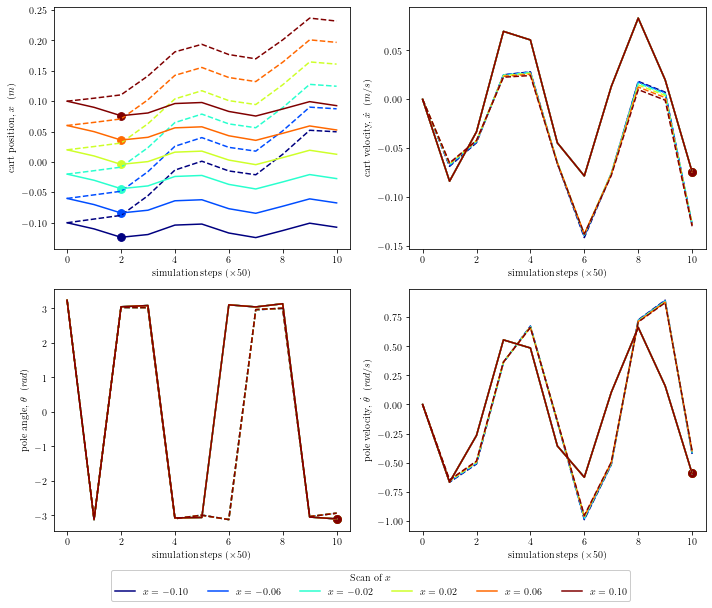

In [75]:
x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
pos_range = np.linspace(-0.1, 0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, pos in enumerate(pos_range):
    x0 = np.array([pos, 0, STABLE_ANG+0.1, STABLE_ANG_VEL])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$x={a:.2f}$".format(a=pos), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__30.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, 0.09, 3.33), (10.00, 0.03, 3.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 0.13, 3.33), (10.00, 0.03, 3.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 0.17, 3.33), (10.00, 0.03, 3.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 0.21, 3.33), (10.00, 0.03, 3.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 0.25, 3.33), (10.00, 0.03, 3.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 0.29, 3.33), (10.00, 0.03, 3.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)


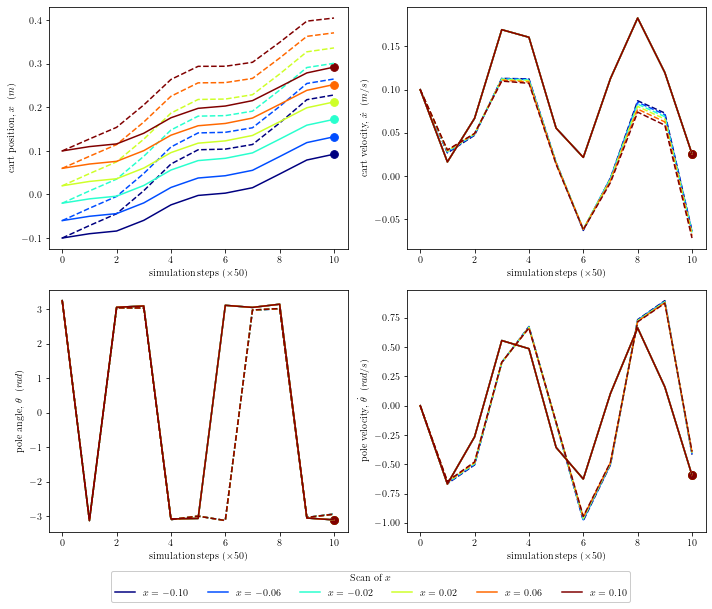

In [76]:
x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
pos_range = np.linspace(-0.1, 0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, pos in enumerate(pos_range):
    x0 = np.array([pos, 0.1, STABLE_ANG+0.1, STABLE_ANG_VEL])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$x={a:.2f}$".format(a=pos), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__31.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, 1.89, 3.33), (4.00, 1.06, 1.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.93, 3.33), (4.00, 1.06, 1.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.97, 3.33), (4.00, 1.06, 1.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.01, 3.33), (4.00, 1.06, 1.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.05, 3.33), (4.00, 1.06, 1.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.09, 3.33), (3.00, 1.07, 1.00), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)


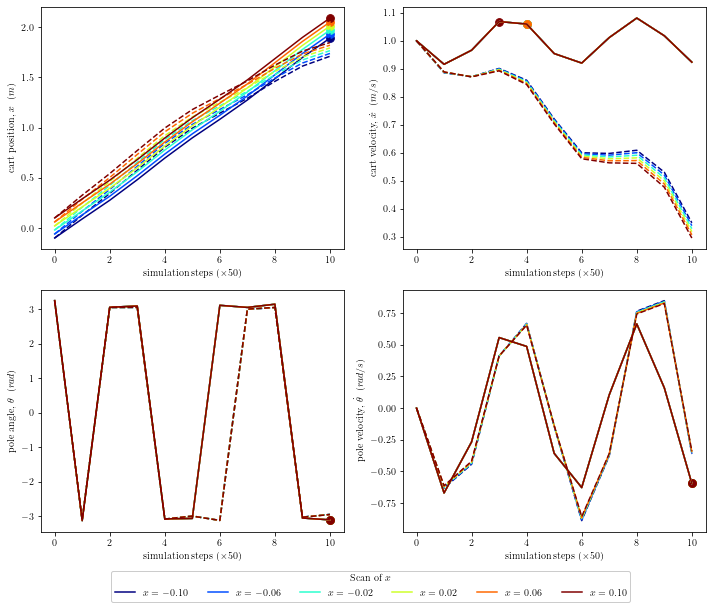

In [77]:
x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
pos_range = np.linspace(-0.1, 0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, pos in enumerate(pos_range):
    x0 = np.array([pos, 1, STABLE_ANG+0.1, STABLE_ANG_VEL])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$x={a:.2f}$".format(a=pos), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__32.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, 1.87, 3.33), (4.00, 1.06, 1.33), (10.00, -3.09, 3.33), (10.00, -0.55, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.91, 3.33), (4.00, 1.06, 1.33), (10.00, -3.09, 3.33), (10.00, -0.55, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.95, 3.33), (4.00, 1.06, 1.33), (10.00, -3.09, 3.33), (10.00, -0.55, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.99, 3.33), (4.00, 1.06, 1.33), (10.00, -3.09, 3.33), (10.00, -0.55, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.03, 3.33), (4.00, 1.06, 1.33), (10.00, -3.09, 3.33), (10.00, -0.55, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.07, 3.33), (4.00, 1.06, 1.33), (10.00, -3.09, 3.33), (10.00, -0.55, 3.33)


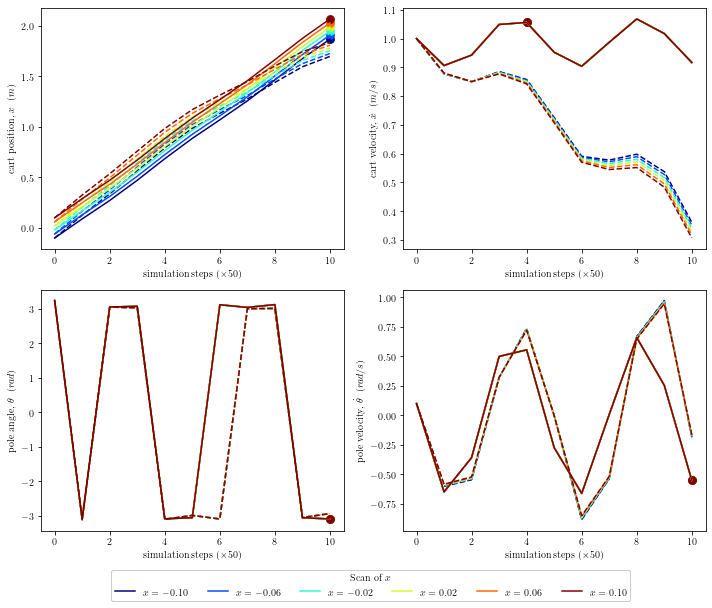

In [78]:
x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
pos_range = np.linspace(-0.1, 0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, pos in enumerate(pos_range):
    x0 = np.array([pos, 1, STABLE_ANG+0.1, 0.1])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$x={a:.2f}$".format(a=pos), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__33.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, 1.42, 3.33), (10.00, 0.83, 3.33), (10.00, -2.86, 3.33), (10.00, 0.69, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.46, 3.33), (10.00, 0.83, 3.33), (10.00, -2.86, 3.33), (10.00, 0.69, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.50, 3.33), (10.00, 0.83, 3.33), (10.00, -2.86, 3.33), (10.00, 0.69, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.54, 3.33), (10.00, 0.83, 3.33), (10.00, -2.86, 3.33), (10.00, 0.69, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.58, 3.33), (10.00, 0.83, 3.33), (10.00, -2.86, 3.33), (10.00, 0.69, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.62, 3.33), (10.00, 0.83, 3.33), (10.00, -2.86, 3.33), (10.00, 0.69, 3.33)


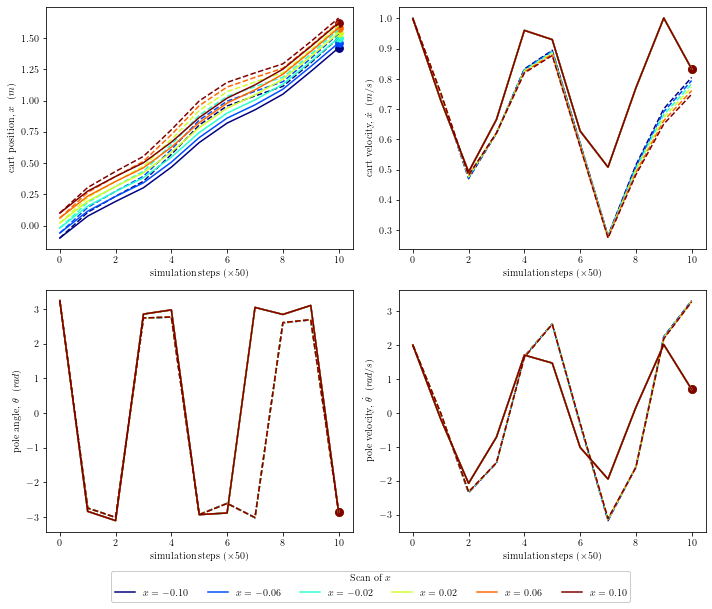

In [79]:
x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
pos_range = np.linspace(-0.1, 0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, pos in enumerate(pos_range):
    x0 = np.array([pos, 1, STABLE_ANG+0.1, 2])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$x={a:.2f}$".format(a=pos), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__34.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, 1.54, 3.33), (10.00, 1.70, 3.33), (10.00, -3.05, 3.33), (10.00, 6.63, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.58, 3.33), (10.00, 1.70, 3.33), (10.00, -3.05, 3.33), (10.00, 6.63, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.62, 3.33), (10.00, 1.70, 3.33), (10.00, -3.05, 3.33), (10.00, 6.63, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.66, 3.33), (10.00, 1.70, 3.33), (10.00, -3.05, 3.33), (10.00, 6.63, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.70, 3.33), (10.00, 1.70, 3.33), (10.00, -3.05, 3.33), (10.00, 6.63, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.74, 3.33), (10.00, 1.70, 3.33), (10.00, -3.05, 3.33), (10.00, 6.63, 3.33)


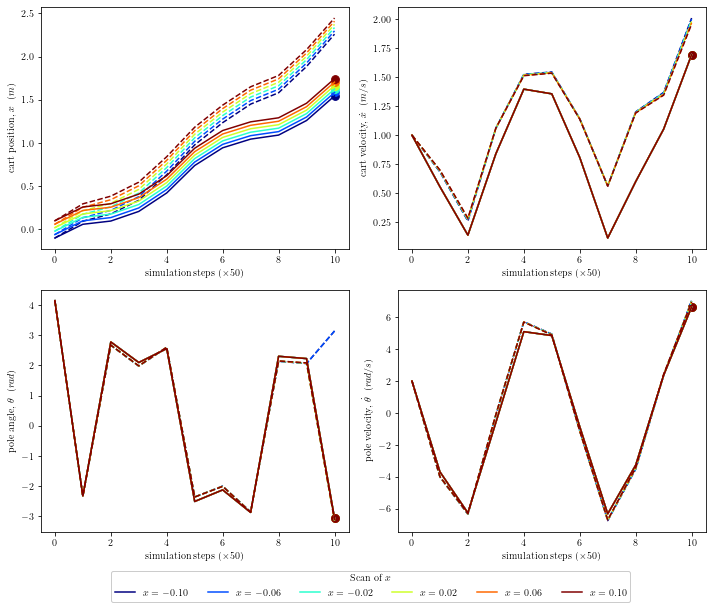

In [81]:
x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
pos_range = np.linspace(-0.1, 0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, pos in enumerate(pos_range):
    x0 = np.array([pos, 1, STABLE_ANG+1, 2])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$x={a:.2f}$".format(a=pos), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__35.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, -3.18, 3.33), (10.00, 1.55, 3.33), (10.00, -2.70, 3.33), (10.00, 5.38, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, -1.18, 3.33), (10.00, 1.55, 3.33), (10.00, -2.70, 3.33), (10.00, 5.38, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 0.82, 3.33), (10.00, 1.55, 3.33), (10.00, -2.70, 3.33), (10.00, 5.38, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.82, 3.33), (10.00, 1.55, 3.33), (10.00, -2.70, 3.33), (10.00, 5.38, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 4.82, 3.33), (10.00, 1.55, 3.33), (10.00, -2.70, 3.33), (10.00, 5.38, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 6.82, 3.33), (10.00, 1.55, 3.33), (10.00, -2.70, 3.33), (10.00, 5.38, 3.33)


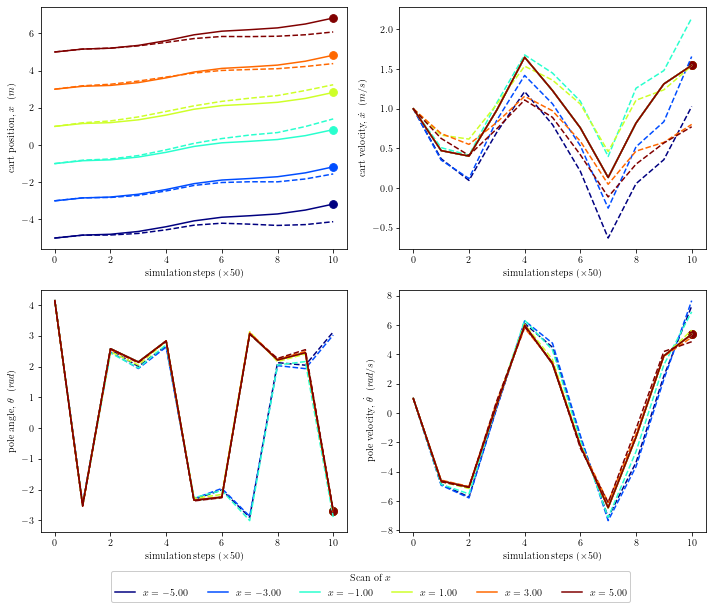

In [82]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
pos_range = np.linspace(-5, 5, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, pos in enumerate(pos_range):
    x0 = np.array([pos, 1, STABLE_ANG+1, 1])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$x={a:.2f}$".format(a=pos), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__36.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:82: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y)


SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, -0.15, 3.33), (10.00, 0.32, 3.33), (10.00, 0.85, 3.33), (8.00, -8.44, 2.67)
(1, 4) (1, 4)
Point of divergence: (5.00, 0.16, 1.67), (10.00, 1.28, 3.33), (6.00, -2.70, 2.00), (10.00, 11.48, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 0.21, 3.33), (10.00, -0.04, 3.33), (10.00, -1.46, 3.33), (10.00, 0.20, 3.33)
(1, 4) (1, 4)
Point of divergence: (7.00, 0.10, 2.33), (10.00, -0.84, 3.33), (10.00, 2.88, 3.33), (10.00, -6.83, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 0.01, 3.33), (10.00, 0.15, 3.33), (10.00, 2.68, 3.33), (10.00, 1.35, 3.33)
(1, 4) (1, 4)
Point of divergence: (2.00, -0.02, 0.67), (10.00, -0.07, 3.33), (10.00, -3.10, 3.33), (10.00, -0.59, 3.33)


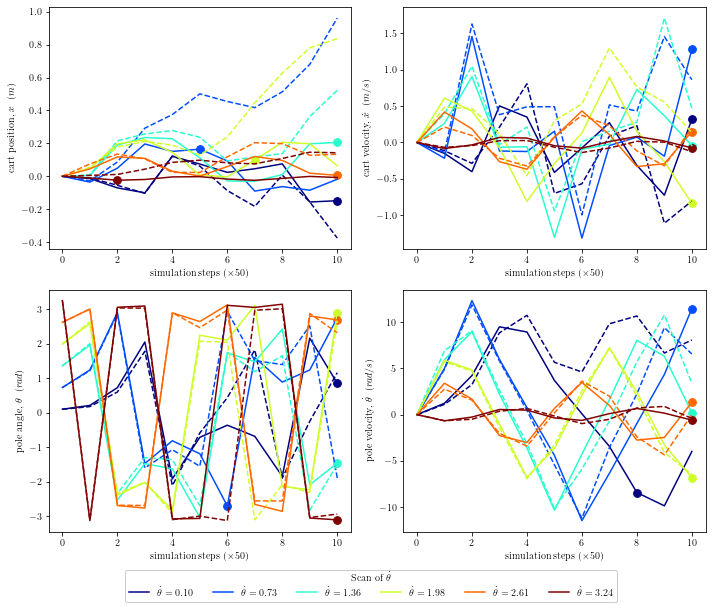

In [83]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
ang_range = np.linspace(0.1, np.pi+0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, ang in enumerate(ang_range):
    x0 = np.array([0, 0, ang , 0])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$\dot \theta={a:.2f}$".format(a=ang), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__40.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, 3.85, 3.33), (10.00, 2.32, 3.33), (10.00, 0.85, 3.33), (10.00, -3.98, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 3.98, 3.33), (10.00, 3.28, 3.33), (6.00, -2.70, 2.00), (10.00, 11.48, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 4.20, 3.33), (10.00, 1.95, 3.33), (10.00, -1.46, 3.33), (10.00, 0.20, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 4.06, 3.33), (10.00, 1.16, 3.33), (10.00, 2.88, 3.33), (10.00, -6.82, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 4.00, 3.33), (10.00, 2.15, 3.33), (10.00, 2.68, 3.33), (10.00, 1.35, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 3.99, 3.33), (3.00, 2.07, 1.00), (10.00, -3.10, 3.33), (10.00, -0.60, 3.33)


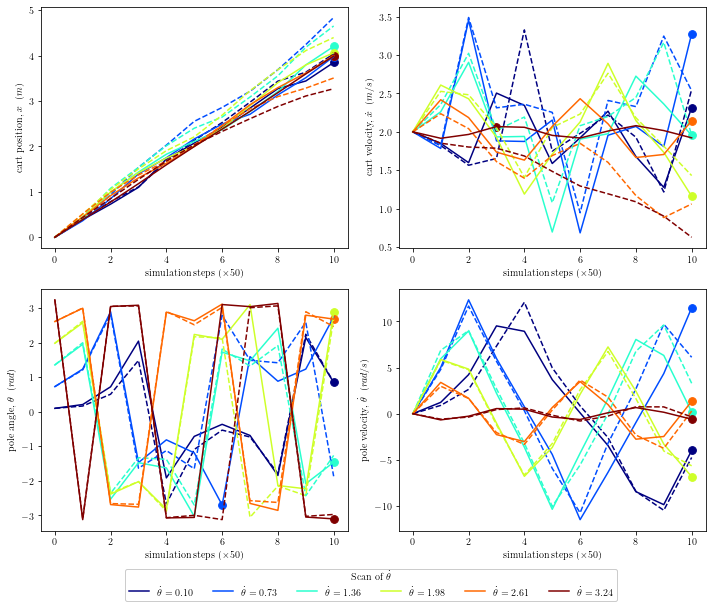

In [85]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
ang_range = np.linspace(0.1, np.pi+0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, ang in enumerate(ang_range):
    x0 = np.array([0, 2, ang , 0])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$\dot \theta={a:.2f}$".format(a=ang), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__41.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, 4.36, 3.33), (10.00, 2.53, 3.33), (10.00, 0.61, 3.33), (10.00, -2.78, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 4.38, 3.33), (10.00, 3.68, 3.33), (10.00, 2.99, 3.33), (10.00, 12.39, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 4.31, 3.33), (10.00, 2.02, 3.33), (10.00, -1.40, 3.33), (10.00, -0.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 3.83, 3.33), (10.00, 1.17, 3.33), (10.00, 2.66, 3.33), (10.00, -6.45, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 3.57, 3.33), (10.00, 2.07, 3.33), (10.00, 2.71, 3.33), (10.00, 2.59, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 3.52, 3.33), (7.00, 1.51, 2.33), (10.00, -2.86, 3.33), (10.00, 0.69, 3.33)


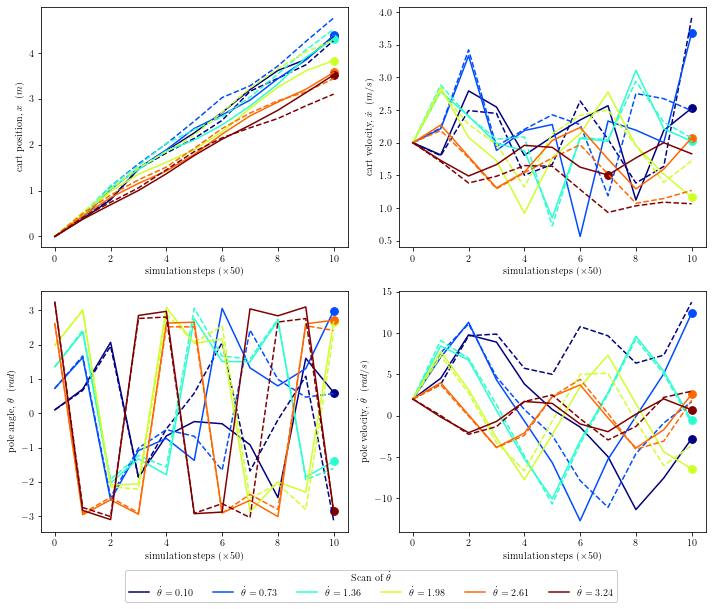

In [89]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
ang_range = np.linspace(0.1, np.pi+0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, ang in enumerate(ang_range):
    x0 = np.array([0, 2, ang , 2])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$\dot \theta={a:.2f}$".format(a=ang), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__41.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, 3.85, 3.33), (10.00, 2.32, 3.33), (10.00, 0.85, 3.33), (10.00, -3.98, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 3.98, 3.33), (10.00, 3.28, 3.33), (10.00, 2.75, 3.33), (10.00, 11.48, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 4.20, 3.33), (10.00, 1.95, 3.33), (10.00, 4.82, 3.33), (10.00, 0.20, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 4.06, 3.33), (10.00, 1.16, 3.33), (10.00, 2.88, 3.33), (10.00, -6.82, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 4.00, 3.33), (10.00, 2.15, 3.33), (10.00, 2.68, 3.33), (10.00, 1.35, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 3.99, 3.33), (3.00, 2.07, 1.00), (10.00, 3.18, 3.33), (10.00, -0.60, 3.33)


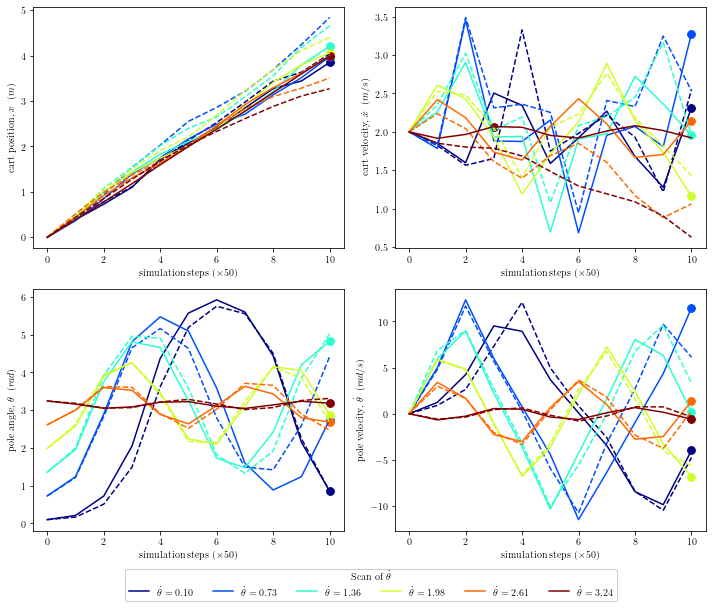

In [90]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 6
colors = plt.cm.jet(np.linspace(0, 1, l))
ang_range = np.linspace(0.1, np.pi+0.1, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, ang in enumerate(ang_range):
    x0 = np.array([0, 2, ang , 0])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
#         cp.remap_angle()
        cp_hat.performAction()
#         cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$\dot \theta={a:.2f}$".format(a=ang), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__50.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:82: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y)


SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, -19.99, 3.33), (10.00, -10.13, 3.33), (10.00, 0.46, 3.33), (5.00, -2.96, 1.67)
(1, 4) (1, 4)
Point of divergence: (10.00, -14.28, 3.33), (5.00, -6.87, 1.67), (7.00, -2.99, 2.33), (10.00, 1.08, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, -8.57, 3.33), (6.00, -3.87, 2.00), (7.00, -2.11, 2.33), (10.00, -0.07, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, -2.90, 3.33), (5.00, -1.37, 1.67), (9.00, 1.54, 3.00), (5.00, -0.47, 1.67)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.90, 3.33), (8.00, 2.59, 2.67), (9.00, -1.54, 3.00), (10.00, 2.78, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 8.57, 3.33), (5.00, 4.11, 1.67), (5.00, 0.21, 1.67), (5.00, 1.37, 1.67)
(1, 4) (1, 4)
Point of divergence: (10.00, 14.28, 3.33), (5.00, 6.87, 1.67), (7.00, 2.99, 2.33), (5.00, 2.21, 1.67)
(1, 4) (1, 4)
Point of divergence: (10.00, 19.99, 3.33), (7.00, 11.34, 2.33), (10.00, -0.46, 3.33), (7.00, 12.45, 

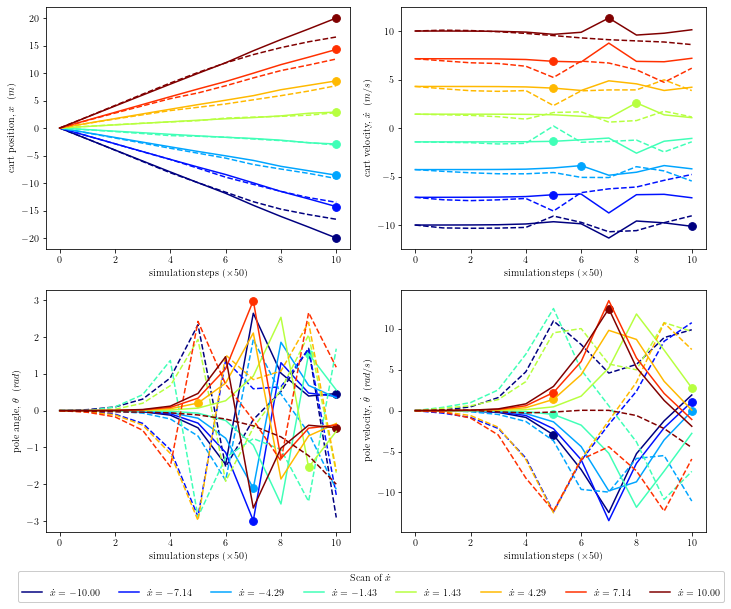

In [93]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 8
colors = plt.cm.jet(np.linspace(0, 1, l))
_, vel_range, *_ = get_ranges(l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, vel in enumerate(vel_range):
    x0 = np.array([0, vel, 0 , 0])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$\dot x={a:.2f}$".format(a=vel), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $\dot x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__60.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, -19.65, 3.33), (10.00, -9.38, 3.33), (9.00, 2.22, 3.00), (10.00, -4.33, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, -13.94, 3.33), (7.00, -6.58, 2.33), (10.00, 0.85, 3.33), (10.00, -4.33, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, -8.23, 3.33), (7.00, -3.73, 2.33), (10.00, 0.85, 3.33), (10.00, -4.33, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, -2.53, 3.33), (10.00, -0.83, 3.33), (10.00, 0.85, 3.33), (10.00, -4.32, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 3.18, 3.33), (10.00, 2.03, 3.33), (10.00, 0.85, 3.33), (8.00, -8.30, 2.67)
(1, 4) (1, 4)
Point of divergence: (10.00, 8.89, 3.33), (7.00, 4.83, 2.33), (10.00, 0.85, 3.33), (10.00, -4.32, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 14.60, 3.33), (5.00, 7.16, 1.67), (10.00, 0.85, 3.33), (10.00, -4.32, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 20.31, 3.33), (9.00, 9.42, 3.00), (10.00,

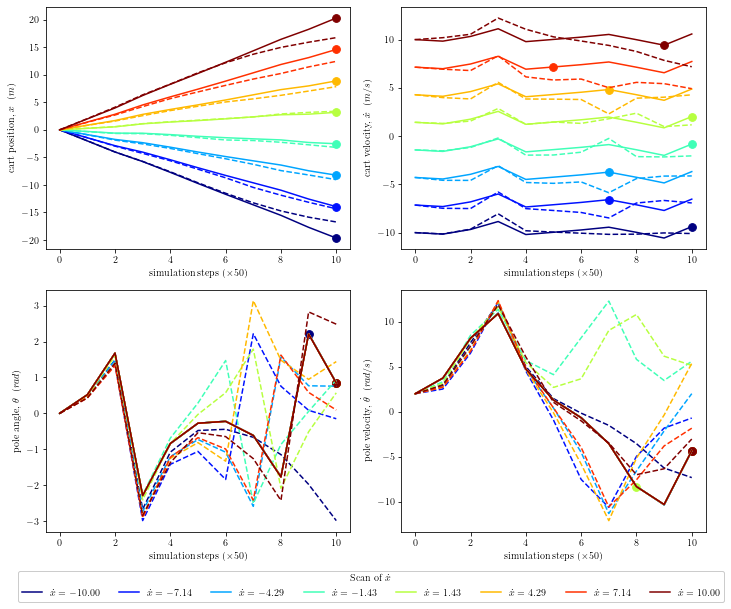

In [94]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 8
colors = plt.cm.jet(np.linspace(0, 1, l))
_, vel_range, *_ = get_ranges(l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, vel in enumerate(vel_range):
    x0 = np.array([0, vel, 0 , 2])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$\dot x={a:.2f}$".format(a=vel), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $\dot x$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__61.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (10.00, -3.55, 3.33), (10.00, -2.51, 3.33), (10.00, 2.09, 3.33), (10.00, -14.52, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, -2.56, 3.33), (9.00, -1.40, 3.00), (10.00, 1.74, 3.33), (10.00, -10.95, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, -1.54, 3.33), (10.00, -0.33, 3.33), (10.00, 1.25, 3.33), (10.00, -7.48, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, -0.35, 3.33), (8.00, -0.33, 2.67), (8.00, 1.45, 2.67), (10.00, 5.29, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 0.35, 3.33), (10.00, 0.59, 3.33), (10.00, 1.04, 3.33), (9.00, -12.57, 3.00)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.54, 3.33), (10.00, 0.33, 3.33), (5.00, 2.27, 1.67), (10.00, 7.48, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.56, 3.33), (10.00, 1.34, 3.33), (10.00, -1.74, 3.33), (10.00, 10.95, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 3.55, 3.33), (10.00, 2.51, 3.33), (10.00,

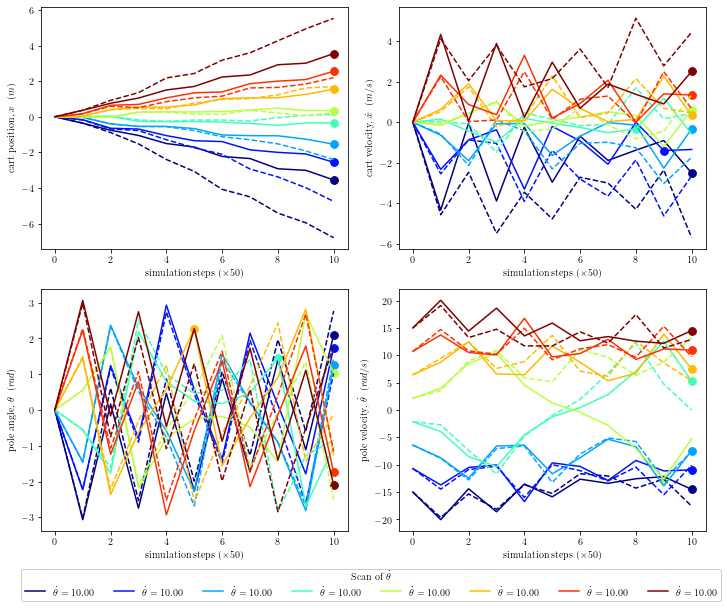

In [95]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 8
colors = plt.cm.jet(np.linspace(0, 1, l))
*_, ang_vel_range, _  = get_ranges(l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, ang_vel in enumerate(ang_vel_range):
    x0 = np.array([0, 0, 0, ang_vel])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$\dot \theta={a:.2f}$".format(a=ang_vel), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__62.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]
(1, 4) (1, 4)
Point of divergence: (5.00, -0.70, 1.67), (10.00, -1.51, 3.33), (10.00, 2.09, 3.33), (10.00, -14.52, 3.33)
(1, 4) (1, 4)
Point of divergence: (6.00, -0.20, 2.00), (10.00, -0.35, 3.33), (10.00, 1.74, 3.33), (10.00, -10.95, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 0.45, 3.33), (10.00, 0.66, 3.33), (10.00, 1.25, 3.33), (10.00, -7.48, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 1.65, 3.33), (8.00, 0.67, 2.67), (10.00, -1.04, 3.33), (10.00, 5.29, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 2.34, 3.33), (10.00, 1.59, 3.33), (10.00, 1.04, 3.33), (10.00, -5.28, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 3.54, 3.33), (10.00, 1.33, 3.33), (5.00, 2.27, 1.67), (10.00, 7.48, 3.33)
(1, 4) (1, 4)
Point of divergence: (10.00, 4.55, 3.33), (10.00, 2.34, 3.33), (10.00, -1.74, 3.33), (9.00, 11.15, 3.00)
(1, 4) (1, 4)
Point of divergence: (10.00, 5.55, 3.33), (8.00, 2.38, 2.67), (10.00, -2.0

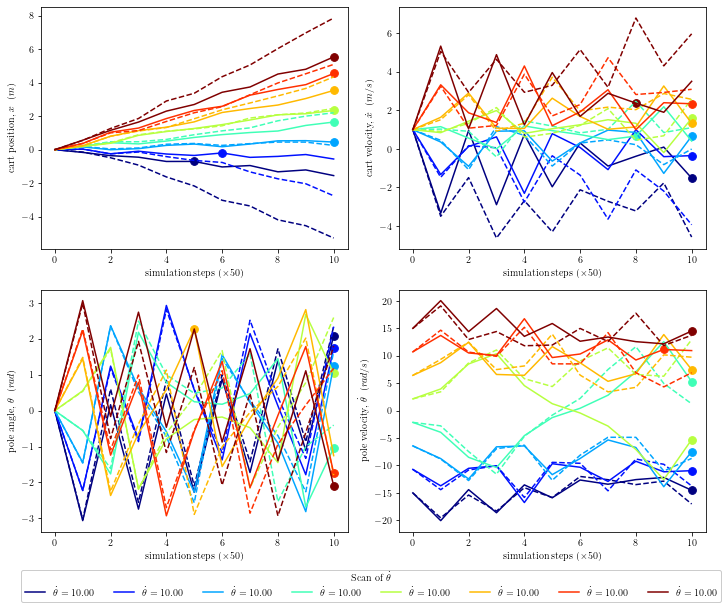

In [99]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 8
colors = plt.cm.jet(np.linspace(0, 1, l))
*_, ang_vel_range, _  = get_ranges(l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_hat = CartPoleHat(False)
T = 10
steps = np.arange(0, T + 1)

for i, ang_vel in enumerate(ang_vel_range):
    x0 = np.array([0, 1, 0, ang_vel])
    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]
    print(x.shape, x_hat.shape)
    for _ in steps[1:]:
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()
        
        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$", label=r"$\dot \theta={a:.2f}$".format(a=ang_vel), color=colors[i])
    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_1__63.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]


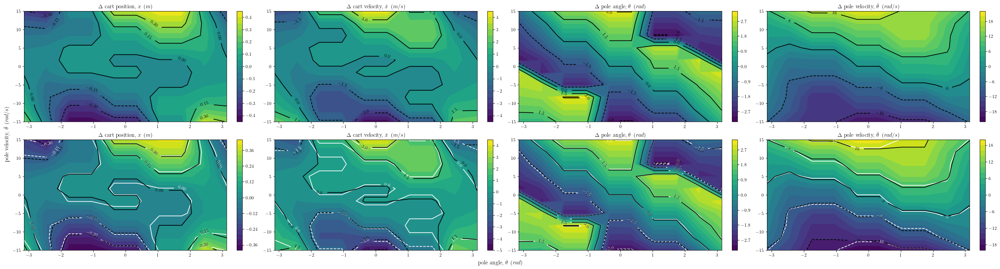

In [116]:
from utilities import *

from task2 import *

x, _, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 10
*target_ranges, _  = get_ranges(l)

fig, axs = plt.subplots(2, 4, figsize=(30, 8), layout='constrained')

p, q = 2, 3
z0 = np.array([UNSTABLE_POS, UNSTABLE_VEL, UNSTABLE_ANG, UNSTABLE_ANG_VEL])
x, y = np.meshgrid(target_ranges[p], target_ranges[q], indexing='ij')

z = np.zeros(4)
z_hat = np.zeros(4)

cp = CartPole(False)
cp_hat = CartPoleHat(False)

cp_hat.setTrainedParams(w, xi, sigma)

for i in range(len(x)):
    for j in range(len(y)):
        z0[p] = x[i][j]
        z0[q] = y[i][j]

        cp.setState(z0)
        cp_hat.setState(z0)
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()

        z = np.vstack([z, cp.getState()])
        z_hat = np.vstack([z_hat, cp_hat.getState()])

        cp.reset()
        cp_hat.reset()


xlim = (x.min(), x.max())
ylim = (y.min(), y.max())
t2_1_plot_states_contour(x, y, z, fig, axs[0], xlim=xlim, ylim=ylim, colors='black')
t2_1_plot_states_contour(x, y, z, fig, axs[1], xlim=xlim, ylim=ylim, colors='white')
t2_1_plot_states_contour(x, y, z_hat, fig, axs[1], xlim=xlim, ylim=ylim, colors='black')

    
fig.supxlabel(STATE_LABELS[p])
fig.supylabel(STATE_LABELS[q])
fig.savefig("./assets2/task2_1__70.png")

Samples drawn: 2048
SE: [  1.75409662 135.921147     6.05264973 561.67482931]


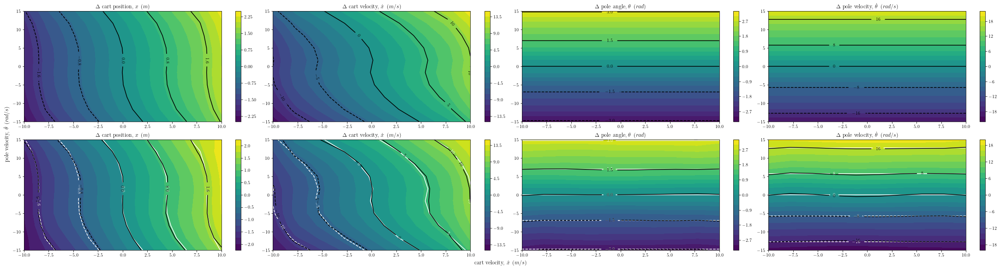

In [117]:
from utilities import *

from task2 import *

x, _, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 10
*target_ranges, _  = get_ranges(l)

fig, axs = plt.subplots(2, 4, figsize=(30, 8), layout='constrained')

p, q = 1, 3
z0 = np.array([UNSTABLE_POS, UNSTABLE_VEL, UNSTABLE_ANG, UNSTABLE_ANG_VEL])
x, y = np.meshgrid(target_ranges[p], target_ranges[q], indexing='ij')

z = np.zeros(4)
z_hat = np.zeros(4)

cp = CartPole(False)
cp_hat = CartPoleHat(False)

cp_hat.setTrainedParams(w, xi, sigma)

for i in range(len(x)):
    for j in range(len(y)):
        z0[p] = x[i][j]
        z0[q] = y[i][j]

        cp.setState(z0)
        cp_hat.setState(z0)
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()

        z = np.vstack([z, cp.getState()])
        z_hat = np.vstack([z_hat, cp_hat.getState()])

        cp.reset()
        cp_hat.reset()


xlim = (x.min(), x.max())
ylim = (y.min(), y.max())
t2_1_plot_states_contour(x, y, z, fig, axs[0], xlim=xlim, ylim=ylim, colors='black')
t2_1_plot_states_contour(x, y, z, fig, axs[1], xlim=xlim, ylim=ylim, colors='white')
t2_1_plot_states_contour(x, y, z_hat, fig, axs[1], xlim=xlim, ylim=ylim, colors='black')

    
fig.supxlabel(STATE_LABELS[p])
fig.supylabel(STATE_LABELS[q])
fig.savefig("./assets2/task2_1__71.png")

Samples drawn: 2048


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:82: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y)


SE: [  1.75409662 135.921147     6.05264973 561.67482931]


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:407: UserWarning: The following kwargs were not used by contour: 'negative_linestyles'
  cntr1 = axs[0].contourf(x, y, z0, linestyles='solid', negative_linestyles='dashed', levels=levels)
/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:408: UserWarning: The following kwargs were not used by contour: 'negative_linestyles'
  cntr2 = axs[1].contourf(x, y, z1, linestyles='solid', negative_linestyles='dashed', levels=levels)
/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:409: UserWarning: The following kwargs were not used by contour: 'negative_linestyles'
  cntr3 = axs[2].contourf(x, y, z2, linestyles='solid', negative_linestyles='dashed', levels=levels)
/Users/chongzhenyuen/Library/CloudSto

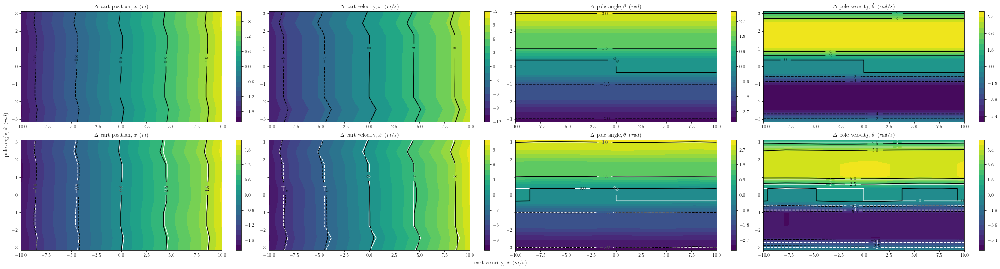

In [118]:
from utilities import *

from task2 import *

x, _, _ , w, _ = compute_weights(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 10
*target_ranges, _  = get_ranges(l)

fig, axs = plt.subplots(2, 4, figsize=(30, 8), layout='constrained')

p, q = 1, 2
z0 = np.array([UNSTABLE_POS, UNSTABLE_VEL, UNSTABLE_ANG, UNSTABLE_ANG_VEL])
x, y = np.meshgrid(target_ranges[p], target_ranges[q], indexing='ij')

z = np.zeros(4)
z_hat = np.zeros(4)

cp = CartPole(False)
cp_hat = CartPoleHat(False)

cp_hat.setTrainedParams(w, xi, sigma)

for i in range(len(x)):
    for j in range(len(y)):
        z0[p] = x[i][j]
        z0[q] = y[i][j]

        cp.setState(z0)
        cp_hat.setState(z0)
        cp.performAction()
        cp.remap_angle()
        cp_hat.performAction()
        cp_hat.remap_angle()

        z = np.vstack([z, cp.getState()])
        z_hat = np.vstack([z_hat, cp_hat.getState()])

        cp.reset()
        cp_hat.reset()


xlim = (x.min(), x.max())
ylim = (y.min(), y.max())
t2_1_plot_states_contour(x, y, z, fig, axs[0], xlim=xlim, ylim=ylim, colors='black')
t2_1_plot_states_contour(x, y, z, fig, axs[1], xlim=xlim, ylim=ylim, colors='white')
t2_1_plot_states_contour(x, y, z_hat, fig, axs[1], xlim=xlim, ylim=ylim, colors='black')

    
fig.supxlabel(STATE_LABELS[p])
fig.supylabel(STATE_LABELS[q])
fig.savefig("./assets2/task2_1__72.png")

# Task 2.2

In [119]:
# Use 320 basis functions and 2**12 data points 

x, xi, _, _, _, w, _, _, _ = compute_weights_tts_with_action(2**12, 320, basis_placement='sobol')
sigma = x.std(axis=0)

Samples drawn: 4096
(4096, 320)


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:211: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  axs[0,1].plot(x, y[:, 1], color=color, linestyle='solid')


(320, 4)
SE: [  39.92745866 1298.41294049  120.72269633 7291.77432854]


Point of divergence: (10.00, -25.56, 3.33), (10.00, -25.52, 3.33), (10.00, 1.79, 3.33), (10.00, -5.20, 3.33)
Point of divergence: (10.00, -9.83, 3.33), (10.00, -10.08, 3.33), (10.00, 2.98, 3.33), (10.00, -2.34, 3.33)
Point of divergence: (10.00, 9.83, 3.33), (10.00, 10.08, 3.33), (10.00, 3.31, 3.33), (10.00, 2.34, 3.33)
Point of divergence: (10.00, 25.56, 3.33), (10.00, 25.52, 3.33), (10.00, 4.50, 3.33), (10.00, 5.20, 3.33)


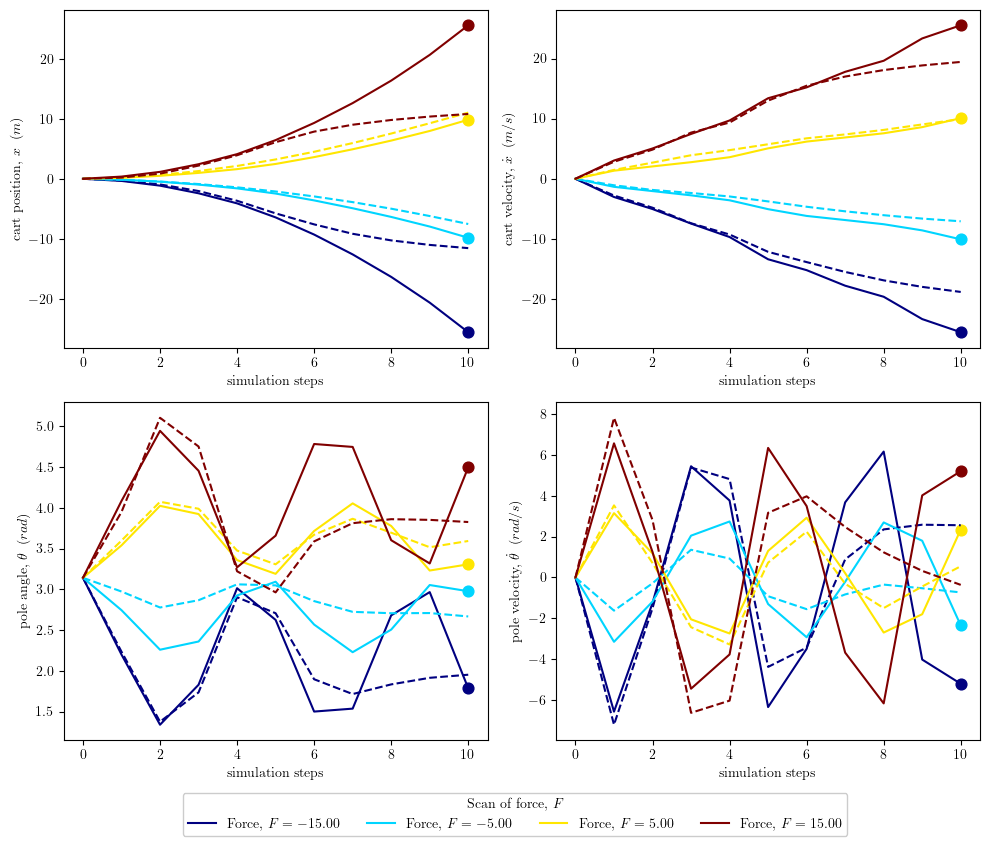

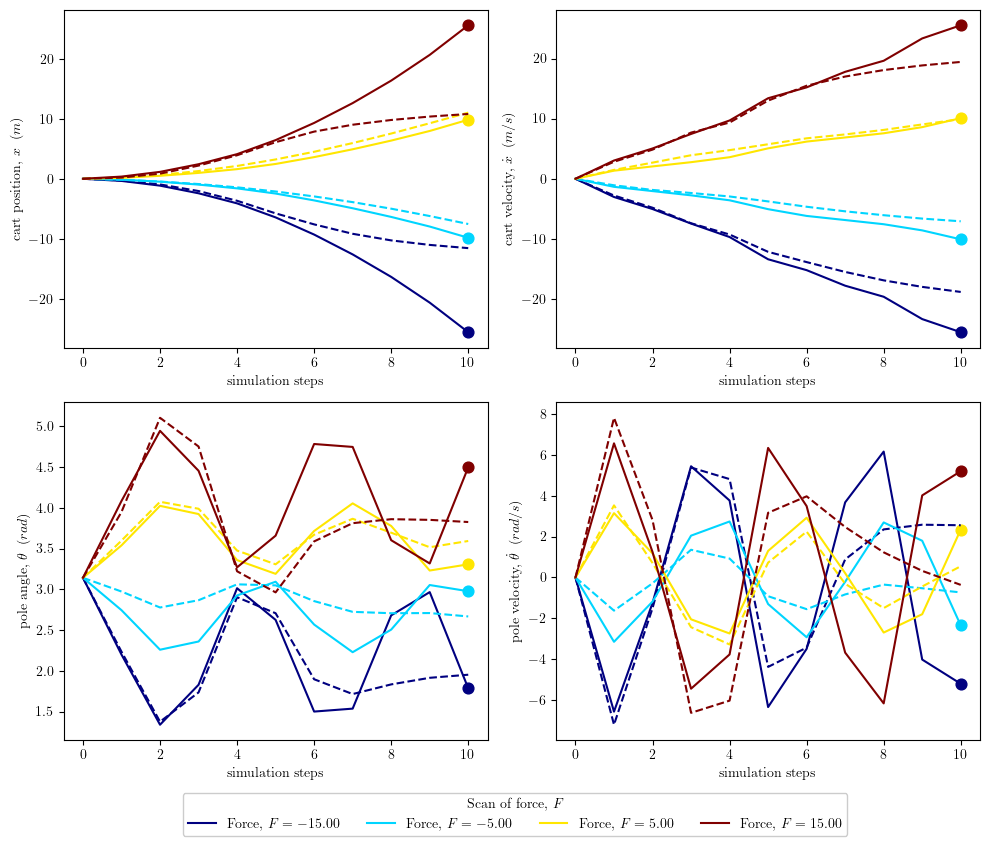

In [23]:
l = 4
colors = plt.cm.jet(np.linspace(0, 1, l))
_, _, _, _, force_range = get_ranges(l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
T = 10
steps = np.arange(0, T + 1)

for i, force in enumerate(force_range):
    x0 = np.array([STABLE_POS, STABLE_VEL, STABLE_ANG, STABLE_ANG_VEL, force])
    cp.setState(x0[:4])
    
    x = x0[None, :]
    x_hat = x0[None, :]
    
    for _ in steps[1:]:
        cp.performAction(force)
        t = cp.getState()
        t = np.hstack([t, force])
        x = np.vstack([x, t])
        
        prev = x_hat[-1, :]
        
        kernel = K(prev, xi, sigma, dim=5)
        t = kernel @ w
        t = np.hstack([t, np.zeros((1, 1))])
        x_hat = np.vstack([x_hat, t + prev])
        
    t2_1_roll_out(steps, x, x_hat, fig=fig, axs=axs, xlabel=r"simulation steps", label=r"Force, $F={a:.2f}$".format(a=force), color=colors[i])

    cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of force, $F$", bbox_to_anchor=(0.52, -0.06))
fig.tight_layout()
fig.savefig("./assets2/task2_2__1.png", bbox_extra_artists=(), bbox_inches='tight')
fig

Point of divergence: (1.00, 0.00, 0.33), (1.00, 0.01, 0.33), (10.00, -3.14, 3.33), (1.00, 0.00, 0.33)
Point of divergence: (10.00, 3.52, 3.33), (6.00, 1.63, 2.00), (10.00, -2.86, 3.33), (10.00, 0.69, 3.33)
Point of divergence: (10.00, 3.52, 3.33), (6.00, 1.63, 2.00), (10.00, -2.86, 3.33), (10.00, 0.69, 3.33)
Point of divergence: (6.00, 0.36, 2.00), (5.00, 1.91, 1.67), (0.00, -3.04, 0.00), (10.00, -1.55, 3.33)
Point of divergence: (10.00, 27.50, 3.33), (4.00, 13.95, 1.33), (10.00, -2.86, 3.33), (4.00, 1.71, 1.33)
Point of divergence: (10.00, 24.37, 3.33), (4.00, 11.88, 1.33), (0.00, -3.04, 0.00), (10.00, -1.51, 3.33)
Point of divergence: (10.00, 13.86, 3.33), (9.00, 6.35, 3.00), (10.00, 1.95, 3.33), (10.00, -0.11, 3.33)
Point of divergence: (10.00, 4.21, 3.33), (10.00, 1.81, 3.33), (10.00, -1.89, 3.33), (10.00, -4.15, 3.33)
Point of divergence: (4.00, 0.13, 1.33), (4.00, 0.34, 1.33), (4.00, -1.90, 1.33), (10.00, -3.94, 3.33)
Point of divergence: (10.00, 4.36, 3.33), (6.00, 2.35, 2.00), 

Text(0.5, 0.98, 'From stable equilibrium')

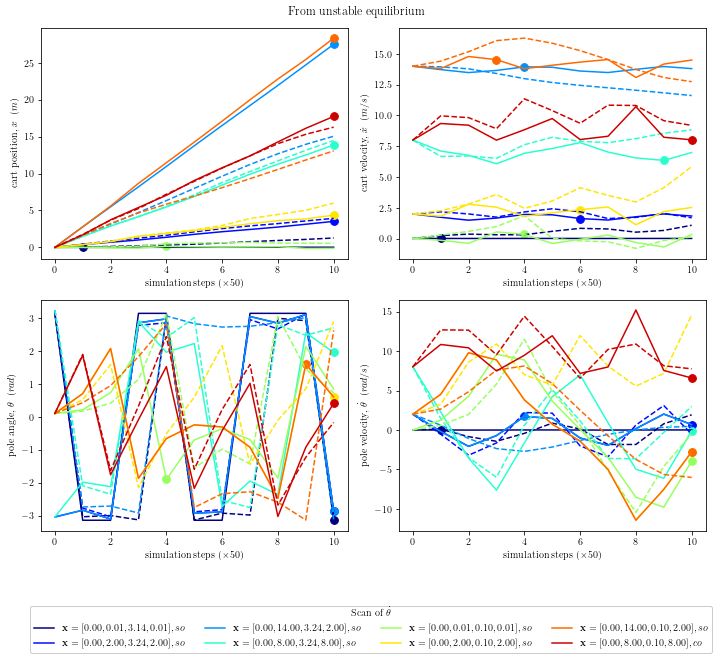

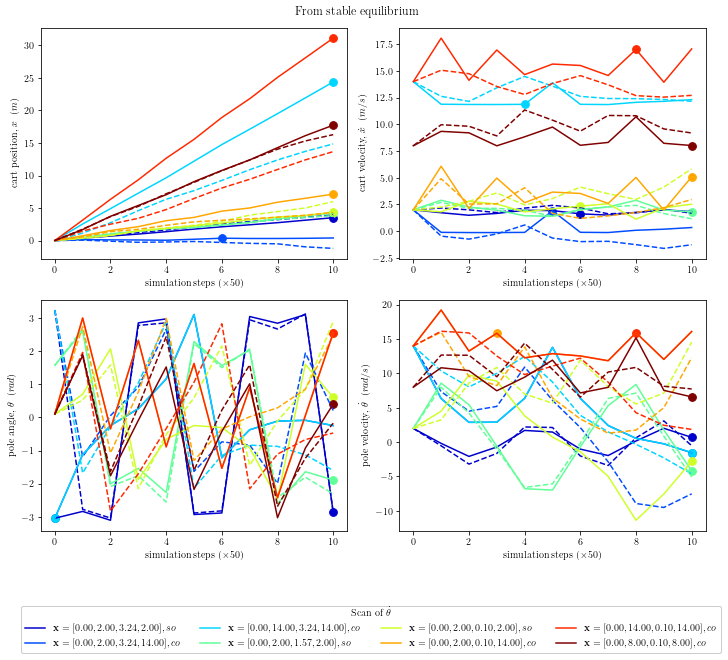

In [177]:
from task2 import *


complete_oscillations = {}
initial_states = ROLLOUT_INITIAL_CONTIDITIONS

l = len(initial_states)
colors = plt.cm.jet(np.linspace(0, 1, l))
fig1, axs1 = plt.subplots(2, 2, figsize=(10, 8), layout='tight')
fig2, axs2 = plt.subplots(2, 2, figsize=(10, 8), layout='tight')
fig = [fig1, fig2]
axs = [axs1, axs2]

T = 10
steps = np.arange(0, T + 1)
action = 0

for i, x0 in enumerate(initial_states):
    complete_oscillations[tuple(x0)] = False
    x0 = np.array(x0)
    cp = CartPole(False)
    cp_noremap = CartPole(False)
    cp_hat = CartPoleHat(False)

    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]

    for _ in steps[1:]:
        cp.performAction(action)
        cp_hat.performAction(action)
        
        if abs(cp.getState()[2]) > 2 * np.pi: complete_oscillations[tuple(x0)] = True
            
        cp_hat.remap_angle()

        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
    
    for j in range(len(x)): x[j][2] = remap_angle(x[j][2])
    x0_str = np.array2string(x0, precision=2, separator=', ', suppress_small=True, floatmode='fixed')
    
    t2_1_roll_out(steps, x, x_hat, fig=fig[i % 2], axs=axs[i % 2], xlabel=r"simulation steps $(\times 50)$", label=r"$\mathbf x={a}, {b}$".format(a=x0_str, b='co' if complete_oscillations[tuple(x0)] else 'so'), color=colors[i])    
    

lgd = fig1.legend(loc="lower center", framealpha=1, ncol=4, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.15))
fig1.tight_layout()
fig1.savefig("./assets2/task2_2__10.png", bbox_extra_artists=(lgd,), bbox_inches='tight')   
fig1.suptitle("From unstable equilibrium")

lgd = fig2.legend(loc="lower center", framealpha=1, ncol=4, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.15))
fig2.tight_layout()
fig2.savefig("./assets2/task2_2__11.png", bbox_extra_artists=(lgd,), bbox_inches='tight')
fig2.suptitle("From stable equilibrium")

Point of divergence: (10.00, 5.01, 3.33), (10.00, 5.15, 3.33), (4.00, -3.05, 1.33), (10.00, 1.39, 3.33)
Point of divergence: (10.00, 8.51, 3.33), (10.00, 6.94, 3.33), (10.00, -2.77, 3.33), (10.00, 1.93, 3.33)
Point of divergence: (10.00, 8.51, 3.33), (10.00, 6.94, 3.33), (10.00, -2.77, 3.33), (10.00, 1.93, 3.33)
Point of divergence: (10.00, 5.42, 3.33), (10.00, 5.56, 3.33), (0.00, -3.04, 0.00), (10.00, -3.85, 3.33)
Point of divergence: (10.00, 32.49, 3.33), (10.00, 18.92, 3.33), (10.00, -2.77, 3.33), (10.00, 1.93, 3.33)
Point of divergence: (10.00, 29.40, 3.33), (10.00, 17.55, 3.33), (0.00, -3.04, 0.00), (10.00, -3.96, 3.33)
Point of divergence: (10.00, 18.86, 3.33), (10.00, 11.95, 3.33), (10.00, 2.21, 3.33), (10.00, -0.25, 3.33)
Point of divergence: (10.00, 9.17, 3.33), (10.00, 6.99, 3.33), (10.00, -1.14, 3.33), (10.00, -1.30, 3.33)
Point of divergence: (10.00, 5.12, 3.33), (10.00, 4.73, 3.33), (4.00, 1.54, 1.33), (10.00, 2.13, 3.33)
Point of divergence: (10.00, 9.30, 3.33), (10.00, 7

Text(0.5, 0.98, 'From stable equilibrium')

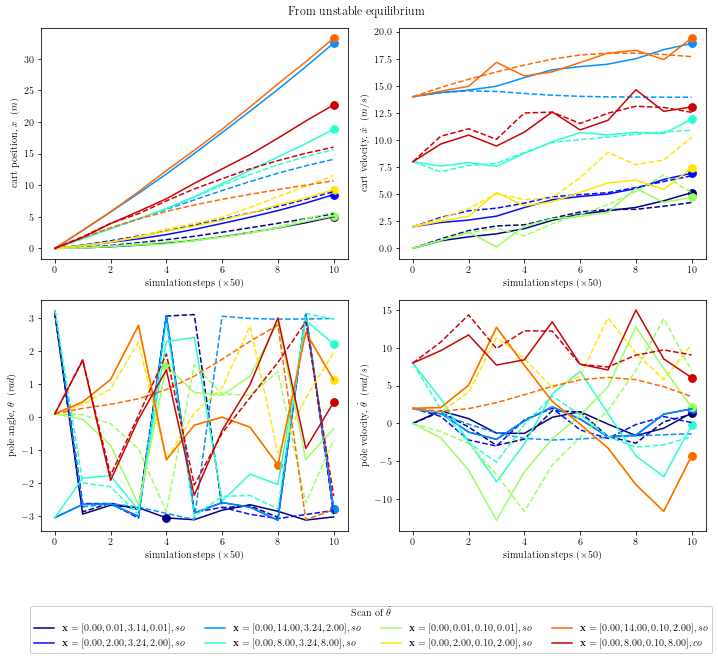

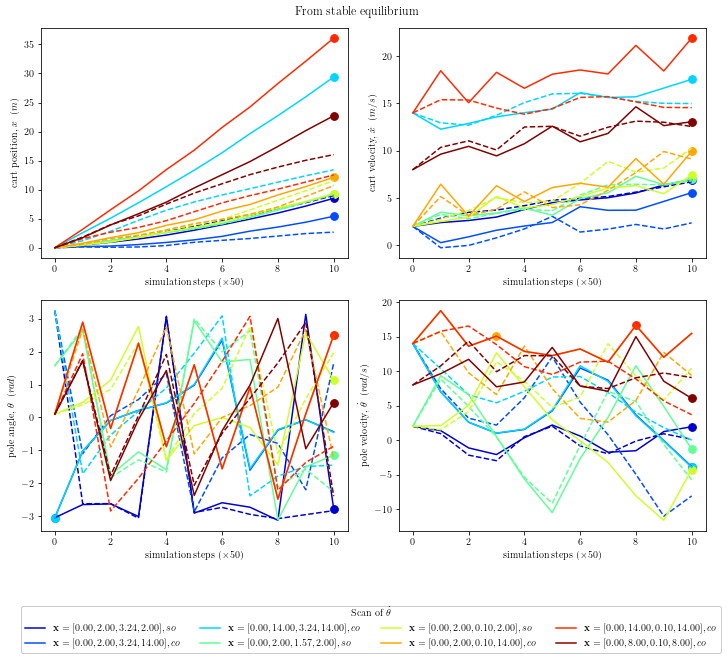

In [179]:
from task2 import *


complete_oscillations = {}
initial_states = ROLLOUT_INITIAL_CONTIDITIONS

l = len(initial_states)
colors = plt.cm.jet(np.linspace(0, 1, l))
fig1, axs1 = plt.subplots(2, 2, figsize=(10, 8), layout='tight')
fig2, axs2 = plt.subplots(2, 2, figsize=(10, 8), layout='tight')
fig = [fig1, fig2]
axs = [axs1, axs2]

T = 10
steps = np.arange(0, T + 1)
action = 2.5

for i, x0 in enumerate(initial_states):
    complete_oscillations[tuple(x0)] = False
    x0 = np.array(x0)
    cp = CartPole(False)
    cp_noremap = CartPole(False)
    cp_hat = CartPoleHat(False)

    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]

    for _ in steps[1:]:
        cp.performAction(action)
        cp_hat.performAction(action)
        
        if abs(cp.getState()[2]) > 2 * np.pi: complete_oscillations[tuple(x0)] = True
            
        cp_hat.remap_angle()

        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
    
    for j in range(len(x)): x[j][2] = remap_angle(x[j][2])
    x0_str = np.array2string(x0, precision=2, separator=', ', suppress_small=True, floatmode='fixed')
    
    t2_1_roll_out(steps, x, x_hat, fig=fig[i % 2], axs=axs[i % 2], xlabel=r"simulation steps $(\times 50)$", label=r"$\mathbf x={a}, {b}$".format(a=x0_str, b='co' if complete_oscillations[tuple(x0)] else 'so'), color=colors[i])    
    

lgd = fig1.legend(loc="lower center", framealpha=1, ncol=4, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.15))
fig1.tight_layout()
fig1.savefig("./assets2/task2_2__12.png", bbox_extra_artists=(lgd,), bbox_inches='tight')   
fig1.suptitle("From unstable equilibrium")

lgd = fig2.legend(loc="lower center", framealpha=1, ncol=4, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.15))
fig2.tight_layout()
fig2.savefig("./assets2/task2_2__13.png", bbox_extra_artists=(lgd,), bbox_inches='tight')
fig2.suptitle("From stable equilibrium")

Point of divergence: (10.00, 9.85, 3.33), (10.00, 10.09, 3.33), (10.00, -2.98, 3.33), (10.00, 2.35, 3.33)
Point of divergence: (10.00, 13.35, 3.33), (10.00, 11.88, 3.33), (0.00, -3.04, 0.00), (10.00, 3.04, 3.33)
Point of divergence: (10.00, 13.35, 3.33), (10.00, 11.88, 3.33), (0.00, -3.04, 0.00), (10.00, 3.04, 3.33)
Point of divergence: (10.00, 10.40, 3.33), (10.00, 9.53, 3.33), (0.00, -3.04, 0.00), (10.00, 7.26, 3.33)
Point of divergence: (10.00, 37.32, 3.33), (10.00, 23.86, 3.33), (0.00, -3.04, 0.00), (10.00, 3.03, 3.33)
Point of divergence: (10.00, 34.38, 3.33), (10.00, 21.52, 3.33), (0.00, -3.04, 0.00), (10.00, 7.30, 3.33)
Point of divergence: (10.00, 23.70, 3.33), (10.00, 16.91, 3.33), (10.00, 2.44, 3.33), (10.00, 1.34, 3.33)
Point of divergence: (10.00, 13.96, 3.33), (10.00, 11.80, 3.33), (5.00, -3.05, 1.67), (10.00, -0.67, 3.33)
Point of divergence: (10.00, 9.99, 3.33), (10.00, 10.37, 3.33), (3.00, 2.06, 1.00), (10.00, -6.44, 3.33)
Point of divergence: (10.00, 14.39, 3.33), (10.

Text(0.5, 0.98, 'From stable equilibrium')

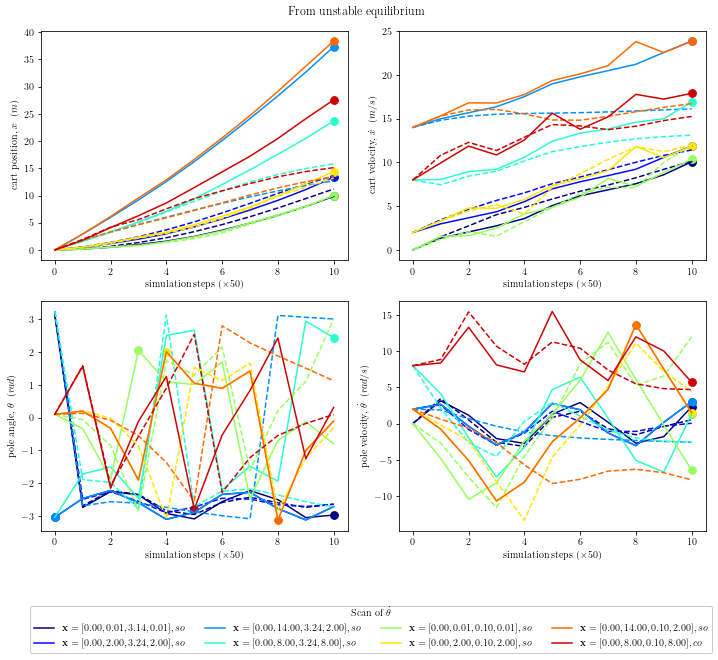

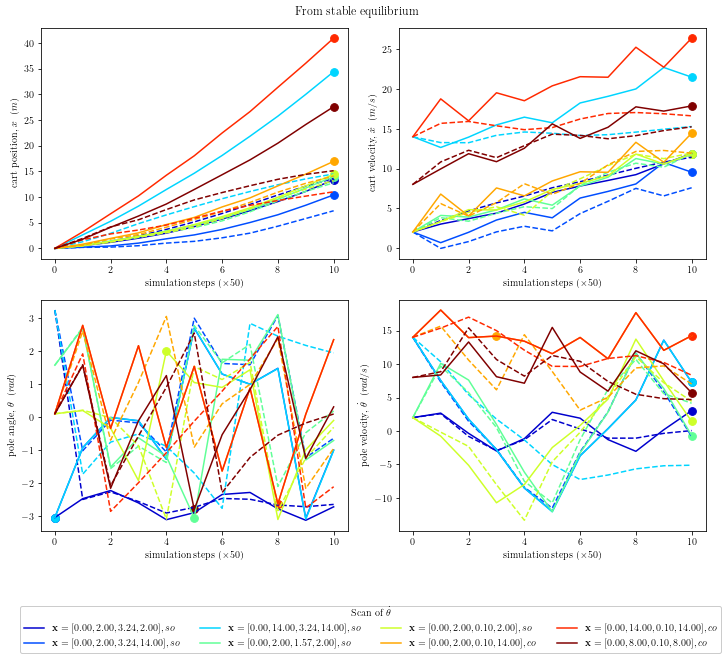

In [180]:
from task2 import *


complete_oscillations = {}
initial_states = ROLLOUT_INITIAL_CONTIDITIONS

l = len(initial_states)
colors = plt.cm.jet(np.linspace(0, 1, l))
fig1, axs1 = plt.subplots(2, 2, figsize=(10, 8), layout='tight')
fig2, axs2 = plt.subplots(2, 2, figsize=(10, 8), layout='tight')
fig = [fig1, fig2]
axs = [axs1, axs2]

T = 10
steps = np.arange(0, T + 1)
action = 5

for i, x0 in enumerate(initial_states):
    complete_oscillations[tuple(x0)] = False
    x0 = np.array(x0)
    cp = CartPole(False)
    cp_noremap = CartPole(False)
    cp_hat = CartPoleHat(False)

    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]

    for _ in steps[1:]:
        cp.performAction(action)
        cp_hat.performAction(action)
        
        if abs(cp.getState()[2]) > 2 * np.pi: complete_oscillations[tuple(x0)] = True
            
        cp_hat.remap_angle()

        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
    
    for j in range(len(x)): x[j][2] = remap_angle(x[j][2])
    x0_str = np.array2string(x0, precision=2, separator=', ', suppress_small=True, floatmode='fixed')
    
    t2_1_roll_out(steps, x, x_hat, fig=fig[i % 2], axs=axs[i % 2], xlabel=r"simulation steps $(\times 50)$", label=r"$\mathbf x={a}, {b}$".format(a=x0_str, b='co' if complete_oscillations[tuple(x0)] else 'so'), color=colors[i])    
    

lgd = fig1.legend(loc="lower center", framealpha=1, ncol=4, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.15))
fig1.tight_layout()
fig1.savefig("./assets2/task2_2__14.png", bbox_extra_artists=(lgd,), bbox_inches='tight')   
fig1.suptitle("From unstable equilibrium")

lgd = fig2.legend(loc="lower center", framealpha=1, ncol=4, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.15))
fig2.tight_layout()
fig2.savefig("./assets2/task2_2__15.png", bbox_extra_artists=(lgd,), bbox_inches='tight')
fig2.suptitle("From stable equilibrium")

Point of divergence: (10.00, 14.40, 3.33), (10.00, 14.76, 3.33), (10.00, -2.86, 3.33), (10.00, 3.61, 3.33)
Point of divergence: (10.00, 17.91, 3.33), (10.00, 16.49, 3.33), (0.00, -3.04, 0.00), (10.00, 4.00, 3.33)
Point of divergence: (10.00, 17.91, 3.33), (10.00, 16.49, 3.33), (0.00, -3.04, 0.00), (10.00, 4.00, 3.33)
Point of divergence: (10.00, 14.86, 3.33), (10.00, 14.90, 3.33), (0.00, -3.04, 0.00), (10.00, -2.98, 3.33)
Point of divergence: (10.00, 41.88, 3.33), (10.00, 28.47, 3.33), (0.00, -3.04, 0.00), (10.00, 3.99, 3.33)
Point of divergence: (10.00, 38.84, 3.33), (10.00, 26.87, 3.33), (0.00, -3.04, 0.00), (10.00, -2.92, 3.33)
Point of divergence: (10.00, 28.29, 3.33), (10.00, 21.89, 3.33), (10.00, 2.82, 3.33), (10.00, 4.92, 3.33)
Point of divergence: (10.00, 18.47, 3.33), (10.00, 16.44, 3.33), (10.00, -0.41, 3.33), (8.00, 12.87, 2.67)
Point of divergence: (10.00, 14.41, 3.33), (10.00, 12.84, 3.33), (10.00, 2.88, 3.33), (6.00, 13.30, 2.00)
Point of divergence: (10.00, 19.03, 3.33),

Text(0.5, 0.98, 'From stable equilibrium')

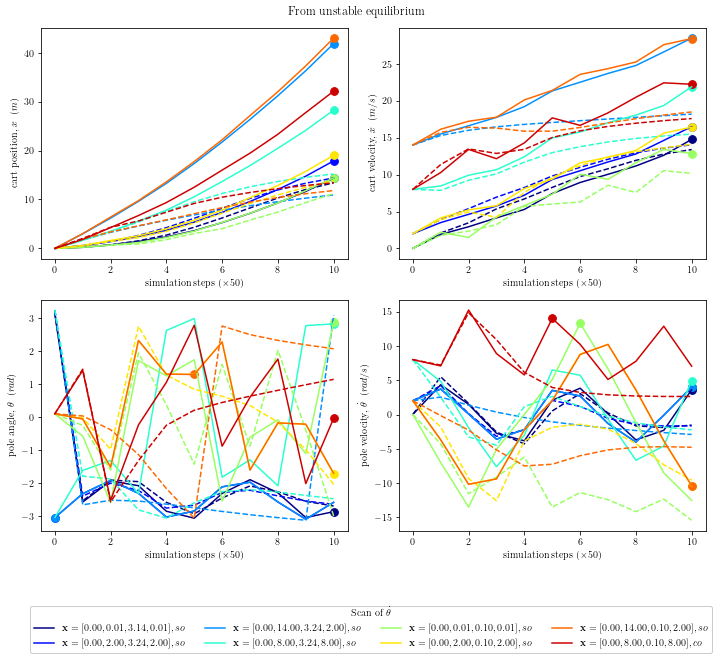

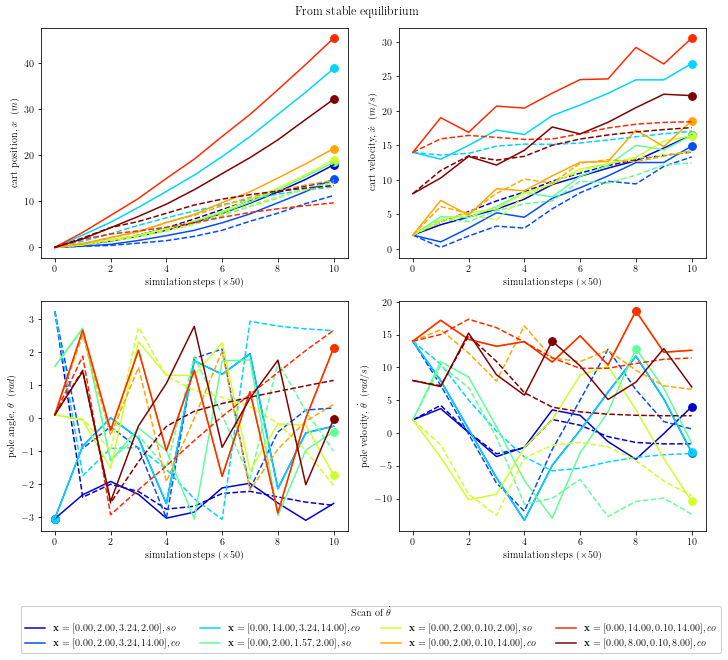

In [181]:
from task2 import *


complete_oscillations = {}
initial_states = ROLLOUT_INITIAL_CONTIDITIONS

l = len(initial_states)
colors = plt.cm.jet(np.linspace(0, 1, l))
fig1, axs1 = plt.subplots(2, 2, figsize=(10, 8), layout='tight')
fig2, axs2 = plt.subplots(2, 2, figsize=(10, 8), layout='tight')
fig = [fig1, fig2]
axs = [axs1, axs2]

T = 10
steps = np.arange(0, T + 1)
action = 7.5

for i, x0 in enumerate(initial_states):
    complete_oscillations[tuple(x0)] = False
    x0 = np.array(x0)
    cp = CartPole(False)
    cp_noremap = CartPole(False)
    cp_hat = CartPoleHat(False)

    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]

    for _ in steps[1:]:
        cp.performAction(action)
        cp_hat.performAction(action)
        
        if abs(cp.getState()[2]) > 2 * np.pi: complete_oscillations[tuple(x0)] = True
            
        cp_hat.remap_angle()

        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
    
    for j in range(len(x)): x[j][2] = remap_angle(x[j][2])
    x0_str = np.array2string(x0, precision=2, separator=', ', suppress_small=True, floatmode='fixed')
    
    t2_1_roll_out(steps, x, x_hat, fig=fig[i % 2], axs=axs[i % 2], xlabel=r"simulation steps $(\times 50)$", label=r"$\mathbf x={a}, {b}$".format(a=x0_str, b='co' if complete_oscillations[tuple(x0)] else 'so'), color=colors[i])    
    

lgd = fig1.legend(loc="lower center", framealpha=1, ncol=4, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.15))
fig1.tight_layout()
fig1.savefig("./assets2/task2_2__16.png", bbox_extra_artists=(lgd,), bbox_inches='tight')   
fig1.suptitle("From unstable equilibrium")

lgd = fig2.legend(loc="lower center", framealpha=1, ncol=4, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.15))
fig2.tight_layout()
fig2.savefig("./assets2/task2_2__17.png", bbox_extra_artists=(lgd,), bbox_inches='tight')
fig2.suptitle("From stable equilibrium")

Point of divergence: (10.00, 18.59, 3.33), (10.00, 19.02, 3.33), (5.00, -2.97, 1.67), (10.00, 5.11, 3.33)
Point of divergence: (10.00, 22.09, 3.33), (10.00, 20.61, 3.33), (0.00, -3.04, 0.00), (10.00, 4.66, 3.33)
Point of divergence: (10.00, 22.09, 3.33), (10.00, 20.61, 3.33), (0.00, -3.04, 0.00), (10.00, 4.66, 3.33)
Point of divergence: (10.00, 19.10, 3.33), (10.00, 18.35, 3.33), (0.00, -3.04, 0.00), (7.00, 13.03, 2.33)
Point of divergence: (10.00, 46.06, 3.33), (10.00, 32.58, 3.33), (0.00, -3.04, 0.00), (10.00, 4.66, 3.33)
Point of divergence: (10.00, 43.08, 3.33), (10.00, 30.34, 3.33), (0.00, -3.04, 0.00), (10.00, -11.08, 3.33)
Point of divergence: (10.00, 32.53, 3.33), (10.00, 26.44, 3.33), (0.00, -3.04, 0.00), (10.00, 8.43, 3.33)
Point of divergence: (10.00, 22.60, 3.33), (10.00, 20.79, 3.33), (10.00, -0.25, 3.33), (8.00, 13.49, 2.67)
Point of divergence: (10.00, 18.48, 3.33), (10.00, 18.51, 3.33), (10.00, 1.67, 3.33), (10.00, -2.24, 3.33)
Point of divergence: (10.00, 22.95, 3.33),

Text(0.5, 0.98, 'From stable equilibrium')

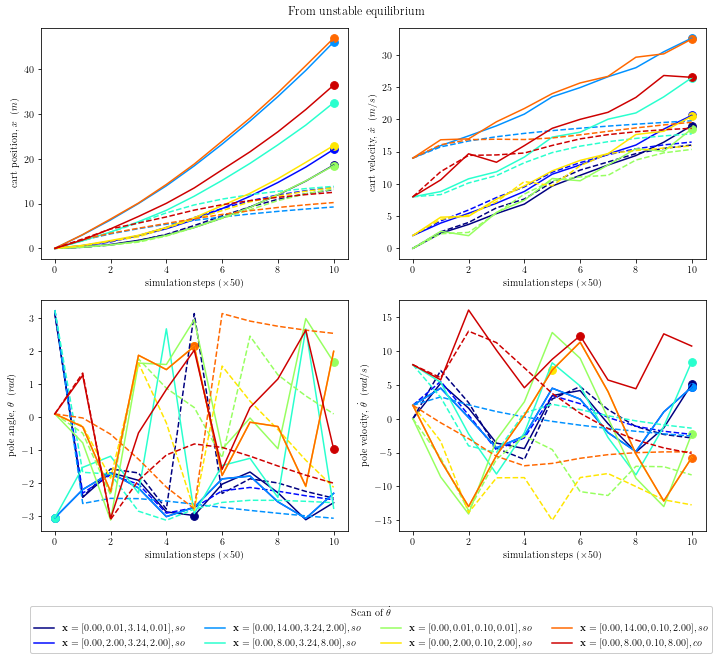

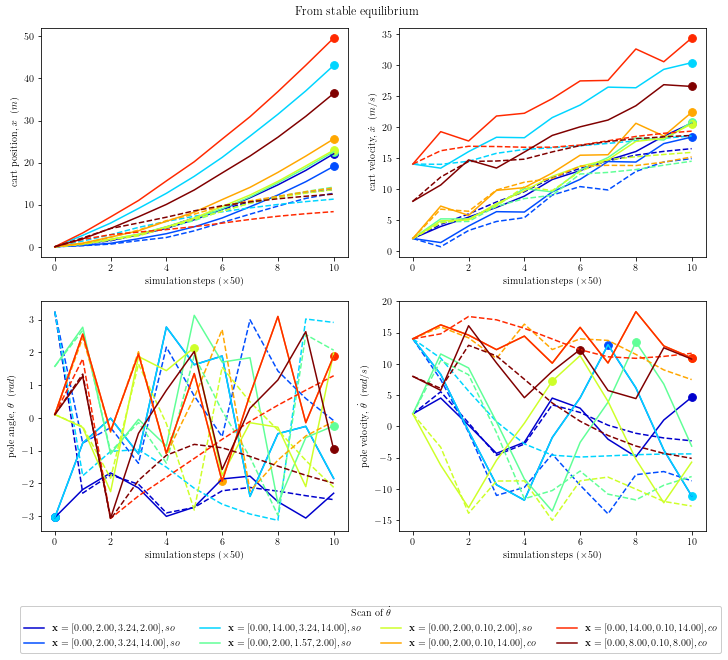

In [182]:
from task2 import *


complete_oscillations = {}
initial_states = ROLLOUT_INITIAL_CONTIDITIONS

l = len(initial_states)
colors = plt.cm.jet(np.linspace(0, 1, l))
fig1, axs1 = plt.subplots(2, 2, figsize=(10, 8), layout='tight')
fig2, axs2 = plt.subplots(2, 2, figsize=(10, 8), layout='tight')
fig = [fig1, fig2]
axs = [axs1, axs2]

T = 10
steps = np.arange(0, T + 1)
action = 10

for i, x0 in enumerate(initial_states):
    complete_oscillations[tuple(x0)] = False
    x0 = np.array(x0)
    cp = CartPole(False)
    cp_noremap = CartPole(False)
    cp_hat = CartPoleHat(False)

    cp.setState(x0)
    cp_hat.setState(x0)
    cp_hat.setTrainedParams(w, xi, sigma)

    x = x0[None, ...]
    x_hat = x0[None, ...]

    for _ in steps[1:]:
        cp.performAction(action)
        cp_hat.performAction(action)
        
        if abs(cp.getState()[2]) > 2 * np.pi: complete_oscillations[tuple(x0)] = True
            
        cp_hat.remap_angle()

        x = np.vstack([x, cp.getState()])
        x_hat = np.vstack([x_hat, cp_hat.getState()])
    
    for j in range(len(x)): x[j][2] = remap_angle(x[j][2])
    x0_str = np.array2string(x0, precision=2, separator=', ', suppress_small=True, floatmode='fixed')
    
    t2_1_roll_out(steps, x, x_hat, fig=fig[i % 2], axs=axs[i % 2], xlabel=r"simulation steps $(\times 50)$", label=r"$\mathbf x={a}, {b}$".format(a=x0_str, b='co' if complete_oscillations[tuple(x0)] else 'so'), color=colors[i])    
    

lgd = fig1.legend(loc="lower center", framealpha=1, ncol=4, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.15))
fig1.tight_layout()
fig1.savefig("./assets2/task2_2__18.png", bbox_extra_artists=(lgd,), bbox_inches='tight')   
fig1.suptitle("From unstable equilibrium")

lgd = fig2.legend(loc="lower center", framealpha=1, ncol=4, title=r"Scan of $\dot \theta$", bbox_to_anchor=(0.52, -0.15))
fig2.tight_layout()
fig2.savefig("./assets2/task2_2__19.png", bbox_extra_artists=(lgd,), bbox_inches='tight')
fig2.suptitle("From stable equilibrium")

Samples drawn: 2048
(2048, 320)


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:217: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  axs[1,0].plot(x, y_hat[:, 2], color=color, linestyle='dashed')


(320, 4)
SE: [  17.67831584  597.74983486   54.54273515 3440.88259866]


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:431: UserWarning: The following kwargs were not used by contour: 'negative_linestyles'
  axs[3].set_title(DELTA + STATE3)
/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:432: UserWarning: The following kwargs were not used by contour: 'negative_linestyles'
  
/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:433: UserWarning: The following kwargs were not used by contour: 'negative_linestyles'
  axs[0].set(xlabel=xlabel)
/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:434: UserWarning: The following kwargs were not used by contour: 'negative_linestyles'
  axs[0].set(ylabel=ylabel)


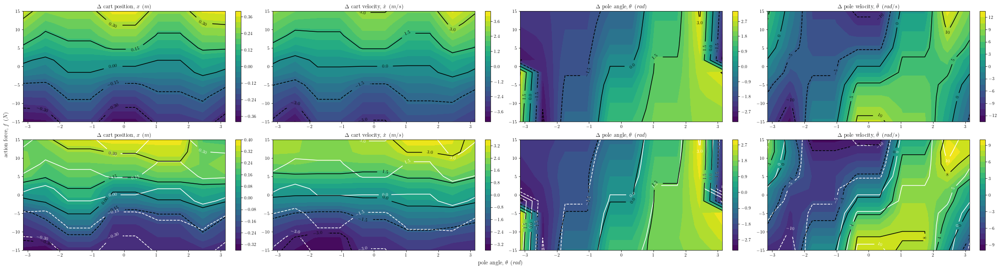

In [193]:
from utilities import *
from task2 import *


x, xi, *_, w, _, _, _ = compute_weights_tts_with_action(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 10
target_ranges  = get_ranges(l)

fig, axs = plt.subplots(2, 4, figsize=(30, 8), layout='constrained')

p, q = 2, 4
z0 = np.array([UNSTABLE_POS, UNSTABLE_VEL, UNSTABLE_ANG, UNSTABLE_ANG_VEL, 0])
x, y = np.meshgrid(target_ranges[p], target_ranges[q], indexing='ij')

z = np.zeros(4)
z_hat = np.zeros(4)

cp = CartPole(False)
cp_hat = CartPoleHat(False)

cp_hat.setTrainedParams(w, xi, sigma)

for i in range(len(x)):
    for j in range(len(y)):
        z0[p] = x[i][j]
        z0[q] = y[i][j]

        cp.setState(z0)
        cp_hat.setState(z0)
        cp.performAction(z0[-1])
        cp.remap_angle()
        cp_hat.performAction(z0[-1])
        cp_hat.remap_angle()

        z = np.vstack([z, cp.getState()])
        z_hat = np.vstack([z_hat, cp_hat.getState()])

        cp.reset()
        cp_hat.reset()


xlim = (x.min(), x.max())
ylim = (y.min(), y.max())
t2_1_plot_states_contour(x, y, z, fig, axs[0], xlim=xlim, ylim=ylim, colors='black')
t2_1_plot_states_contour(x, y, z, fig, axs[1], xlim=xlim, ylim=ylim, colors='white')
t2_1_plot_states_contour(x, y, z_hat, fig, axs[1], xlim=xlim, ylim=ylim, colors='black')

    
fig.supxlabel(STATE_LABELS[p])
fig.supylabel(STATE_LABELS[q])
fig.savefig("./assets2/task2_2__20.png")

Samples drawn: 2048
(2048, 320)
(320, 4)
SE: [  17.67831584  597.74983486   54.54273515 3440.88259866]


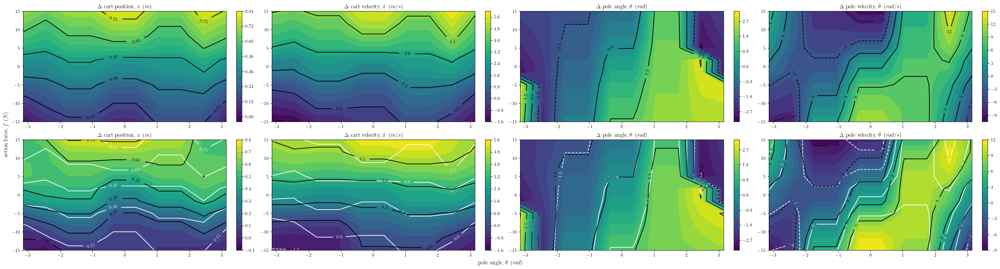

In [196]:
from utilities import *
from task2 import *


x, xi, *_, w, _, _, _ = compute_weights_tts_with_action(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 10
target_ranges  = get_ranges(l)

fig, axs = plt.subplots(2, 4, figsize=(30, 8), layout='constrained')

p, q = 2, 4
z0 = np.array([UNSTABLE_POS, 2, UNSTABLE_ANG, 2, 0])
x, y = np.meshgrid(target_ranges[p], target_ranges[q], indexing='ij')

z = np.zeros(4)
z_hat = np.zeros(4)

cp = CartPole(False)
cp_hat = CartPoleHat(False)

cp_hat.setTrainedParams(w, xi, sigma)

for i in range(len(x)):
    for j in range(len(y)):
        z0[p] = x[i][j]
        z0[q] = y[i][j]

        cp.setState(z0)
        cp_hat.setState(z0)
        cp.performAction(z0[-1])
        cp.remap_angle()
        cp_hat.performAction(z0[-1])
        cp_hat.remap_angle()

        z = np.vstack([z, cp.getState()])
        z_hat = np.vstack([z_hat, cp_hat.getState()])

        cp.reset()
        cp_hat.reset()


xlim = (x.min(), x.max())
ylim = (y.min(), y.max())
t2_1_plot_states_contour(x, y, z, fig, axs[0], xlim=xlim, ylim=ylim, colors='black')
t2_1_plot_states_contour(x, y, z, fig, axs[1], xlim=xlim, ylim=ylim, colors='white')
t2_1_plot_states_contour(x, y, z_hat, fig, axs[1], xlim=xlim, ylim=ylim, colors='black')

    
fig.supxlabel(STATE_LABELS[p])
fig.supylabel(STATE_LABELS[q])
fig.savefig("./assets2/task2_2__21.png")

# Task 2.3

In [197]:
from task2 import *

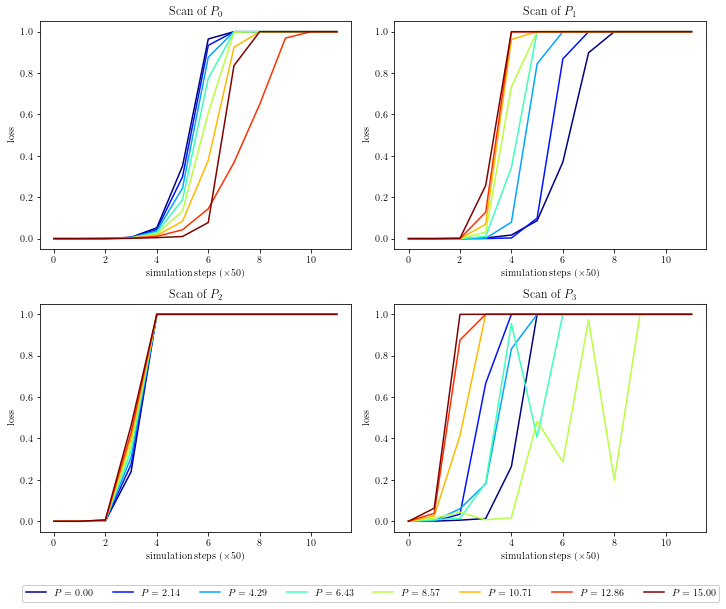

In [198]:
linear_policy = np.array([1, 1, 1, 1])

l = 8

colors = plt.cm.jet(np.linspace(0, 1, l))
p_range = np.linspace(P_MIN, P_MAX, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))
titles = [r"Scan of $P_{}$".format(i) for i in range(4)]
cp = CartPole(False)
# cp.delta_time = 0.02
T = 11
steps = np.arange(0, T + 1)
    
for j in range(4):
    initial_state = np.array([UNSTABLE_POS, UNSTABLE_VEL, UNSTABLE_ANG, 0.01])
    for i, p in enumerate(p_range):
        linear_policy[j] = p
        action = np.dot(linear_policy, initial_state)

        x0 = np.hstack([initial_state, action])
        cp.setState(initial_state)

        x = x0[None, :]
        x_hat = x0[None, :]
        loss_hist = [cp.loss()]
        
        for _ in steps[1:]:
            cp.performAction(x[-1, -1])
            state = cp.getState()
            loss_hist.append(cp.loss())
            action = np.dot(linear_policy, state)
            t = np.append(state, action)
            x = np.vstack([x, t])

        t2_3_roll_out(steps, loss_hist, fig=fig, ax=axs[j // 2][j % 2], label=r"$P={a:.2f}$".format(a=p) if j == 0 else None, color=colors[i], title=titles[j])
        cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, bbox_to_anchor=(0.52, -0.06))
fig.savefig("./assets2/task2_3__1.png", bbox_extra_artists=(), bbox_inches='tight')


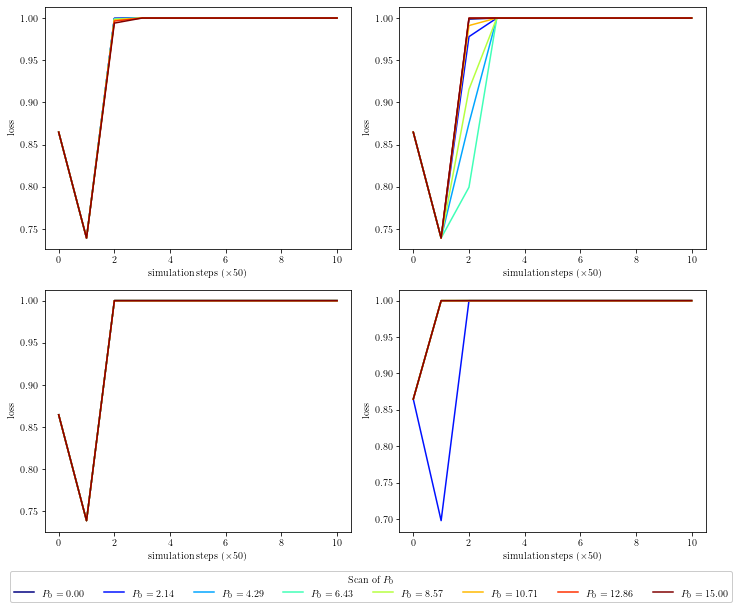

In [199]:
linear_policy = np.array([1, 1, 1, 1])

l = 8

colors = plt.cm.jet(np.linspace(0, 1, l))
p_range = np.linspace(P_MIN, P_MAX, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))

cp = CartPole(False)
# cp.delta_time = 0.02
T = 10
steps = np.arange(0, T + 1)
    
for j in range(4):
    initial_state = np.array([UNSTABLE_POS, UNSTABLE_VEL, UNSTABLE_ANG, 1])
    for i, p in enumerate(p_range):
        linear_policy[j] = p
        action = np.dot(linear_policy, initial_state)

        x0 = np.hstack([initial_state, action])
        cp.setState(initial_state)

        x = x0[None, :]
        x_hat = x0[None, :]
        loss_hist = [cp.loss()]
        
        for _ in steps[1:]:
            cp.performAction(x[-1, -1])
            state = cp.getState()
            loss_hist.append(cp.loss())
            action = np.dot(linear_policy, state)
            t = np.append(state, action)
            x = np.vstack([x, t])

        t2_3_roll_out(steps, loss_hist, fig=fig, ax=axs[j // 2][j % 2], label=r"$P_0={a:.2f}$".format(a=p) if j == 0 else None, color=colors[i])
        cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $P_0$", bbox_to_anchor=(0.52, -0.06))
fig.savefig("./assets2/task2_3__2.png", bbox_extra_artists=(), bbox_inches='tight')


In [ ]:
# Get the number of oscillations

linear_policy = np.array([1, 1, 1, 1])

l = 8

colors = plt.cm.jet(np.linspace(0, 1, l))
p_range = np.linspace(P_MIN, P_MAX, l)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))

cp = CartPole(False)
# cp.delta_time = 0.02
T = 10
steps = np.arange(0, T + 1)
    
for j in range(4):
    initial_state = np.array([UNSTABLE_POS, UNSTABLE_VEL, 0.001, UNSTABLE_ANG_VEL])
    for i, p in enumerate(p_range):
        linear_policy[j] = p
        action = np.dot(linear_policy, initial_state)

        x0 = np.hstack([initial_state, action])
        cp.setState(initial_state)

        x = x0[None, :]
        x_hat = x0[None, :]
        loss_hist = [cp.loss()]
        
        for _ in steps[1:]:
            cp.performAction(x[-1, -1])
            state = cp.getState()
            loss_hist.append(cp.loss())
            action = np.dot(linear_policy, state)
            t = np.append(state, action)
            x = np.vstack([x, t])

        t2_3_roll_out(steps, loss_hist, fig=fig, ax=axs[j // 2][j % 2], label=r"$P_0={a:.2f}$".format(a=p) if j == 0 else None, color=colors[i])
        cp.reset()

lgd = fig.legend(loc="lower center", ncol=l, framealpha=1, title=r"Scan of $P_0$", bbox_to_anchor=(0.52, -0.06))
fig.savefig("./assets2/task2_3__2.png", bbox_extra_artists=(), bbox_inches='tight')


            

In [201]:
from task2 import t2_3_opt_p

initial_p = np.array([1, 1, 1, 1])
initial_state = np.array([UNSTABLE_POS, UNSTABLE_VEL, 0.001, UNSTABLE_ANG_VEL])
sol = t2_3_opt_p(initial_state, initial_p, 6)

[1.   1.   1.   1.05]
[1.   1.   1.   1.05]
[0.990625 0.94375  1.084375 1.084375]
[0.990625 0.94375  1.084375 1.084375]
[0.90664063 0.98984375 1.05898437 1.15273438]
[0.90664063 0.98984375 1.05898437 1.15273438]
[0.90024414 0.87021484 1.15952148 1.26811523]
[0.90024414 0.87021484 1.15952148 1.26811523]
[0.78442993 0.93704834 1.14276733 1.43720093]
[0.78442993 0.93704834 1.14276733 1.43720093]
[0.69899673 0.77083588 1.37962265 1.68962021]
[0.69899673 0.77083588 1.37962265 1.68962021]
[0.39157114 0.82421932 1.45174322 2.09649267]
[0.39157114 0.82421932 1.45174322 2.09649267]
[0.13703905 0.48531263 1.87762855 2.74972843]
[0.13703905 0.48531263 1.87762855 2.74972843]
[-0.08270907  0.56893001  1.88306228  3.07638947]
[-0.08270907  0.56893001  1.88306228  3.07638947]
[-0.08270907  0.56893001  1.88306228  3.07638947]
[-0.08270907  0.56893001  1.88306228  3.07638947]
[-0.08270907  0.56893001  1.88306228  3.07638947]
[-0.08270907  0.56893001  1.88306228  3.07638947]
[-0.08270907  0.56893001  1.

[-7.480468    6.18851396 12.95288149  5.55607306]
[-7.480468    6.18851396 12.95288149  5.55607306]
[-7.480468    6.18851396 12.95288149  5.55607306]
[-7.59607005  6.34628183 12.96059431  5.65941557]
[-7.59607005  6.34628183 12.96059431  5.65941557]
[-7.44228489  6.13502223 12.94499666  5.52489951]
[-7.44228489  6.13502223 12.94499666  5.52489951]
[-7.44228489  6.13502223 12.94499666  5.52489951]
[-7.5248076   6.24971913 12.95491228  5.59713003]
[-7.5248076   6.24971913 12.95491228  5.59713003]
[-7.45383784  6.1511674  12.94673428  5.53491888]
[-7.45956813  6.15576101 12.93710109  5.54488216]
[-7.45956813  6.15576101 12.93710109  5.54488216]
[-7.45956813  6.15576101 12.93710109  5.54488216]
[-7.44690653  6.13475691 12.9292088   5.53583053]
[-7.54037766  6.26342414 12.93719189  5.61893067]
[-7.45926988  6.15094    12.92535683  5.5498945 ]
[-7.45926988  6.15094    12.92535683  5.5498945 ]
[-7.48480681  6.18219254 12.92041393  5.57472416]
[-7.51641854  6.22691447 12.92390879  5.60322261]


In [202]:
sol.x

array([-7.90646842,  6.96077677, 12.74492231,  6.28196822])

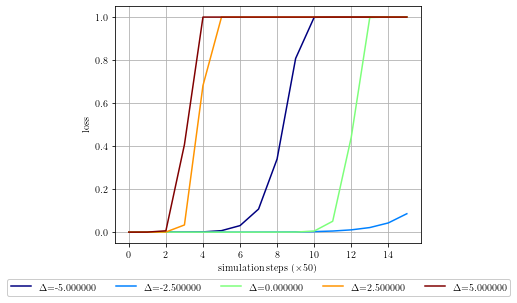

In [217]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))

T = 15
steps = np.arange(0, T + 1)

l = 5
perturb = 5
colors = plt.cm.jet(np.linspace(0, 1, l))
for i, delta in enumerate(np.linspace(-perturb, perturb, l)):
    cp = CartPole(False)
    linear_policy = sol.x + delta
    action = np.dot(linear_policy, initial_state)
    x0 = np.hstack([initial_state, action])
    cp.setState(initial_state)
    loss_hist = [cp.loss()]
    for _ in steps[1:]:
        cp.performAction(action)
        state = cp.getState()
        loss_hist.append(cp.loss())    
        action = np.dot(linear_policy, state)
    t2_3_roll_out(steps, loss_hist, fig=fig, ax=ax, color=colors[i], label=r'$\Delta$={:2f}'.format(delta))

lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=l)
fig.savefig("./assets2/task2_3__3.png", bbox_extra_artists=(lgd, ), bbox_inches='tight')


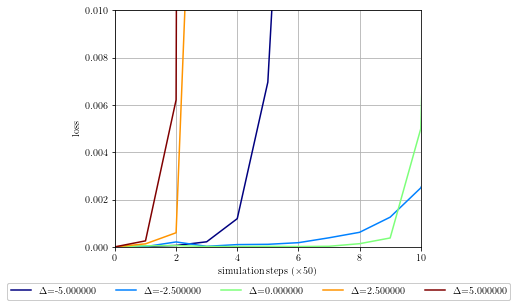

In [218]:
ax.set(xlim=(0, 10), ylim=(0, 0.01))
lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=l)
fig.savefig("./assets2/task2_3__4.png", bbox_extra_artists=(lgd, ), bbox_inches='tight')
fig

In [236]:
from task2 import t2_3_opt_p_with_period


initial_p = np.array([1, 1, 1, 1])
initial_state = np.array([UNSTABLE_POS, UNSTABLE_VEL, 0.001, UNSTABLE_ANG_VEL])
sol = t2_3_opt_p_with_period(initial_state, initial_p, 1, 2, 15)

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[1.   1.   1.   1.05]
Total steps to reach 2 oscillations: 4
[1.   1.   1.   1.05]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[0.990625 0.94375  1.084375 1.084375]
Total steps to reach 2 oscillations: 4
[0.990625 0.94375  1.084375 1.084375]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[0.90664063 0.98984375 1.05898437 1.15273438]
Total steps to reach 2 oscillations: 4
[0.90664063 0.98984375 1.05898437 1.15273438]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[0.90024414 0.87021484 1.15952148 1.26811523]
Total steps to reach 2 oscillations: 4
[0.90024414 0.87021484 1.15952148 1.26811523]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillatio

[-4.05846734  3.17180309 11.28606451  3.61873123]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-5.17145183  3.86088536 13.41964098  4.01499231]
Total steps to reach 2 oscillations: 4
[-5.17145183  3.86088536 13.41964098  4.01499231]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-5.17145183  3.86088536 13.41964098  4.01499231]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.70101372  3.4391041  12.55529124  3.98138482]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.70101372  3.4391041  12.55529124  3.98138482]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.70101372  3.4391041  12.55529124  3.98138482]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.70101372  3.4391041  12.55529124  3.98138482]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.70101372  3

[-2.36481913  0.97895966 13.17022305  2.37030372]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.36481913  0.97895966 13.17022305  2.37030372]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.36481913  0.97895966 13.17022305  2.37030372]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.36481913  0.97895966 13.17022305  2.37030372]
Total steps to reach 2 oscillations: 4
[-2.36481913  0.97895966 13.17022305  2.37030372]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.36778932  0.9813138  13.17407803  2.37158622]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.36778932  0.9813138  13.17407803  2.37158622]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.36778932  0.9813138  13.17407803  2.37158622]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.36778932  0

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.01548742  0.45491429 13.25035975  2.05907018]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.99750933  0.44979168 13.25333734  2.05642759]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.01472349  0.45527077 13.25287153  2.05944041]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.01472349  0.45527077 13.25287153  2.05944041]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.00285791  0.45130104 13.25267105  2.05654454]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.00893747  0.45265408 13.25157253  2.05776159]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.00137694  0.45045058 13.25284072  2.05660704]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.00071663  0.44881556 1

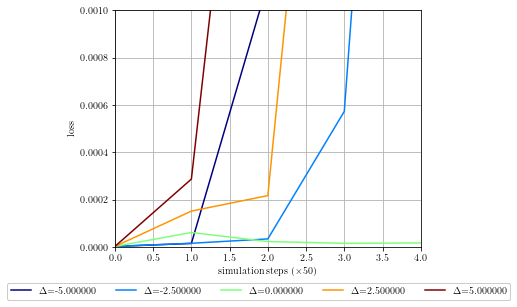

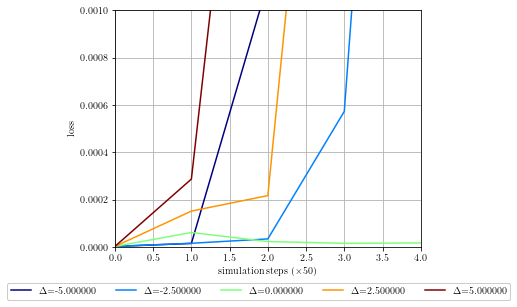

In [235]:
sol.x
fig, ax = plt.subplots(1, 1, figsize=(5, 4))

T = 15
steps = np.arange(0, T + 1)

l = 5
perturb = 5
colors = plt.cm.jet(np.linspace(0, 1, l))
for i, delta in enumerate(np.linspace(-perturb, perturb, l)):
    cp = CartPole(False)
    linear_policy = sol.x + delta
    action = np.dot(linear_policy, initial_state)
    x0 = np.hstack([initial_state, action])
    cp.setState(initial_state)
    loss_hist = [cp.loss()]
    for _ in steps[1:]:
        cp.performAction(action)
        state = cp.getState()
        loss_hist.append(cp.loss())    
        action = np.dot(linear_policy, state)
    t2_3_roll_out(steps, loss_hist, fig=fig, ax=ax, color=colors[i], label=r'$\Delta$={:2f}'.format(delta))

lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=l)
fig.savefig("./assets2/task2_3__4.png", bbox_extra_artists=(lgd, ), bbox_inches='tight')

ax.set(xlim=(0, 4), ylim=(0, 0.001))
lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=l)
fig.savefig("./assets2/task2_3__5.png", bbox_extra_artists=(lgd, ), bbox_inches='tight')
fig


Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[1.   1.   1.05 1.  ]
Total steps to reach 2 oscillations: 4
[1.   1.   1.05 1.  ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[0.946875 0.990625 1.084375 0.94375 ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[1.00703125 0.98359375 1.14765625 0.9015625 ]
Total steps to reach 2 oscillations: 4
[1.00703125 0.98359375 1.14765625 0.9015625 ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[0.86845703 1.01318359 1.23759766 0.90410156]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[0.8447998  0.94807129 1.3532959  0.78217773]
Total steps to reach 2 oscillations: 4
[0.8447998  0.94807129 1.3532959  0.78217773]
Total steps to reach 2 os

Total steps to reach 2 oscillations: 4
[-3.24074393  1.34289226  9.90884552 -5.36162393]
Total steps to reach 2 oscillations: 4
[-3.24074393  1.34289226  9.90884552 -5.36162393]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-3.24074393  1.34289226  9.90884552 -5.36162393]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-3.23891304  1.34245439  9.90877134 -5.3624521 ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-3.23918448  1.34255246  9.90877429 -5.36227634]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-3.24229113  1.34395973  9.90860581 -5.36087825]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-3.24229113  1.34395973  9.90860581 -5.36087825]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-3.24034733  1.34289054  9.90880023 -5.36179762]
Total steps to reach 2 oscillations: 4
Total steps to 

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[  9.04852475   1.3662233    9.89484867 -11.56137993]
Total steps to reach 2 oscillations: 4
[  9.04852475   1.3662233    9.89484867 -11.56137993]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[  9.23507459   1.35789145   9.89584207 -11.65536498]
Total steps to reach 2 oscillations: 4
[  9.23507459   1.35789145   9.89584207 -11.65536498]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[  9.86050837   1.34385368   9.8972882  -11.97028118]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[  9.90076922   1.34135736   9.89708348 -11.99038617]
Total steps to reach 2 oscillations: 4
[  9.90076922   1.34135736   9.89708348 -11.99038617]
Total steps to reach 2 oscillations: 4
[  9.90076922   1.34135736   9.89708348 -11.99038617]
Total steps to reach 2 oscillations: 4
[  9.90076922   1.34135736   9.89708348 -11.99038617]
Total s

[ 14.7033674    1.15380432   9.91032583 -14.40463706]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 14.70343383   1.15380263   9.91032593 -14.40467048]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 14.70343383   1.15380263   9.91032593 -14.40467048]
Total steps to reach 2 oscillations: 4
[ 14.70343383   1.15380263   9.91032593 -14.40467048]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 14.70343383   1.15380263   9.91032593 -14.40467048]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 14.70343383   1.15380263   9.91032593 -14.40467048]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 14.70343383   1.15380263   9.91032593 -14.40467048]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 14.70343383   1.15380263   9.91032593 -14.40467048]
Total steps to reach 2 oscillations: 4
Total steps to reach 2

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.43439344  1.85623222  9.60380392 -4.39514522]
Total steps to reach 2 oscillations: 4
[-4.43439344  1.85623222  9.60380392 -4.39514522]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.32573064  1.76330659  9.61703558 -4.33995805]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.23121829  1.68544344  9.63471862 -4.30079783]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.03729068  1.53280029  9.66114814 -4.21942362]
Total steps to reach 2 oscillations: 4
[-4.03729068  1.53280029  9.66114814 -4.21942362]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-3.63937219  1.20169448  9.7143404  -4.0323238 ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-3.66986286  1.2319933   9.71291565 -4.05463431]
Total steps to reach 2 oscillations: 4
[-3.66986286  1

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.41778723 -0.15437128 10.01683788 -3.89861674]
Total steps to reach 2 oscillations: 4
[-0.41778723 -0.15437128 10.01683788 -3.89861674]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 0.74332212 -0.32652269 10.02815868 -4.12463348]
Total steps to reach 2 oscillations: 4
[ 0.74332212 -0.32652269 10.02815868 -4.12463348]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 2.61583987 -0.78603702 10.10058501 -4.33062115]
Total steps to reach 2 oscillations: 4
[ 2.61583987 -0.78603702 10.10058501 -4.33062115]
Total steps to reach 2 oscillations: 4
[ 2.61583987 -0.78603702 10.10058501 -4.33062115]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 5.79999643 -1.27542405 10.13016214 -4.9304385 ]
Total steps to reach 2 oscillations: 4
[ 5.79999643 -1.27542405 10.13016214 -4.9304385 ]
Total steps to reach 2 oscillations: 4
Tota

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[23.32513727 -4.12434109 10.23448952 -8.01725901]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[23.35882166 -4.13588084 10.23593324 -8.01748405]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[23.35882166 -4.13588084 10.23593324 -8.01748405]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[23.35882166 -4.13588084 10.23593324 -8.01748405]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[23.35940345 -4.13382727 10.23550889 -8.01961806]
Total steps to reach 2 oscillations: 4
[23.35940345 -4.13382727 10.23550889 -8.01961806]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[23.35436799 -4.13345463 10.2355589  -8.01830275]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[23.36626799 -4.13623599 10.23581377 -8.01960955]
Total steps to 

Total steps to reach 2 oscillations: 4
[22.89048357 -4.06898602 10.2356069  -7.92672742]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[22.89695751 -4.07063204 10.23576556 -7.92730776]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[22.88297844 -4.06837654 10.23569761 -7.92483854]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[22.88026392 -4.06785677 10.23567032 -7.92443806]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[22.88026392 -4.06785677 10.23567032 -7.92443806]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[22.88026392 -4.06785677 10.23567032 -7.92443806]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[22.89007627 -4.06945462 10.23571835 -7.92615548]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[22.89007627 -4.06945462 10.23571835 -7.92615548]
Total steps to 

Total steps to reach 2 oscillations: 4
[ 2.93715168 -3.10957488  9.00067461  5.35640504]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 3.07489552 -3.01628846  9.08809627  5.76878963]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 3.07489552 -3.01628846  9.08809627  5.76878963]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 3.07489552 -3.01628846  9.08809627  5.76878963]
Total steps to reach 2 oscillations: 4
[ 3.07489552 -3.01628846  9.08809627  5.76878963]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 3.07489552 -3.01628846  9.08809627  5.76878963]
Total steps to reach 2 oscillations: 4
[ 3.07489552 -3.01628846  9.08809627  5.76878963]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 3.32863161 -2.85050596  9.20614918  6.46756233]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 3.32863161 -2

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 4.49785064 -1.98223148  9.58081584  9.69367423]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 4.52485985 -1.9554443   9.58808058  9.77963223]
Total steps to reach 2 oscillations: 4
[ 4.52485985 -1.9554443   9.58808058  9.77963223]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 4.52485985 -1.9554443   9.58808058  9.77963223]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 4.55826843 -1.93434035  9.59367753  9.85794925]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 4.55826843 -1.93434035  9.59367753  9.85794925]
Total steps to reach 2 oscillations: 4
[ 4.55826843 -1.93434035  9.59367753  9.85794925]
Total steps to reach 2 oscillations: 4
[ 4.55826843 -1.93434035  9.59367753  9.85794925]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 4.568888   -1

[ 7.21255433 -1.3492474   9.76198846 13.58087824]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 7.38995023 -1.34024733  9.76623746 13.761579  ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 7.38995023 -1.34024733  9.76623746 13.761579  ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 7.24208044 -1.34855448  9.76251255 13.60913791]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 7.24208044 -1.34855448  9.76251255 13.60913791]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 7.37730398 -1.34294201  9.76549015 13.74409556]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 7.41878209 -1.33992431  9.76668764 13.78840156]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 7.41878209 -1.33992431  9.76668764 13.78840156]
Total steps to reach 2 oscillations: 4
Total steps to 

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 9.16401103 -1.30863393  9.79615071 15.43790363]
Total steps to reach 2 oscillations: 4
[ 9.16401103 -1.30863393  9.79615071 15.43790363]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 9.16401103 -1.30863393  9.79615071 15.43790363]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 9.16401103 -1.30863393  9.79615071 15.43790363]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 9.19383282 -1.30811574  9.79664297 15.46604248]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 9.22882997 -1.30861661  9.79701975 15.49663158]
Total steps to reach 2 oscillations: 4
[ 9.22882997 -1.30861661  9.79701975 15.49663158]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 9.30758881 -1.3089395   9.79800191 15.56721954]
Total steps to reach 2 oscillations: 4
[ 9.30758881 -1

Total steps to reach 2 oscillations: 4
[11.01499938 -1.33842593  9.81519142 17.04812217]
Total steps to reach 2 oscillations: 4
[11.01499938 -1.33842593  9.81519142 17.04812217]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[11.073884   -1.33965229  9.81571112 17.09868829]
Total steps to reach 2 oscillations: 4
[11.073884   -1.33965229  9.81571112 17.09868829]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[11.17320475 -1.3422274   9.81654616 17.1829343 ]
Total steps to reach 2 oscillations: 4
[11.17320475 -1.3422274   9.81654616 17.1829343 ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[11.25930351 -1.34423905  9.81725458 17.25637471]
Total steps to reach 2 oscillations: 4
[11.25930351 -1.34423905  9.81725458 17.25637471]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[11.25930351 -1.34423905  9.81725458 17.25637471]
Total steps to reach 2 oscillations: 4
[11.

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 1.95919405 -3.94369154  8.84782649  2.64316149]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 1.95919405 -3.94369154  8.84782649  2.64316149]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 1.95919405 -3.94369154  8.84782649  2.64316149]
Total steps to reach 2 oscillations: 4
[ 1.95919405 -3.94369154  8.84782649  2.64316149]
Total steps to reach 2 oscillations: 4
[ 1.95919405 -3.94369154  8.84782649  2.64316149]
Total steps to reach 2 oscillations: 4
[ 1.95919405 -3.94369154  8.84782649  2.64316149]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 2.00734448 -3.6129775   8.46721918  2.88496017]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 2.00734448 -3.6129775   8.46721918  2.88496017]
Total steps to reach 2 oscillations: 4
[ 2.00734448 -3.6129775   8.46721918  2.88496017]
Tota

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 4.81798307 -1.77560419  9.63567993 10.45441804]
Total steps to reach 2 oscillations: 4
[ 4.81798307 -1.77560419  9.63567993 10.45441804]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 4.81798307 -1.77560419  9.63567993 10.45441804]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 4.86434441 -1.74354689  9.64371027 10.56887336]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 4.86434441 -1.74354689  9.64371027 10.56887336]
Total steps to reach 2 oscillations: 4
[ 4.86434441 -1.74354689  9.64371027 10.56887336]
Total steps to reach 2 oscillations: 4
[ 4.86434441 -1.74354689  9.64371027 10.56887336]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 4.94184902 -1.71370583  9.65183434 10.70677229]
Total steps to reach 2 oscillations: 4
[ 4.94184902 -1.71370583  9.65183434 10.70677229]
Tota

Total steps to reach 2 oscillations: 4
[ 7.12575226 -1.35515489  9.75958639 13.48909284]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 7.31655441 -1.34301185  9.76465119 13.68891754]
Total steps to reach 2 oscillations: 4
[ 7.31655441 -1.34301185  9.76465119 13.68891754]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 7.21255433 -1.3492474   9.76198846 13.58087824]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 7.38995023 -1.34024733  9.76623746 13.761579  ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 7.38995023 -1.34024733  9.76623746 13.761579  ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 7.24208044 -1.34855448  9.76251255 13.60913791]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 7.24208044 -1.34855448  9.76251255 13.60913791]
Total steps to reach 2 oscillations: 4
Total steps to 

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 9.30758881 -1.3089395   9.79800191 15.56721954]
Total steps to reach 2 oscillations: 4
[ 9.30758881 -1.3089395   9.79800191 15.56721954]
Total steps to reach 2 oscillations: 4
[ 9.30758881 -1.3089395   9.79800191 15.56721954]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 9.47858365 -1.30964833  9.80015127 15.72048202]
Total steps to reach 2 oscillations: 4
[ 9.47858365 -1.30964833  9.80015127 15.72048202]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 9.48065438 -1.30972727  9.80015501 15.72217083]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 9.48065438 -1.30972727  9.80015501 15.72217083]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 9.62739752 -1.31110702  9.80185662 15.85199983]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 9.62739752 -1

Total steps to reach 2 oscillations: 4
[11.25930351 -1.34423905  9.81725458 17.25637471]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[11.4330254  -1.34849605  9.81868969 17.40417716]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[11.4330254  -1.34849605  9.81868969 17.40417716]
Total steps to reach 2 oscillations: 4
[11.4330254  -1.34849605  9.81868969 17.40417716]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[11.4330254  -1.34849605  9.81868969 17.40417716]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[11.46054503 -1.34920457  9.81891616 17.42752304]
Total steps to reach 2 oscillations: 4
[11.46054503 -1.34920457  9.81891616 17.42752304]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[11.56257308 -1.35171728  9.81974178 17.5142808 ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[11.56257308 -1

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.64218685  2.02449442  9.57345273 -4.48544088]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.63926265  2.02181608  9.5712915  -4.48201703]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.63634368  2.01900909  9.57422033 -4.48227715]
Total steps to reach 2 oscillations: 4
[-4.63634368  2.01900909  9.57422033 -4.48227715]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.62950446  2.01231349  9.57576053 -4.47816537]
Total steps to reach 2 oscillations: 4
[-4.62950446  2.01231349  9.57576053 -4.47816537]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.61543227  2.00195564  9.57882447 -4.47418882]
Total steps to reach 2 oscillations: 4
[-4.61543227  2.00195564  9.57882447 -4.47418882]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.59702745  1

Total steps to reach 2 oscillations: 4
[-2.36607136  0.24361727  9.96746665 -3.61603391]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.35205204  0.28514271  9.95227999 -3.65500295]
Total steps to reach 2 oscillations: 4
[-2.35205204  0.28514271  9.95227999 -3.65500295]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.26287757  0.2477807   9.96027834 -3.65127414]
Total steps to reach 2 oscillations: 4
[-2.26287757  0.2477807   9.96027834 -3.65127414]
Total steps to reach 2 oscillations: 4
[-2.26287757  0.2477807   9.96027834 -3.65127414]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.19485267  0.27946432  9.94677536 -3.69962588]
Total steps to reach 2 oscillations: 4
[-2.19485267  0.27946432  9.94677536 -3.69962588]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.08246751  0.21328454  9.96413746 -3.67950848]
Total steps to reach 2 oscillations: 4
[-2.

Total steps to reach 2 oscillations: 4
[23.09201919 -4.03649469 10.22286378 -8.02321888]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[23.09201919 -4.03649469 10.22286378 -8.02321888]
Total steps to reach 2 oscillations: 4
[23.09201919 -4.03649469 10.22286378 -8.02321888]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[23.5499448  -4.17820805 10.23953811 -8.04067268]
Total steps to reach 2 oscillations: 4
[23.5499448  -4.17820805 10.23953811 -8.04067268]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[23.5499448  -4.17820805 10.23953811 -8.04067268]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[23.5499448  -4.17820805 10.23953811 -8.04067268]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[23.5499448  -4.17820805 10.23953811 -8.04067268]
Total steps to reach 2 oscillations: 4
[23.5499448  -4.17820805 10.23953811 -8.04067268]
Tota

Total steps to reach 2 oscillations: 4
[22.9603253  -4.07289842 10.2343211  -7.94589981]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[22.9603253  -4.07289842 10.2343211  -7.94589981]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[22.98348331 -4.07701782 10.2345418  -7.94965237]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[22.98377162 -4.07970229 10.23510874 -7.9472391 ]
Total steps to reach 2 oscillations: 4
[22.98377162 -4.07970229 10.23510874 -7.9472391 ]
Total steps to reach 2 oscillations: 4
[22.98377162 -4.07970229 10.23510874 -7.9472391 ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[22.97816067 -4.08063048 10.2354951  -7.94455066]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[22.95234135 -4.07831741 10.23575105 -7.93824724]
Total steps to reach 2 oscillations: 4
[22.95234135 -4.07831741 10.23575105 -7.93824724]
Tota

Total steps to reach 2 oscillations: 4
[0.8447998  0.94807129 1.3532959  0.78217773]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[0.77277527 1.03702698 1.54859314 0.64325562]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[0.52442703 0.99663315 1.82351456 0.56671295]
Total steps to reach 2 oscillations: 4
[0.52442703 0.99663315 1.82351456 0.56671295]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[0.29815111 1.04515676 2.19042139 0.21393375]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.00419381  1.1287863   2.81623914 -0.11610665]
Total steps to reach 2 oscillations: 4
[-0.00419381  1.1287863   2.81623914 -0.11610665]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.71816235  1.23819288  3.59547819 -0.55886531]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.3952498   1.33493962  4.8799127

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-3.24219505  1.34394181  9.90833372 -5.36068472]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-3.24830059  1.34646067  9.90807244 -5.35772578]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-3.23750948  1.34186718  9.90880576 -5.36297604]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-3.24523554  1.3453915   9.90836697 -5.35948104]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-3.24074393  1.34289226  9.90884552 -5.36162393]
Total steps to reach 2 oscillations: 4
[-3.24074393  1.34289226  9.90884552 -5.36162393]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-3.24074393  1.34289226  9.90884552 -5.36162393]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-3.23891304  1.34245439  9.90877134 -5.3624521 ]
Total steps to 

Total steps to reach 2 oscillations: 4
[  8.39343514   1.37909948   9.89364044 -11.23148375]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[  8.39343514   1.37909948   9.89364044 -11.23148375]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[  8.39343514   1.37909948   9.89364044 -11.23148375]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[  8.39343514   1.37909948   9.89364044 -11.23148375]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[  8.39343514   1.37909948   9.89364044 -11.23148375]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[  8.39300063   1.37534808   9.89439162 -11.23112925]
Total steps to reach 2 oscillations: 4
[  8.39300063   1.37534808   9.89439162 -11.23112925]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[  8.39300063   1.37534808   9.89439162 -11.23112925]
Total steps to reach 2

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 14.7033674    1.15380432   9.91032583 -14.40463706]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 14.70343383   1.15380263   9.91032593 -14.40467048]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 14.70343383   1.15380263   9.91032593 -14.40467048]
Total steps to reach 2 oscillations: 4
[ 14.70343383   1.15380263   9.91032593 -14.40467048]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 14.70343383   1.15380263   9.91032593 -14.40467048]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 14.70343383   1.15380263   9.91032593 -14.40467048]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 14.70343383   1.15380263   9.91032593 -14.40467048]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[ 14.70343383   1.15380263   9.910325

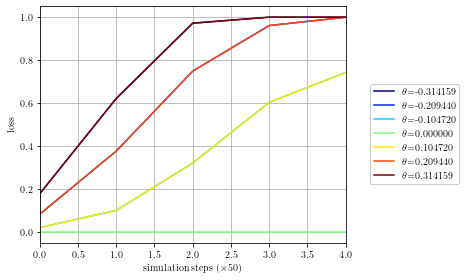

In [289]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))

T = 10
steps = np.arange(0, T + 1)

l = 7
perturb = np.pi / 10
colors = plt.cm.jet(np.linspace(0, 1, l))

for i, delta in enumerate(np.linspace(-perturb, perturb, l)):
    initial_p = np.array([1, 1, 1, 1])
    initial_state = np.array([UNSTABLE_POS, UNSTABLE_VEL, UNSTABLE_ANG +delta, UNSTABLE_ANG_VEL])
    sol = t2_3_opt_p_with_period(initial_state, initial_p, std_f=0, oscillations=2, steps=15)

    cp = CartPole(False)
    linear_policy = sol.x
    action = np.dot(linear_policy, initial_state)
    x0 = np.hstack([initial_state, action])
    cp.setState(initial_state)
    loss_hist = [cp.loss()]
    for _ in steps[1:]:
        cp.performAction(action)
        state = cp.getState()
        loss_hist.append(cp.loss())    
        action = np.dot(linear_policy, state)
    t2_3_roll_out(steps, loss_hist, fig=fig, ax=ax, color=colors[i], label=r'$\theta$={:2f}'.format(UNSTABLE_ANG +delta))


ax.set(xlim=(0, 4))
lgd = fig.legend(loc="right", framealpha=1, bbox_to_anchor=(1.3, 0.52))
fig.savefig("./assets2/task2_3__10.png", bbox_extra_artists=(lgd, ), bbox_inches='tight')

print(sol.x) 

Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[1.   1.   1.05 1.  ]
Total steps to reach 2 oscillations: 6
[1.   1.   1.05 1.  ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[0.946875 0.990625 1.084375 0.94375 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[1.00703125 0.98359375 1.14765625 0.9015625 ]
Total steps to reach 2 oscillations: 6
[1.00703125 0.98359375 1.14765625 0.9015625 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[0.86845703 1.01318359 1.23759766 0.90410156]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[0.8447998  0.94807129 1.3532959  0.78217773]
Total steps to reach 2 oscillations: 6
[0.8447998  0.94807129 1.3532959  0.78217773]
Total steps to reach 2 os

[-3.23985925  1.34282459  9.90875907 -5.36199196]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-3.24110859  1.34338633  9.90869398 -5.36143213]
Total steps to reach 2 oscillations: 6
[-3.24110859  1.34338633  9.90869398 -5.36143213]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-3.24075864  1.34327618  9.90871653 -5.36159025]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-3.2401443   1.34302881  9.90872699 -5.36187569]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-3.2401443   1.34302881  9.90872699 -5.36187569]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-3.2401443   1.34302881  9.90872699 -5.36187569]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-3.24017213  1.34304231  9.9087258  -5.36184972]
Total steps to reach 2 oscillations: 6
[-3.24017213  1.34304231  9.9087258  -5.36184972]
Tota

Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 14.68168054   1.16565532   9.90926564 -14.39419296]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 14.68168054   1.16565532   9.90926564 -14.39419296]
Total steps to reach 2 oscillations: 6
[ 14.68168054   1.16565532   9.90926564 -14.39419296]
Total steps to reach 2 oscillations: 6
[ 14.68168054   1.16565532   9.90926564 -14.39419296]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 14.68168054   1.16565532   9.90926564 -14.39419296]
Total steps to reach 2 oscillations: 6
[ 14.68168054   1.16565532   9.90926564 -14.39419296]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 14.68168054   1.16565532   9.90926564 -14.39419296]
Total steps to reach 2 oscillations: 6
[ 14.68168054   1.16565532   9.90926564 -14.39419296]
Total steps to reach 2 oscillations: 6
[ 14.68168054   1.16565532   9.90926564 -14.39419296]
Total s

Total steps to reach 2 oscillations: 6
[ 14.7033307    1.15380524   9.9103258  -14.40461861]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 14.70340221   1.15380396   9.91032585 -14.40465463]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[1.   1.   1.05 1.  ]
Total steps to reach 2 oscillations: 6
[1.   1.   1.05 1.  ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[0.946875 0.990625 1.084375 0.94375 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[1.00703125 0.98359375 1.14765625 0.9015625 ]
Total steps to reach 2 oscillations: 6
[1.00703125 0.98359375 1.14765625 0.9015625 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[0.86845703 1.01318359 1.23759766 0.90410156]
Total ste

Total steps to reach 2 oscillations: 6
[-4.51473706  1.91605434  9.5935069  -4.42538469]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-4.43439344  1.85623222  9.60380392 -4.39514522]
Total steps to reach 2 oscillations: 6
[-4.43439344  1.85623222  9.60380392 -4.39514522]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-4.32573064  1.76330659  9.61703558 -4.33995805]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-4.23121829  1.68544344  9.63471862 -4.30079783]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-4.03729068  1.53280029  9.66114814 -4.21942362]
Total steps to reach 2 oscillations: 6
[-4.03729068  1.53280029  9.66114814 -4.21942362]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-3.63937219  1.20169448  9.7143404  -4.0323238 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-3.66986286  1

[-2.19485267  0.27946432  9.94677536 -3.69962588]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-2.08246751  0.21328454  9.96413746 -3.67950848]
Total steps to reach 2 oscillations: 6
[-2.08246751  0.21328454  9.96413746 -3.67950848]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-1.98777085  0.22796246  9.95613481 -3.72267464]
Total steps to reach 2 oscillations: 6
[-1.98777085  0.22796246  9.95613481 -3.72267464]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-1.67445073  0.10881685  9.9818393  -3.72106385]
Total steps to reach 2 oscillations: 6
[-1.67445073  0.10881685  9.9818393  -3.72106385]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-1.28560151  0.11699898  9.96272637 -3.85164989]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-1.19180678  0.01308815  9.99590453 -3.79559627]
Total steps to reach 2 oscillations: 6
Tota

Total steps to reach 2 oscillations: 6
[22.88121778 -4.06863801 10.23579903 -7.92401265]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[22.86062509 -4.06500998 10.23565454 -7.92067647]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[22.89478518 -4.06902375 10.23548823 -7.92810122]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[22.91348288 -4.07342571 10.23587175 -7.93010672]
Total steps to reach 2 oscillations: 6
[22.91348288 -4.07342571 10.23587175 -7.93010672]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[22.88171382 -4.06834226 10.23572594 -7.92445513]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[22.87405357 -4.06694479 10.23566262 -7.92325936]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[22.87547759 -4.06708039 10.23564202 -7.92359329]
Total steps to reach 2 oscillations: 6
Total steps to 

[ 2.3686041  -3.1579859   8.43586692  4.08166205]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 2.74192647 -3.19169224  8.8325736   4.81153472]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 2.74192647 -3.19169224  8.8325736   4.81153472]
Total steps to reach 2 oscillations: 6
[ 2.74192647 -3.19169224  8.8325736   4.81153472]
Total steps to reach 2 oscillations: 6
[ 2.74192647 -3.19169224  8.8325736   4.81153472]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 2.74192647 -3.19169224  8.8325736   4.81153472]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 2.74192647 -3.19169224  8.8325736   4.81153472]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 2.65840358 -3.30582885  8.9372272   4.63716482]
Total steps to reach 2 oscillations: 6
[ 2.65840358 -3.30582885  8.9372272   4.63716482]
Total steps to reach 2 oscillations: 6
Tota

[ 3.88795616 -2.41958503  9.4320313   8.10164697]
Total steps to reach 2 oscillations: 6
[ 3.88795616 -2.41958503  9.4320313   8.10164697]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 3.88795616 -2.41958503  9.4320313   8.10164697]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 3.87201711 -2.43177007  9.4265741   8.05632227]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 3.87445601 -2.4306683   9.42716608  8.06136248]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 3.87445601 -2.4306683   9.42716608  8.06136248]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 3.91505154 -2.39827968  9.44005562  8.17830138]
Total steps to reach 2 oscillations: 6
[ 3.91505154 -2.39827968  

[ 4.43783226 -1.95554968  9.58265638  9.70774092]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.43783226 -1.95554968  9.58265638  9.70774092]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.43783226 -1.95554968  9.58265638  9.70774092]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.43783226 -1.95554968  9.58265638  9.70774092]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.44313794 -1.95034396  9.58409895  9.72476006]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.44313794 -1.95034396  9.58409895  9.72476006]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.44512782 -1.94833793  9.58460507  9.73120342]
Total steps to reach 2 osc

[ 4.65273414 -1.73155077  9.63800448 10.41999744]
Total steps to reach 2 oscillations: 6
[ 4.65273414 -1.73155077  9.63800448 10.41999744]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.657719   -1.72632996  9.6392443  10.43650574]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.657719   -1.72632996  9.6392443  10.43650574]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.657719   -1.72632996  9.6392443  10.43650574]
Total steps to reach 2 oscillations: 6
[ 4.657719   -1.72632996  9.6392443  10.43650574]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.66463654 -1.71865941  9.640988   10.46033894]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.66982478 -1.71296795  9.64226294 10.47803667]
Total steps to reach 2 oscillations: 6
[ 4.66982478 -1.71296795  9.64226294 10.47803667]
Total steps to reach 2 oscillations: 6
Tota

Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.79385842 -1.57269912  9.67289179 10.91014614]
Total steps to reach 2 oscillations: 6
[ 4.79385842 -1.57269912  9.67289179 10.91014614]
Total steps to reach 2 oscillations: 6
[ 4.79385842 -1.57269912  9.67289179 10.91014614]
Total steps to reach 2 oscillations: 6
[ 4.79385842 -1.57269912  9.67289179 10.91014614]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.79385842 -1.57269912  9.67289179 10.91014614]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.79908652 -1.56661222  9.67415973 10.92869049]
Total steps to reach 2 oscillations: 6
[ 4.79908652 -1.56661222  9.67415973 10.92869049]
Total steps to reach 2 oscillations: 6
[ 4.79908652 -1.56661222  9.67415973 10.92869049]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.79908652 -1.56661222  9.67415973 10.92869049]
Total steps to reach 2 oscillations: 6
Tota

Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[1. 1. 1. 1.]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[1. 1. 1. 1.]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[1. 1. 1. 1.]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[1. 1. 1. 1.]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
Total st

Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 3.67690148 -2.57934293  9.36354264  7.51029099]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 3.67690148 -2.57934293  9.36354264  7.51029099]
Total steps to reach 2 oscillations: 6
[ 3.67690148 -2.57934293  9.36354264  7.51029099]
Total steps to reach 2 oscillations: 6
[ 3.67690148 -2.57934293  9.36354264  7.51029099]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 3.67196539 -2.58076641  9.36196254  7.50140904]
Total steps to reach 2 oscillations: 6
[ 3.67196539 -2.58076641  9.36196254  7.50140904]
Total steps to reach 2 oscillations: 6
[ 3.67196539 -2.58076641  9.36196254  7.50140904]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 3.6974984  -2.56379251  9.37005378  7.5676763 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 3.6974984  -2.56379251  9.37005378  7.5676763 ]
Tota

Total steps to reach 2 oscillations: 6
[ 4.38313148 -2.00793201  9.56836561  9.5358152 ]
Total steps to reach 2 oscillations: 6
[ 4.38313148 -2.00793201  9.56836561  9.5358152 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.38313148 -2.00793201  9.56836561  9.5358152 ]
Total steps to reach 2 oscillations: 6
[ 4.38313148 -2.00793201  9.56836561  9.5358152 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.38313148 -2.00793201  9.56836561  9.5358152 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.39500554 -1.99698716  9.57139366  9.57213069]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.39500554 -1.99698716  9.57139366  9.57213069]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.42601208 -1.96822108  9.57948969  9.66763776]
Total steps to reach 2 oscillations: 6
[ 4.42601208 -1.96822108  9.57948969  9.66763776]
Tota

[ 4.62630831 -1.76041952  9.63141206 10.32996067]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.64745311 -1.73780636  9.63674999 10.40108046]
Total steps to reach 2 oscillations: 6
[ 4.64745311 -1.73780636  9.63674999 10.40108046]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.64745311 -1.73780636  9.63674999 10.40108046]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.64745311 -1.73780636  9.63674999 10.40108046]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.65564956 -1.72878489  9.63873834 10.42906403]
Total steps to reach 2 oscillations: 6
[ 4.65564956 -1.72878489  9.63873834 10.42906403]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.65564956 -1.72878489  9.63873834 10.42906403]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.65564956 -1.72878489  9.63873834 10.42906403]
Tota

Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.77568853 -1.59380348  9.6684697  10.8457787 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.77568853 -1.59380348  9.6684697  10.8457787 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.77577397 -1.59371246  9.66849112 10.84606513]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.77597599 -1.59347809  9.66854078 10.84678094]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.77597599 -1.59347809  9.66854078 10.84678094]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.77628976 -1.5931117   9.66861636 10.84789539]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.77628976 -1.5931117   9.66861636 10.84789539]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 4.77655135 -1.59280651  

[-4.55903725  2.01950891  9.48909136 -4.44174234]
Total steps to reach 2 oscillations: 6
[-4.55903725  2.01950891  9.48909136 -4.44174234]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-4.70153697  2.04147842  9.61054214 -4.50960922]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-4.70153697  2.04147842  9.61054214 -4.50960922]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-4.61798249  2.01524207  9.52840564 -4.45337859]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-4.61798249  2.01524207  9.52840564 -4.45337859]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-4.60669658  2.02532629  9.54167952 -4.47301912]
Total steps to reach 2 oscillations: 6
[-4.60669658  2.02532629  9.54167952 -4.47301912]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-4.64956663  2.03221563  9.58512176 -4.50173235]
Tota

Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-2.45315107  0.25921217  9.96637555 -3.6018022 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-2.45315107  0.25921217  9.96637555 -3.6018022 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-2.45315107  0.25921217  9.96637555 -3.6018022 ]
Total steps to reach 2 oscillations: 6
[-2.45315107  0.25921217  9.96637555 -3.6018022 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-2.45315107  0.25921217  9.96637555 -3.6018022 ]
Total steps to reach 2 oscillations: 6
[-2.45315107  0.25921217  9.96637555 -3.6018022 ]
Total steps to reach 2 oscillations: 6
[-2.45315107  0.25921217  9.96637555 -3.6018022 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-2.45315107  0.25921217  9.96637555 -3.6018022 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-2.45315107  0

Total steps to reach 2 oscillations: 6
[20.83175604 -3.50202164 10.17377494 -7.78128273]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[20.83175604 -3.50202164 10.17377494 -7.78128273]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[20.83175604 -3.50202164 10.17377494 -7.78128273]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[21.7706283  -3.63526325 10.17633435 -7.96562067]
Total steps to reach 2 oscillations: 6
[21.7706283  -3.63526325 10.17633435 -7.96562067]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[21.7706283  -3.63526325 10.17633435 -7.96562067]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[21.7706283  -3.63526325 10.17633435 -7.96562067]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[22.01908923 -3.76190044 10.19540111 -7.92812459]
Total steps to reach 2 oscillations: 6
[22.01908923 -3

Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[22.8857886  -4.06902119 10.23575419 -7.92515773]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[22.88517423 -4.06884627 10.23573534 -7.92512029]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[22.88517423 -4.06884627 10.23573534 -7.92512029]
Total steps to reach 2 oscillations: 6
[22.88517423 -4.06884627 10.23573534 -7.92512029]
Total steps to reach 2 oscillations: 6
[22.88517423 -4.06884627 10.23573534 -7.92512029]
Total steps to reach 2 oscillations: 6
[22.88517423 -4.06884627 10.23573534 -7.92512029]
Total steps to reach 2 oscillations: 6
[22.88517423 -4.06884627 10.23573534 -7.92512029]
Total steps to reach 2 oscillations: 6
[22.88517423 -4.06884627 10.23573534 -7.92512029]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[22.88568853 -4.06898587 10.2357503  -7.92515848]
Total steps to reach 2 oscillations: 6
Tota

Total steps to reach 2 oscillations: 6
[-4.75933986  2.03525198  9.79057567 -4.63853738]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-4.74935567  2.03235622  9.78686338 -4.63966444]
Total steps to reach 2 oscillations: 6
[-4.74935567  2.03235622  9.78686338 -4.63966444]
Total steps to reach 2 oscillations: 6
[-4.74935567  2.03235622  9.78686338 -4.63966444]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-4.75350718  2.0308903   9.78979296 -4.64007769]
Total steps to reach 2 oscillations: 6
[-4.75350718  2.0308903   9.78979296 -4.64007769]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-4.73911654  2.02574678  9.78734496 -4.6435244 ]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-4.73911654  2.02574678  9.78734496 -4.6435244 ]
Total steps to reach 2 oscillations: 6
[-4.73911654  2.02574678  9.78734496 -4.6435244 ]
Total steps to reach 2 oscillations: 6
[-4.

[-3.23593421  1.34290407  9.90874447 -5.36398152]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-3.23515158  1.34334196  9.90868949 -5.36441955]
Total steps to reach 2 oscillations: 6
[-3.23515158  1.34334196  9.90868949 -5.36441955]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-3.23032892  1.34293683  9.90875895 -5.36684329]
Total steps to reach 2 oscillations: 6
[-3.23032892  1.34293683  9.90875895 -5.36684329]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-3.22664644  1.34375279  9.9086234  -5.36874396]
Total steps to reach 2 oscillations: 6
[-3.22664644  1.34375279  9.9086234  -5.36874396]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[-3.21635945  1.34312194  9.90876332 -5.37392073]
Total steps to reach 2 oscillations: 6
[-3.21635945  1.34312194  9.90876332 -5.37392073]
Total steps to reach 2 oscillations: 6
[-3.21635945  1.34312194  9.90876332 -5.373

Total steps to reach 2 oscillations: 6
[ 14.7325936    1.15061906   9.91065479 -14.41926108]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 14.7325936    1.15061906   9.91065479 -14.41926108]
Total steps to reach 2 oscillations: 6
[ 14.7325936    1.15061906   9.91065479 -14.41926108]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 14.7325936    1.15061906   9.91065479 -14.41926108]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 14.7325936    1.15061906   9.91065479 -14.41926108]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 14.7325936    1.15061906   9.91065479 -14.41926108]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 14.77503824   1.15446967   9.910123   -14.44081921]
Total steps to reach 2 oscillations: 6
Total steps to reach 2 oscillations: 6
[ 14.74022747   1.15467613   9.91019143 -14.42325293]
Total steps to reach 2

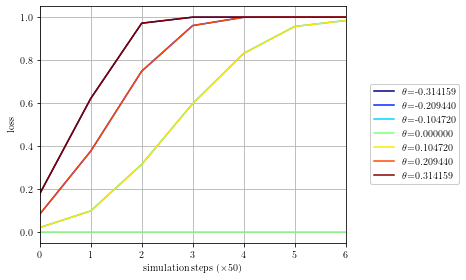

In [290]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))

T = 10
steps = np.arange(0, T + 1)

l = 7
perturb = np.pi / 10
colors = plt.cm.jet(np.linspace(0, 1, l))

for i, delta in enumerate(np.linspace(-perturb, perturb, l)):
    initial_p = np.array([1, 1, 1, 1])
    initial_state = np.array([UNSTABLE_POS, UNSTABLE_VEL, UNSTABLE_ANG +delta, UNSTABLE_ANG_VEL])
    sol = t2_3_opt_p_with_period(initial_state, initial_p, std_f=0, oscillations=3, steps=15)

    cp = CartPole(False)
    linear_policy = sol.x
    action = np.dot(linear_policy, initial_state)
    x0 = np.hstack([initial_state, action])
    cp.setState(initial_state)
    loss_hist = [cp.loss()]
    for _ in steps[1:]:
        cp.performAction(action)
        state = cp.getState()
        loss_hist.append(cp.loss())    
        action = np.dot(linear_policy, state)
    t2_3_roll_out(steps, loss_hist, fig=fig, ax=ax, color=colors[i], label=r'$\theta$={:2f}'.format(UNSTABLE_ANG +delta))


ax.set(xlim=(0, 6))
lgd = fig.legend(loc="right", framealpha=1, bbox_to_anchor=(1.3, 0.52))
fig.savefig("./assets2/task2_3__11.png", bbox_extra_artists=(lgd, ), bbox_inches='tight')

print(sol.x)

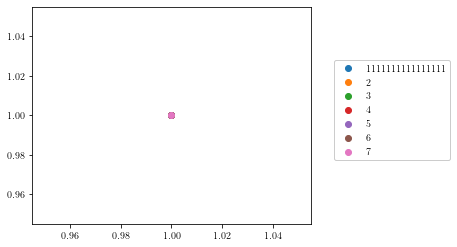

In [273]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))
for i in range(7): ax.scatter(1, 1)
lgd = fig.legend([1111111111111111, 2, 3, 4, 5, 6, 7], loc="right", framealpha=1, bbox_to_anchor=(1.3, 0.52))


Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[10. 10. 10. 10.]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[10. 10. 10. 10.]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[10. 10. 10. 10.]
Total steps to reach 2 oscillations: 4
Total step

[10. 10. 10. 10.]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[10. 10. 10. 10.]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[10. 10. 10. 10.]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[10. 10. 10. 10.]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillat

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[10. 10. 10. 10.]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[10. 10. 10. 10.]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[10. 10. 10. 10.]
[10. 10. 10. 10.]


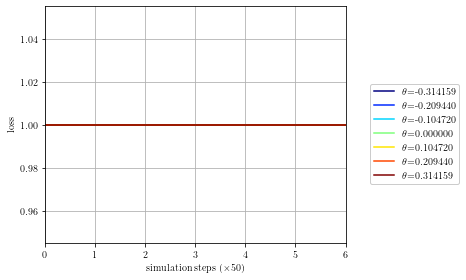

In [302]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))

T = 10
steps = np.arange(0, T + 1)

l = 7
perturb = np.pi / 10
colors = plt.cm.jet(np.linspace(0, 1, l))

for i, delta in enumerate(np.linspace(-perturb, perturb, l)):
    initial_p = np.array([10] * 4)
    initial_state = np.array([UNSTABLE_POS, 14, UNSTABLE_ANG + delta, 14]) # Large oscillations
    sol = t2_3_opt_p_with_period(initial_state, initial_p, std_f=0, oscillations=2, steps=15)

    cp = CartPole(False)
    linear_policy = sol.x
    action = np.dot(linear_policy, initial_state)
    x0 = np.hstack([initial_state, action])
    cp.setState(initial_state)
    loss_hist = [cp.loss()]
    for _ in steps[1:]:
        cp.performAction(action)
        state = cp.getState()
        loss_hist.append(cp.loss())    
        action = np.dot(linear_policy, state)
    t2_3_roll_out(steps, loss_hist, fig=fig, ax=ax, color=colors[i], label=r'$\theta$={:2f}'.format(UNSTABLE_ANG +delta))


ax.set(xlim=(0, 6))
lgd = fig.legend(loc="right", framealpha=1, bbox_to_anchor=(1.3, 0.52))
fig.savefig("./assets2/task2_3__12.png", bbox_extra_artists=(lgd, ), bbox_inches='tight')

print(sol.x)

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-8. -8. -8. -8.]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-8. -8. -8. -8.]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-8. -8. -8. -8.]
Total steps to reach 2 oscillations: 4
Total step

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-8. -8. -8. -8.]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-8. -8. -8. -8.]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-8. -8. -8. -8.]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total step

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-8.  -8.  -8.4 -8. ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-8.3 -7.7 -8.3 -7.8]
Total steps to reach 2 oscillations: 4
[-8.3 -7.7 -8.3 -7.8]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-8.175 -7.925 -8.675 -7.55 ]
Total steps to reach 2 oscillations: 4
[-8.175 -7.925 -8.675 -7.55 ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-8.175 -7.925 -8.675 -7.55 ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-8.02636719 -7.72753906 -8.59277344 -7.82773438]
Total steps to reach 2 oscillations: 4
[-8.02636719 -7.72753906 -8.59277344 -7.82773438]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-8

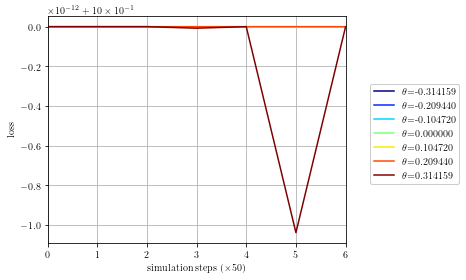

In [324]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))

T = 10
steps = np.arange(0, T + 1)

l = 7
perturb = np.pi / 10
colors = plt.cm.jet(np.linspace(0, 1, l))

for i, delta in enumerate(np.linspace(-perturb, perturb, l)):
    initial_p = np.array([-8] * 4)
    initial_state = np.array([UNSTABLE_POS, 4, UNSTABLE_ANG + delta, 4]) # simple oscillations
    sol = t2_3_opt_p_with_period(initial_state, initial_p, std_f=0, oscillations=2, steps=15)

    cp = CartPole(False)
    linear_policy = sol.x
    action = np.dot(linear_policy, initial_state)
    x0 = np.hstack([initial_state, action])
    cp.setState(initial_state)
    loss_hist = [cp.loss()]
    for _ in steps[1:]:
        cp.performAction(action)
        state = cp.getState()
        loss_hist.append(cp.loss())    
        action = np.dot(linear_policy, state)
    t2_3_roll_out(steps, loss_hist, fig=fig, ax=ax, color=colors[i], label=r'$\theta$={:2f}'.format(UNSTABLE_ANG +delta))


ax.set(xlim=(0, 6))
lgd = fig.legend(loc="right", framealpha=1, bbox_to_anchor=(1.3, 0.52))
fig.savefig("./assets2/task2_3__13.png", bbox_extra_artists=(lgd, ), bbox_inches='tight')

print(sol.x)

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.51875 -0.51875 -0.51875 -0.45   ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.5328125 -0.4640625 -0.5328125 -0.4625   ]
Total steps to reach 2 oscillations: 4
[-0.5328125 -0.4640625 -0.5328125 -0.4625   ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.53925781 -0.48066406 -0.58613281 -0.4015625 ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.56870117 -0.46616211 -0.58198242 -0.32773437]
Total steps to reach 2 oscillations: 4
[-0.56870117 -0.46616211 -0.58198242 -0.32773437]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.64303589 -0.3996521  -0.64977417 -0.26186523]
Total s

Total steps to reach 2 oscillations: 4
[-1.45000418 -1.20170561 -0.17018998  1.986999  ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.37022383 -1.24496535 -0.26689869  2.03012505]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.50471471 -1.17211703 -0.10285237  1.95890057]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.5820549  -1.136498   -0.00948593  1.93032455]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.51296385 -1.15559942 -0.09416997  1.93250279]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.57745961 -1.12847364 -0.01467527  1.91489172]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.89244714 -0.95458536  0.36790972  1.74221462]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.91426471 -0.93713325  0.39288866  1.72214911]
Total steps to 

Total steps to reach 2 oscillations: 4
[-4.60767993 -0.49218385  3.54183591  2.40862902]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.70760947 -0.49319795  3.66431903  2.46067035]
Total steps to reach 2 oscillations: 4
[-4.70760947 -0.49319795  3.66431903  2.46067035]
Total steps to reach 2 oscillations: 4
[-4.70760947 -0.49319795  3.66431903  2.46067035]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.69853423 -0.51736046  3.6674887   2.48758336]
Total steps to reach 2 oscillations: 4
[-4.69853423 -0.51736046  3.6674887   2.48758336]
Total steps to reach 2 oscillations: 4
[-4.69853423 -0.51736046  3.6674887   2.48758336]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.87198545 -0.52591092  3.88788183  2.58318578]
Total steps to reach 2 oscillations: 4
[-4.87198545 -0.52591092  3.88788183  2.58318578]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-12.02186043  -0.17754601  13.85589761   4.21195838]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-11.86601494  -0.22095276  13.65199338   4.23216394]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-11.86601494  -0.22095276  13.65199338   4.23216394]
Total steps to reach 2 oscillations: 4
[-11.86601494  -0.22095276  13.65199338   4.23216394]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-12.16763347  -0.18434028  14.07195079   4.25905898]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-12.16763347  -0.18434028  14.07195079   4.25905898]
Total steps to reach 2 oscillations: 4
[-12.16763347  -0.18434028  14.07195079   4.25905898]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-12.64091499  -0.14292601  14.73761494   4.32676224]
Total steps to reach 2

Total steps to reach 2 oscillations: 4
[-17.47113272  -0.03970289  21.74791378   5.40164366]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-17.47113272  -0.03970289  21.74791378   5.40164366]
Total steps to reach 2 oscillations: 4
[-17.47113272  -0.03970289  21.74791378   5.40164366]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-17.67832404  -0.02904767  22.0464587    5.43789115]
Total steps to reach 2 oscillations: 4
[-17.67832404  -0.02904767  22.0464587    5.43789115]
Total steps to reach 2 oscillations: 4
[-17.67832404  -0.02904767  22.0464587    5.43789115]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-17.78128718  -0.04554007  22.20900913   5.48350441]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-17.78128718  -0.04554007  22.20900913   5.48350441]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.80929881e+01 -2.10

[-1.14412271 -0.22165202 -1.27271282  0.88410745]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.14412271 -0.22165202 -1.27271282  0.88410745]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.14412271 -0.22165202 -1.27271282  0.88410745]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.14412271 -0.22165202 -1.27271282  0.88410745]
Total steps to reach 2 oscillations: 4
[-1.14412271 -0.22165202 -1.27271282  0.88410745]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.14412271 -0.22165202 -1.27271282  0.88410745]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.14412271 -0.22165202 -1.27271282  0.88410745]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.14412271 -0.22165202 -1.27271282  0.88410745]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-1.14412271 -0

Total steps to reach 2 oscillations: 4
[-0.72743463 -1.07319857 -1.98065061  2.38276575]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.72889488 -1.07129786 -1.97324514  2.3803548 ]
Total steps to reach 2 oscillations: 4
[-0.72889488 -1.07129786 -1.97324514  2.3803548 ]
Total steps to reach 2 oscillations: 4
[-0.72889488 -1.07129786 -1.97324514  2.3803548 ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.72971772 -1.070197   -1.97322154  2.37923641]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.73075215 -1.06953263 -1.96417484  2.3792669 ]
Total steps to reach 2 oscillations: 4
[-0.73075215 -1.06953263 -1.96417484  2.3792669 ]
Total steps to reach 2 oscillations: 4
[-0.73075215 -1.06953263 -1.96417484  2.3792669 ]
Total steps to reach 2 oscillations: 4
[-0.73075215 -1.06953263 -1.96417484  2.3792669 ]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.

Total steps to reach 2 oscillations: 4
[-2.60725161  0.17495788  7.97827807  2.82201326]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.57428547  0.15839947  8.04341874  2.77997066]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.59340525  0.15802002  8.03354605  2.83193519]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.65229155  0.16861809  8.54730177  2.91502949]
Total steps to reach 2 oscillations: 4
[-2.65229155  0.16861809  8.54730177  2.91502949]
Total steps to reach 2 oscillations: 4
[-2.65229155  0.16861809  8.54730177  2.91502949]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.64447391  0.13158981  8.62066409  2.99917393]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.65088845  0.11875414  8.9240958   3.03082876]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-2.72462245  0

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.00332033  0.24732368 24.65291907  4.97861925]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.06752775  0.25605815 25.45658589  5.05887297]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.06752775  0.25605815 25.45658589  5.05887297]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.08920912  0.25804684 25.73909777  5.08797673]
Total steps to reach 2 oscillations: 4
[-4.08920912  0.25804684 25.73909777  5.08797673]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.08920912  0.25804684 25.73909777  5.08797673]
Total steps to reach 2 oscillations: 4
[-4.08920912  0.25804684 25.73909777  5.08797673]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-4.08920912  0.25804684 25.73909777  5.08797673]
Total steps to reach 2 oscillations: 4
Total steps to 

Total steps to reach 2 oscillations: 4
[-6.17969841  0.29945386 55.18618885  8.17183637]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-6.17969841  0.29945386 55.18618885  8.17183637]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-6.40448117  0.29486003 58.47687088  8.52079724]
Total steps to reach 2 oscillations: 4
[-6.40448117  0.29486003 58.47687088  8.52079724]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-6.45674795  0.29389257 59.24135327  8.60168976]
Total steps to reach 2 oscillations: 4
[-6.45674795  0.29389257 59.24135327  8.60168976]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-6.5840196   0.29096224 61.10935383  8.79988026]
Total steps to reach 2 oscillations: 4
[-6.5840196   0.29096224 61.10935383  8.79988026]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-6.5840196   0.29096224 61.10935383  8.79988026]
Tota

Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.5 -0.5 -0.5 -0.5]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.5 -0.5 -0.5 -0.5]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.5 -0.5 -0.5 -0.5]
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
Total steps to reach 2 oscillations: 4
[-0.5 -0.5 -0.5 -0.5]
Total steps to 

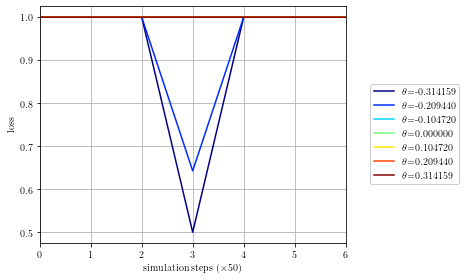

In [330]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))

T = 10
steps = np.arange(0, T + 1)

l = 7
perturb = np.pi / 10
colors = plt.cm.jet(np.linspace(0, 1, l))

for i, delta in enumerate(np.linspace(-perturb, perturb, l)):
    initial_p = np.array([-0.5] * 4)
    initial_state = np.array([UNSTABLE_POS, 2, UNSTABLE_ANG + delta, 2]) # simple oscillations
    sol = t2_3_opt_p_with_period(initial_state, initial_p, std_f=0, oscillations=2, steps=15)

    cp = CartPole(False)
    linear_policy = sol.x
    action = np.dot(linear_policy, initial_state)
    x0 = np.hstack([initial_state, action])
    cp.setState(initial_state)
    loss_hist = [cp.loss()]
    for _ in steps[1:]:
        cp.performAction(action)
        state = cp.getState()
        loss_hist.append(cp.loss())    
        action = np.dot(linear_policy, state)
    t2_3_roll_out(steps, loss_hist, fig=fig, ax=ax, color=colors[i], label=r'$\theta$={:2f}'.format(UNSTABLE_ANG +delta))


ax.set(xlim=(0, 6))
lgd = fig.legend(loc="right", framealpha=1, bbox_to_anchor=(1.3, 0.52))
fig.savefig("./assets2/task2_3__14.png", bbox_extra_artists=(lgd, ), bbox_inches='tight')

print(sol.x)

Samples drawn: 2048
(2048, 320)


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:217: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y_train)


(320, 4)
SE: [  17.67831584  597.74983486   54.54273515 3440.88259866]


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:573: UserWarning: The following kwargs were not used by contour: 'negative_linestyles'
  


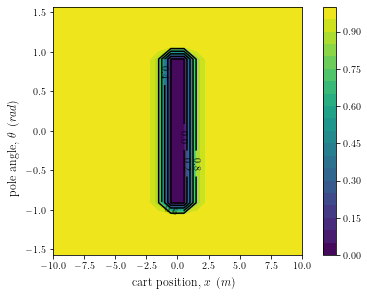

In [357]:
from utilities import *
from task2 import *


x, xi, *_, w, _, _, _ = compute_weights_tts_with_action(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

l = 20
perturb = np.pi / 2
colors = plt.cm.jet(np.linspace(0, 1, l))

ang_range = np.linspace(-perturb, perturb, l)
pos_range, *_ = get_ranges(l)

fig, axs = plt.subplots(1, 1, figsize=(5, 4), layout='constrained')

p, q = 0, 2
x, y = np.meshgrid(pos_range, ang_range, indexing='ij')

cp = CartPole(False)
z = []
z0 = np.array([UNSTABLE_POS, 0, UNSTABLE_ANG, 0])

for i in range(len(x)):
    for j in range(len(y)):
        z0[p] = x[i][j]
        z0[q] = y[i][j]
        initial_p = [1] * 4
        sol = t2_3_opt_p_with_period_no_print(z0, initial_p, std_f=0, oscillations=2, steps=6)        
        cp = CartPole(False)
        linear_policy = sol.x
        action = np.dot(linear_policy, z0)
        
        cp.setState(z0)
        for _ in np.arange(4): # 4 steps for 2 oscillations
            cp.performAction(action)
            action = np.dot(linear_policy, cp.getState())
        z.append(cp.loss())
        cp.reset()

z = np.array(z)
xlim = (x.min(), x.max())
ylim = (y.min(), y.max())
t2_3_plot_optimisation_contour(x, y, z, fig, axs, xlim=xlim, ylim=ylim, colors='black')

fig.supxlabel(STATE_LABELS[p])
fig.supylabel(STATE_LABELS[q])
fig.savefig("./assets2/task2_3__20.png")

In [ ]:
#

In [ ]:
# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _, _, _, w, *_ = compute_weights_tts_with_action(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
# cp.delta_time = 0.002
cp.sim_steps = 1
cp_no_action = CartPole(False)
cp_hat = CartPoleHat(False)
T = 50
steps = np.arange(0, T + 1)

x0 = np.array([0, 0, 0.1, 0])
cp.setState(x0)
cp_hat.setState(x0)
cp_hat.setTrainedParams(w, xi, sigma)

initial_p = [1, 1, 1, 1]

with redirect_stdout(None):
    sol = t2_3_opt_p(x0, initial_p, steps=20)
    
linear_policy = sol.x
print(sol.x)
action = np.dot(linear_policy, x0)
action_hat = np.dot(linear_policy, x0)

x = x0[None, ...]
x_hat = x0[None, ...]
x_no_action = x0[None, ...]
for _ in steps[1:]:
    cp.performAction(action)
    cp_no_action.remap_angle()
    cp.performAction(action)
    cp.remap_angle()
    cp_hat.performAction(action_hat)
    cp_hat.remap_angle()

    x = np.vstack([x, cp.getState()])
    x_hat = np.vstack([x_hat, cp_hat.getState()])
    x_no_action = np.vstack([x_no_action, cp_no_action.getState()])
    
    action = np.dot(linear_policy, x[-1])
    action = np.dot(linear_policy, x_hat[-1])


t2_3_roll_out(steps, x, x_hat, x_no_action, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$")
cp.reset()

fig.tight_layout()
lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=3)
fig.savefig("./assets2/task2_3__30.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
(2048, 320)


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:217: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y_train)


(320, 4)
SE: [  17.67831584  597.74983486   54.54273515 3440.88259866]
[1.00044874 1.01329332 1.05344106 1.00686865]


Samples drawn: 2048
(2048, 320)


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:217: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y_train)


(320, 4)
SE: [  17.67831584  597.74983486   54.54273515 3440.88259866]


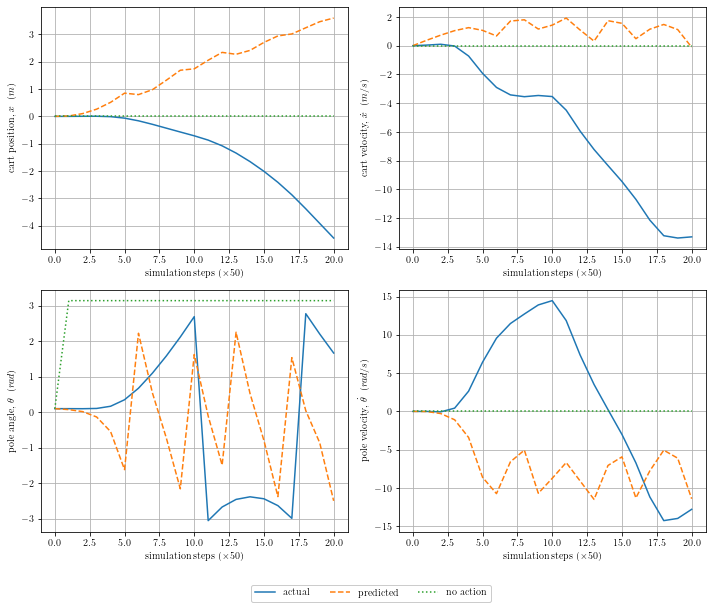

In [9]:
# Now, we try to reduce the time delta for the euler integration

# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _, _, _, w, *_ = compute_weights_tts_with_action(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_no_action = CartPole(False)
cp_hat = CartPoleHat(False)
cp.delta_time = cp_no_action.delta_time = cp_hat.delta_time = 0.02

T = 20
steps = np.arange(0, T + 1)

x0 = np.array([0, 0, 0.1, 0])
cp.setState(x0)
cp_hat.setState(x0)
cp_hat.setTrainedParams(w, xi, sigma)

initial_p = [1, 1, 1, 1]

with redirect_stdout(None):
    sol = t2_3_opt_p(x0, initial_p, steps=5)
    
linear_policy = sol.x
action = np.dot(linear_policy, x0)
action_hat = np.dot(linear_policy, x0)

x = x0[None, ...]
x_hat = x0[None, ...]
x_no_action = x0[None, ...]
for _ in steps[1:]:
    cp.performAction(action)
    cp_no_action.remap_angle()
    cp.performAction(action)
    cp.remap_angle()
    cp_hat.performAction(action_hat)
    cp_hat.remap_angle()

    x = np.vstack([x, cp.getState()])
    x_hat = np.vstack([x_hat, cp_hat.getState()])
    x_no_action = np.vstack([x_no_action, cp_no_action.getState()])
    
    action = np.dot(linear_policy, x[-1])
    action = np.dot(linear_policy, x_hat[-1])


t2_3_roll_out(steps, x, x_hat, x_no_action, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$")
cp.reset()

fig.tight_layout()
lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=3)
fig.savefig("./assets2/task2_3__40.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
(2048, 320)
(320, 4)
SE: [  17.67831584  597.74983486   54.54273515 3440.88259866]
[ 0.6  1.2 70.  10. ]


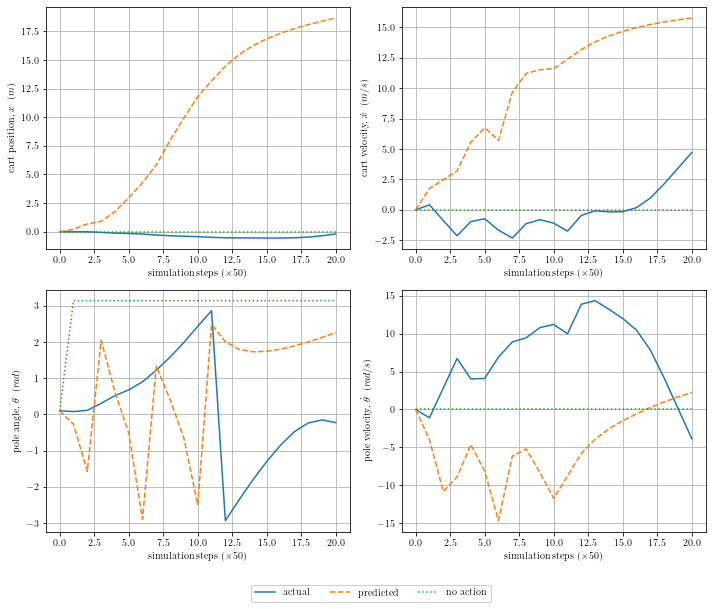

In [64]:
# Now, we try to reduce the time delta for the euler integration

# First check if model fits well from varying cart position - expect no change, but changes, so poor fi

x, xi, _, _, _, w, *_ = compute_weights_tts_with_action(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_no_action = CartPole(False)
cp_hat = CartPoleHat(False)
cp.delta_time = cp_no_action.delta_time = cp_hat.delta_time = 0.02

T = 20
steps = np.arange(0, T + 1)

x0 = np.array([0, 0, 0.1, 0])
cp.setState(x0)
cp_hat.setState(x0)
cp_hat.setTrainedParams(w, xi, sigma)

initial_p = [0.6, 1.2, 70, 10]

with redirect_stdout(None):
    sol = t2_3_opt_p(x0, initial_p, steps=10)
    
linear_policy = sol.x
print(sol.x)
action = np.dot(linear_policy, x0)
action_hat = np.dot(linear_policy, x0)

x = x0[None, ...]
x_hat = x0[None, ...]
x_no_action = x0[None, ...]
for _ in steps[1:]:
    cp.performAction(action)
    cp_no_action.remap_angle()
    cp.performAction(action)
    cp.remap_angle()
    cp_hat.performAction(action_hat)
    cp_hat.remap_angle()

    x = np.vstack([x, cp.getState()])
    x_hat = np.vstack([x_hat, cp_hat.getState()])
    x_no_action = np.vstack([x_no_action, cp_no_action.getState()])
    
    action = np.dot(linear_policy, x[-1])
    action = np.dot(linear_policy, x_hat[-1])


t2_3_roll_out(steps, x, x_hat, x_no_action, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$")
cp.reset()

fig.tight_layout()
lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=3)
fig.savefig("./assets2/task2_3__41.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
(2048, 320)
(320, 4)
SE: [  17.67831584  597.74983486   54.54273515 3440.88259866]
[ 2.8  8.   7.  -4. ]


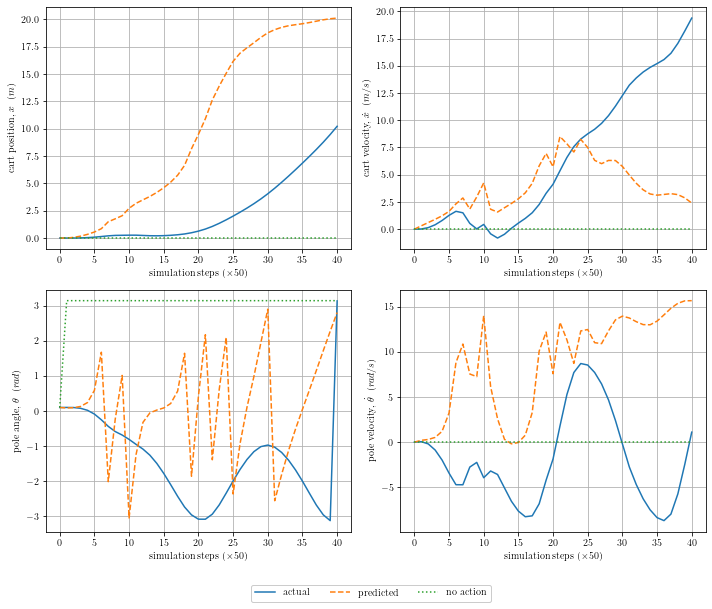

In [63]:
# Now, we try to reduce the time delta for the euler integration

# First check if model fits well from varying cart position - expect no change, but changes, so poor fi
from task2 import *

x, xi, _, _, _, w, *_ = compute_weights_tts_with_action(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_no_action = CartPole(False)
cp_hat = CartPoleHat(False)
cp.delta_time = cp_no_action.delta_time = cp_hat.delta_time = 0.02

T = 40
steps = np.arange(0, T + 1)

x0 = np.array([0, 0, 0.1, 0])
cp.setState(x0)
cp_hat.setState(x0)
cp_hat.setTrainedParams(w, xi, sigma)
initial_p = [2.8, 8, 7, -4]

with redirect_stdout(None):
    sol = t2_3_opt_p_custom(x0, initial_p, steps=40)

linear_policy = sol.x
print(linear_policy)

action = np.dot(linear_policy, x0)
action_hat = np.dot(linear_policy, x0)

x = x0[None, ...]
x_hat = x0[None, ...]
x_no_action = x0[None, ...]
for _ in steps[1:]:
    cp.performAction(action)
    cp_no_action.remap_angle()
    cp.performAction(action)
    cp.remap_angle()
    cp_hat.performAction(action_hat)
    cp_hat.remap_angle()

    x = np.vstack([x, cp.getState()])
    x_hat = np.vstack([x_hat, cp_hat.getState()])
    x_no_action = np.vstack([x_no_action, cp_no_action.getState()])
    
    action = np.dot(linear_policy, x[-1])
    action = np.dot(linear_policy, x_hat[-1])


t2_3_roll_out(steps, x, x_hat, x_no_action, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$")
cp.reset()

fig.tight_layout()
lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=3)
fig.savefig("./assets2/task2_3__42.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
(2048, 320)
(320, 4)
SE: [  17.67831584  597.74983486   54.54273515 3440.88259866]
[array([2.]), 1, 1, array([3.31865234])]
[array([2.1]), 1, 1, array([3.31865234])]
[array([1.9]), 1, 1, array([3.31865234])]
[array([1.8]), 1, 1, array([3.31865234])]
[array([1.6]), 1, 1, array([3.31865234])]
[array([1.4]), 1, 1, array([3.31865234])]
[array([1.]), 1, 1, array([3.31865234])]
[array([1.2]), 1, 1, array([3.31865234])]
[array([1.]), 1, 1, array([3.31865234])]
[array([1.3]), 1, 1, array([3.31865234])]
[array([1.4]), 1, 1, array([3.31865234])]
[array([1.25]), 1, 1, array([3.31865234])]
[array([1.2]), 1, 1, array([3.31865234])]
[array([1.275]), 1, 1, array([3.31865234])]
[array([1.225]), 1, 1, array([3.31865234])]
[array([1.2625]), 1, 1, array([3.31865234])]
[array([1.275]), 1, 1, array([3.31865234])]
[array([1.25625]), 1, 1, array([3.31865234])]
[array([1.25]), 1, 1, array([3.31865234])]
[array([1.259375]), 1, 1, array([3.31865234])]
[array([1.2625]), 1, 1, array([3.3186523

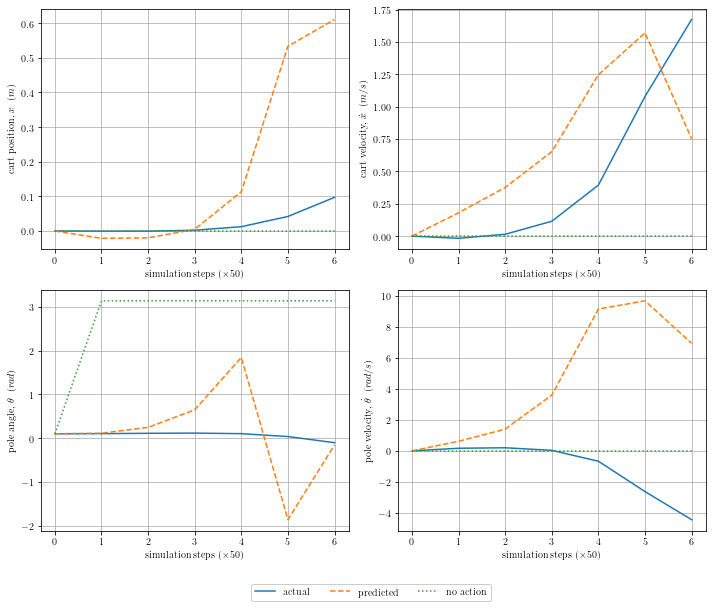

In [111]:
## Now, we try to reduce the time delta for the euler integration

# First check if model fits well from varying cart position - expect no change, but changes, so poor fi
from task2 import *

x, xi, _, _, _, w, *_ = compute_weights_tts_with_action(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_no_action = CartPole(False)
cp_hat = CartPoleHat(False)
cp.delta_time = cp_no_action.delta_time = cp_hat.delta_time = 0.02

T = 6
steps = np.arange(0, T + 1)

x0 = np.array([0, 0, 0.1, 0])
cp.setState(x0)
cp_hat.setState(x0)
cp_hat.setTrainedParams(w, xi, sigma)
initial_p = 2

sol = t2_3_opt_p_individual(x0, initial_p, steps=4, vary=0)

linear_policy = [sol.x, 1, 1, 1]
print(linear_policy)

action = np.dot(linear_policy, x0)
action_hat = np.dot(linear_policy, x0)

x = x0[None, ...]
x_hat = x0[None, ...]
x_no_action = x0[None, ...]
for _ in steps[1:]:
    cp.performAction(action)
    cp_no_action.remap_angle()
    cp.performAction(action)
    cp.remap_angle()
    cp_hat.performAction(action_hat)
    cp_hat.remap_angle()

    x = np.vstack([x, cp.getState()])
    x_hat = np.vstack([x_hat, cp_hat.getState()])
    x_no_action = np.vstack([x_no_action, cp_no_action.getState()])
    
    action = np.dot(linear_policy, x[-1])
    action = np.dot(linear_policy, x_hat[-1])


t2_3_roll_out(steps, x, x_hat, x_no_action, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$")
cp.reset()

fig.tight_layout()
lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=3)
fig.savefig("./assets2/task2_3__43.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
(2048, 320)
(320, 4)
SE: [  17.67831584  597.74983486   54.54273515 3440.88259866]
[1, array([1.00408936]), 1, 1]


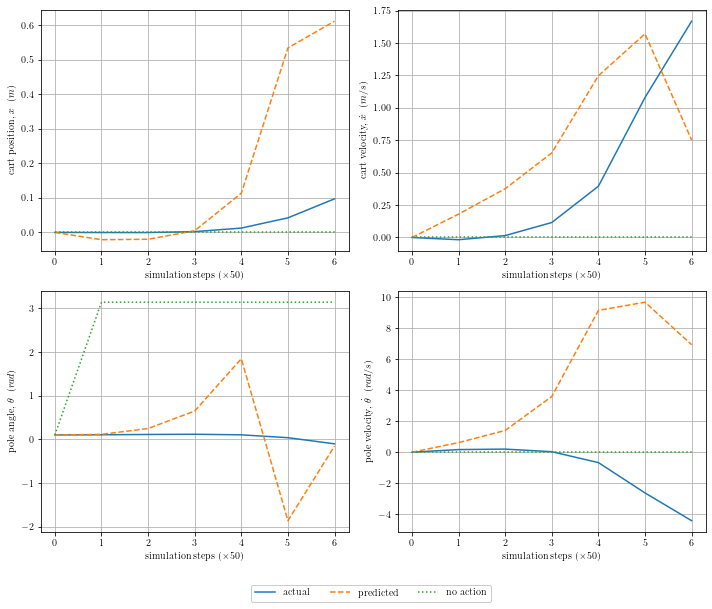

In [112]:
## Now, we try to reduce the time delta for the euler integration

# First check if model fits well from varying cart position - expect no change, but changes, so poor fi
from task2 import *

x, xi, _, _, _, w, *_ = compute_weights_tts_with_action(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_no_action = CartPole(False)
cp_hat = CartPoleHat(False)
cp.delta_time = cp_no_action.delta_time = cp_hat.delta_time = 0.02

T = 6
steps = np.arange(0, T + 1)

x0 = np.array([0, 0, 0.1, 0])
cp.setState(x0)
cp_hat.setState(x0)
cp_hat.setTrainedParams(w, xi, sigma)
initial_p = -20

with redirect_stdout(None):
    sol = t2_3_opt_p_individual(x0, initial_p, steps=4, vary=1)

linear_policy = [1, sol.x, 1, 1]
print(linear_policy)

action = np.dot(linear_policy, x0)
action_hat = np.dot(linear_policy, x0)

x = x0[None, ...]
x_hat = x0[None, ...]
x_no_action = x0[None, ...]
for _ in steps[1:]:
    cp.performAction(action)
    cp_no_action.remap_angle()
    cp.performAction(action)
    cp.remap_angle()
    cp_hat.performAction(action_hat)
    cp_hat.remap_angle()

    x = np.vstack([x, cp.getState()])
    x_hat = np.vstack([x_hat, cp_hat.getState()])
    x_no_action = np.vstack([x_no_action, cp_no_action.getState()])
    
    action = np.dot(linear_policy, x[-1])
    action = np.dot(linear_policy, x_hat[-1])


t2_3_roll_out(steps, x, x_hat, x_no_action, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$")
cp.reset()

fig.tight_layout()
lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=3)
fig.savefig("./assets2/task2_3__44.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
(2048, 320)
(320, 4)
SE: [  17.67831584  597.74983486   54.54273515 3440.88259866]
[1, 1, array([-9.79077148]), 1]


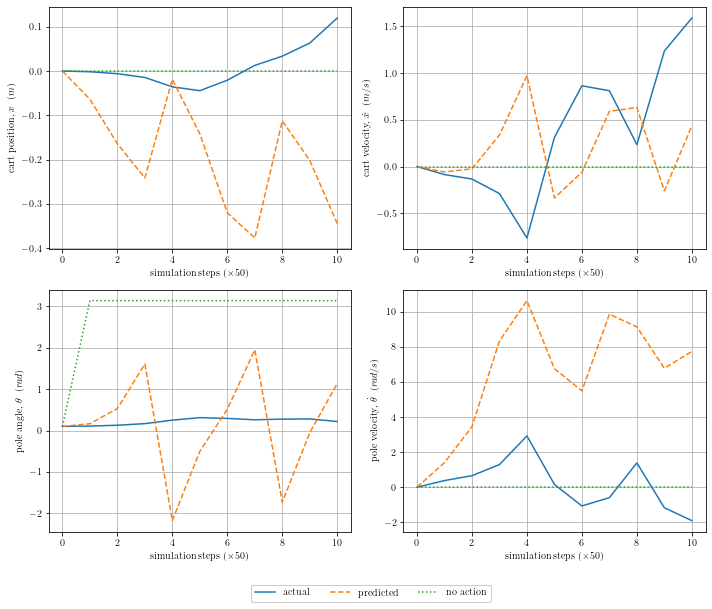

In [86]:
## Now, we try to reduce the time delta for the euler integration

# First check if model fits well from varying cart position - expect no change, but changes, so poor fi
from task2 import *

x, xi, _, _, _, w, *_ = compute_weights_tts_with_action(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_no_action = CartPole(False)
cp_hat = CartPoleHat(False)
cp.delta_time = cp_no_action.delta_time = cp_hat.delta_time = 0.02

T = 10
steps = np.arange(0, T + 1)

x0 = np.array([0, 0, 0.1, 0])
cp.setState(x0)
cp_hat.setState(x0)
cp_hat.setTrainedParams(w, xi, sigma)
initial_p = -10

with redirect_stdout(None):
    sol = t2_3_opt_p_individual(x0, initial_p, steps=T, vary=2)

linear_policy = [1, 1, sol.x, 1]
print(linear_policy)

action = np.dot(linear_policy, x0)
action_hat = np.dot(linear_policy, x0)

x = x0[None, ...]
x_hat = x0[None, ...]
x_no_action = x0[None, ...]
for _ in steps[1:]:
    cp.performAction(action)
    cp_no_action.remap_angle()
    cp.performAction(action)
    cp.remap_angle()
    cp_hat.performAction(action_hat)
    cp_hat.remap_angle()

    x = np.vstack([x, cp.getState()])
    x_hat = np.vstack([x_hat, cp_hat.getState()])
    x_no_action = np.vstack([x_no_action, cp_no_action.getState()])
    
    action = np.dot(linear_policy, x[-1])
    action = np.dot(linear_policy, x_hat[-1])


t2_3_roll_out(steps, x, x_hat, x_no_action, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$")
cp.reset()

fig.tight_layout()
lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=3)
fig.savefig("./assets2/task2_3__45.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
(2048, 320)
(320, 4)
SE: [  17.67831584  597.74983486   54.54273515 3440.88259866]
[1, 1, 1, array([2.])]
[1, 1, 1, array([2.1])]
[1, 1, 1, array([2.2])]
[1, 1, 1, array([2.3])]
[1, 1, 1, array([2.5])]
[1, 1, 1, array([2.7])]
[1, 1, 1, array([3.1])]
[1, 1, 1, array([3.5])]
[1, 1, 1, array([4.3])]
[1, 1, 1, array([3.1])]
[1, 1, 1, array([3.9])]
[1, 1, 1, array([3.3])]
[1, 1, 1, array([3.1])]
[1, 1, 1, array([3.4])]
[1, 1, 1, array([3.2])]
[1, 1, 1, array([3.35])]
[1, 1, 1, array([3.25])]
[1, 1, 1, array([3.325])]
[1, 1, 1, array([3.35])]
[1, 1, 1, array([3.3125])]
[1, 1, 1, array([3.3])]
[1, 1, 1, array([3.31875])]
[1, 1, 1, array([3.325])]
[1, 1, 1, array([3.315625])]
[1, 1, 1, array([3.321875])]
[1, 1, 1, array([3.3171875])]
[1, 1, 1, array([3.3203125])]
[1, 1, 1, array([3.31796875])]
[1, 1, 1, array([3.31953125])]
[1, 1, 1, array([3.31835938])]
[1, 1, 1, array([3.31914063])]
[1, 1, 1, array([3.31855469])]
[1, 1, 1, array([3.31835938])]
[1, 1, 1, array([3.31865234]

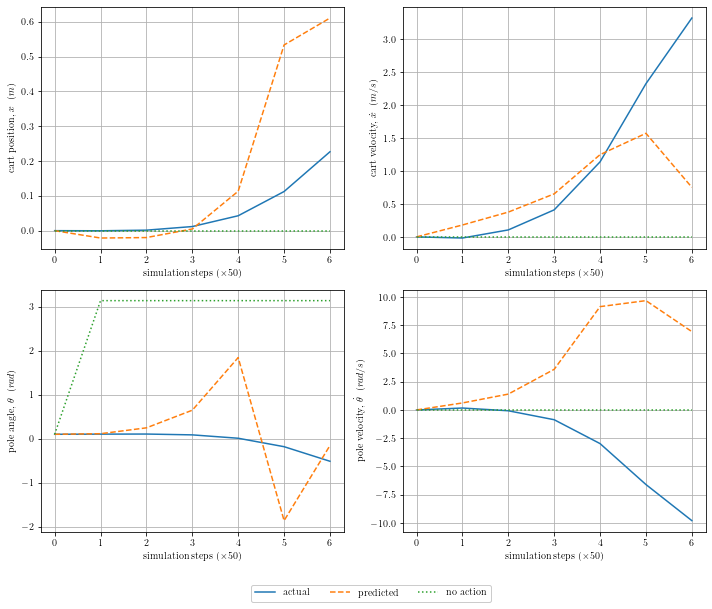

In [110]:
## Now, we try to reduce the time delta for the euler integration

# First check if model fits well from varying cart position - expect no change, but changes, so poor fi
from task2 import *

x, xi, _, _, _, w, *_ = compute_weights_tts_with_action(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

fig, axs = plt.subplots(-250, 1, figsize=(10, 8))


cp = CartPole(False)
cp_no_action = CartPole(False)
cp_hat = CartPoleHat(False)
cp.delta_time = cp_no_action.delta_time = cp_hat.delta_time = 0.02

T = 6
steps = np.arange(0, T + 1)

x0 = np.array([0, 0, 0.1, 0])
cp.setState(x0)
cp_hat.setState(x0)
cp_hat.setTrainedParams(w, xi, sigma)
initial_p = 2

sol = t2_3_opt_p_individual(x0, initial_p, steps=4, vary=3)

linear_policy = [1, 1, 1, sol.x]
print(linear_policy)

action = np.dot(linear_policy, x0)
action_hat = np.dot(linear_policy, x0)

x = x0[None, ...]
x_hat = x0[None, ...]
x_no_action = x0[None, ...]
for _ in steps[1:]:
    cp.performAction(action)
    cp_no_action.remap_angle()
    cp.performAction(action)
    cp.remap_angle()
    cp_hat.performAction(action_hat)
    cp_hat.remap_angle()

    x = np.vstack([x, cp.getState()])
    x_hat = np.vstack([x_hat, cp_hat.getState()])
    x_no_action = np.vstack([x_no_action, cp_no_action.getState()])
    
    action = np.dot(linear_policy, x[-1])
    action = np.dot(linear_policy, x_hat[-1])


t2_3_roll_out(steps, x, x_hat, x_no_action, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$")
cp.reset()

fig.tight_layout()
lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=3)
fig.savefig("./assets2/task2_3__46.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
(2048, 320)


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:217: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y_train)


(320, 4)
SE: [  17.67831584  597.74983486   54.54273515 3440.88259866]
[ 1.30558838  1.04174271 -8.73        3.42375   ]
[ 1.30558838  1.04174271 -8.73        3.42375   ]
[ 1.30558838  1.04174271 -8.73        3.42375   ]
[ 1.32623398  1.01114936 -8.063125    3.78726562]
[ 1.32623398  1.01114936 -8.063125    3.78726562]
[ 1.28506567  1.1089108  -6.73695312  3.87266602]
[ 1.28506567  1.1089108  -6.73695312  3.87266602]
[ 1.3591379   1.06436904 -5.90904297  4.1345874 ]
[ 1.33798538  1.11980723 -5.9080957   4.19416626]
[ 1.35516701  1.17531283 -4.55776855  4.23132751]
[ 1.35516701  1.17531283 -4.55776855  4.23132751]
[ 1.35516701  1.17531283 -4.55776855  4.23132751]
[ 1.35516701  1.17531283 -4.55776855  4.23132751]
[ 1.35516701  1.17531283 -4.55776855  4.23132751]
[ 1.35516701  1.17531283 -4.55776855  4.23132751]
[ 1.35516701  1.17531283 -4.55776855  4.23132751]
[ 1.35516701  1.17531283 -4.55776855  4.23132751]
[ 1.35516701  1.17531283 -4.55776855  4.23132751]
[ 1.35516701  1.17531283 -4.5

[-0.32713636  0.75479075 15.07618517  2.31537851]
[-0.32713636  0.75479075 15.07618517  2.31537851]
[ 0.13334676  0.53220999 15.06657435  2.20941628]
[ 0.13334676  0.53220999 15.06657435  2.20941628]
[ 0.04399966  0.6150622  15.17971347  2.24879446]
[-0.12992524  0.64175893 15.07522675  2.25463526]
[-0.12992524  0.64175893 15.07522675  2.25463526]
[ 0.15606694  0.58063893 15.15458085  2.22937522]
[ 0.15606694  0.58063893 15.15458085  2.22937522]
[ 0.04151852  0.56896139 15.08255253  2.21687702]
[ 0.04151852  0.56896139 15.08255253  2.21687702]
[ 0.04151852  0.56896139 15.08255253  2.21687702]
[ 0.04151852  0.56896139 15.08255253  2.21687702]
[ 0.18893738  0.56592218 15.12172899  2.21742574]
[ 0.18893738  0.56592218 15.12172899  2.21742574]
[ 0.18893738  0.56592218 15.12172899  2.21742574]
[ 0.1326888   0.54624736 15.09697341  2.20266606]
[ 0.11935804  0.57673293 15.0609478   2.21724087]
[ 0.11935804  0.57673293 15.0609478   2.21724087]
[ 0.15219888  0.58036424 15.12408799  2.219459  ]


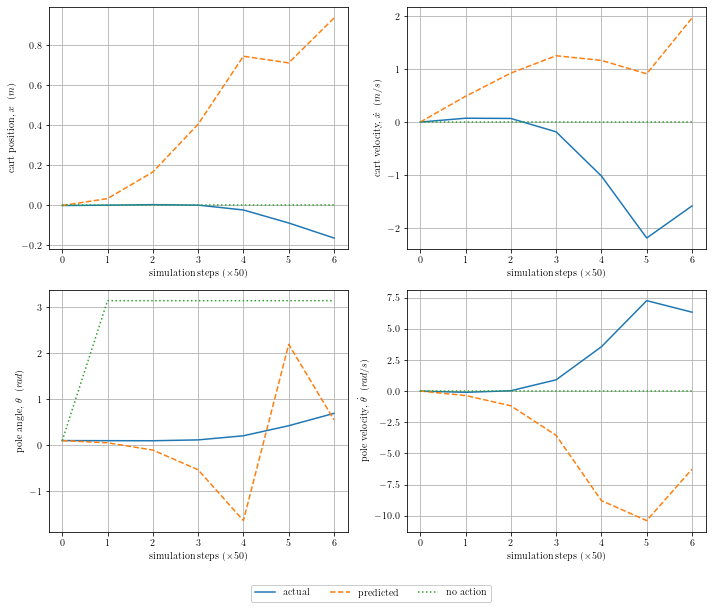

In [119]:
# Now, we try to reduce the time delta for the euler integration

# First check if model fits well from varying cart position - expect no change, but changes, so poor fi
from task2 import *

x, xi, _, _, _, w, *_ = compute_weights_tts_with_action(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_no_action = CartPole(False)
cp_hat = CartPoleHat(False)
cp.delta_time = cp_no_action.delta_time = cp_hat.delta_time = 0.02

T = 6
steps = np.arange(0, T + 1)

x0 = np.array([0, 0, 0.1, 0])
cp.setState(x0)
cp_hat.setState(x0)
cp_hat.setTrainedParams(w, xi, sigma)
initial_p = [1.25839844, 1.00408936, -9.7, 3.3]

sol = t2_3_opt_p(x0, initial_p, steps=4)

linear_policy = sol.x
print(linear_policy)

action = np.dot(linear_policy, x0)
action_hat = np.dot(linear_policy, x0)

x = x0[None, ...]
x_hat = x0[None, ...]
x_no_action = x0[None, ...]
for _ in steps[1:]:
    cp.performAction(action)
    cp_no_action.remap_angle()
    cp.performAction(action)
    cp.remap_angle()
    cp_hat.performAction(action_hat)
    cp_hat.remap_angle()

    x = np.vstack([x, cp.getState()])
    x_hat = np.vstack([x_hat, cp_hat.getState()])
    x_no_action = np.vstack([x_no_action, cp_no_action.getState()])
    
    action = np.dot(linear_policy, x[-1])
    action = np.dot(linear_policy, x_hat[-1])


t2_3_roll_out(steps, x, x_hat, x_no_action, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$")
cp.reset()

fig.tight_layout()
lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=3)
fig.savefig("./assets2/task2_3__50.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
(2048, 320)
(320, 4)
SE: [  17.67831584  597.74983486   54.54273515 3440.88259866]
[ 1.30558838  1.04174271 -8.73        3.42375   ]
[ 1.30558838  1.04174271 -8.73        3.42375   ]
[ 1.20924225  1.10292941 -8.60875     3.62484375]
[ 1.20924225  1.10292941 -8.60875     3.62484375]
[ 1.31812321  1.1694111  -6.83546875  3.69896484]
[ 1.31812321  1.1694111  -6.83546875  3.69896484]
[ 1.31812321  1.1694111  -6.83546875  3.69896484]
[ 1.31812321  1.1694111  -6.83546875  3.69896484]
[ 1.31812321  1.1694111  -6.83546875  3.69896484]
[ 1.31812321  1.1694111  -6.83546875  3.69896484]
[ 1.31812321  1.1694111  -6.83546875  3.69896484]
[ 1.31812321  1.1694111  -6.83546875  3.69896484]
[ 1.30652782  1.26913863 -5.94755524  3.66897022]
[ 1.38557064  1.16185604 -6.68862778  3.49972853]
[ 1.38557064  1.16185604 -6.68862778  3.49972853]
[ 1.38557064  1.16185604 -6.68862778  3.49972853]
[ 1.38557064  1.16185604 -6.68862778  3.49972853]
[ 1.38557064  1.16185604 -6.68862778  3.4997285

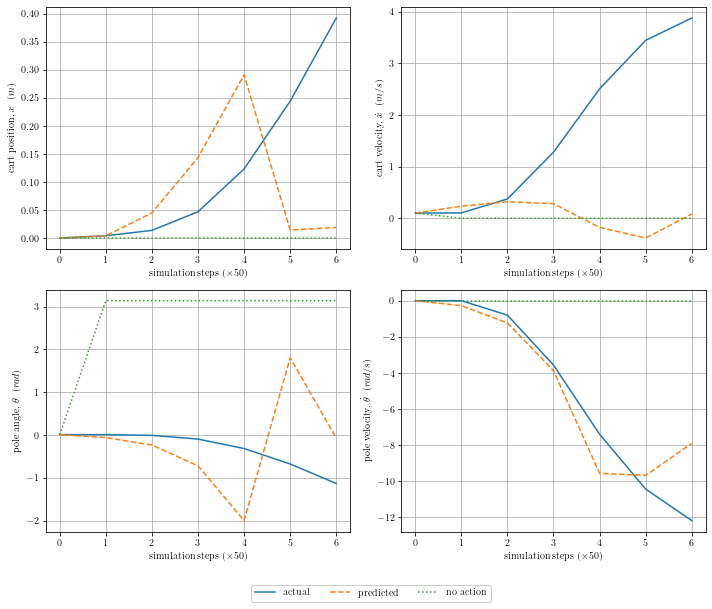

In [118]:
# What about other initial states?
# Now, we try to reduce the time delta for the euler integration

# First check if model fits well from varying cart position - expect no change, but changes, so poor fi
from task2 import *

x, xi, _, _, _, w, *_ = compute_weights_tts_with_action(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_no_action = CartPole(False)
cp_hat = CartPoleHat(False)
cp.delta_time = cp_no_action.delta_time = cp_hat.delta_time = 0.02

T = 6
steps = np.arange(0, T + 1)

x0 = np.array([0, 0.1, 0.01, 0])
cp.setState(x0)
cp_hat.setState(x0)
cp_hat.setTrainedParams(w, xi, sigma)
initial_p = [1.25839844, 1.00408936, -9.7, 3.3]

sol = t2_3_opt_p(x0, initial_p, steps=4)

linear_policy = sol.x
print(linear_policy)

action = np.dot(linear_policy, x0)
action_hat = np.dot(linear_policy, x0)

x = x0[None, ...]
x_hat = x0[None, ...]
x_no_action = x0[None, ...]
for _ in steps[1:]:
    cp.performAction(action)
    cp_no_action.remap_angle()
    cp.performAction(action)
    cp.remap_angle()
    cp_hat.performAction(action_hat)
    cp_hat.remap_angle()

    x = np.vstack([x, cp.getState()])
    x_hat = np.vstack([x_hat, cp_hat.getState()])
    x_no_action = np.vstack([x_no_action, cp_no_action.getState()])
    
    action = np.dot(linear_policy, x[-1])
    action = np.dot(linear_policy, x_hat[-1])


t2_3_roll_out(steps, x, x_hat, x_no_action, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$")
cp.reset()

fig.tight_layout()
lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=3)
fig.savefig("./assets2/task2_3__60.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


# Task 2.4

Samples drawn: 2048
(2048, 320)
(320, 4)
SE: [  17.67831584  597.74983486   54.54273515 3440.88259866]
[ 1.25839844  1.00408936 -9.7         3.3       ]
[ 1.32131836  1.00408936 -9.7         3.3       ]
[ 1.25839844  1.05429383 -9.7         3.3       ]
[  1.25839844   1.00408936 -10.185        3.3       ]
[ 1.25839844  1.00408936 -9.7         3.465     ]
[ 1.2898584   1.02919159 -9.215       3.3825    ]
[ 1.30558838  1.04174271 -8.73        3.42375   ]
[ 1.21907349  1.04801827 -9.215       3.444375  ]
[ 1.26233094  0.99467602 -8.9725      3.5165625 ]
[ 1.26429718  1.04017382 -8.60875     3.62484375]
[ 1.26724655  1.05821605 -8.063125    3.78726562]
[ 1.26872124  1.06723717 -7.7903125   3.62097656]
[ 1.27388264  1.09881107 -6.83546875  3.69896484]
[ 1.33545077  1.04870466 -7.08554687  3.76889648]


/Users/chongzhenyuen/Library/CloudStorage/OneDrive-UniversityofCambridge/2A/SF3-Project-Machine-Learning-Cartpole-Duplicate/task2.py:217: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  W, residuals, rank, s = np.linalg.lstsq(K_NM, Y_train)


[ 1.32875324  1.12906122 -6.38457031  3.82287598]
[ 1.36196439  1.19625383 -5.09060547  3.97603271]
[ 1.31368379  1.15925009 -4.80737305  4.19182983]
[ 1.37524424  1.19329377 -3.84637207  4.03059631]
[ 1.42924308  1.26083263 -1.73799561  4.15226166]
[ 1.35393618  1.30886915 -2.15017456  4.24064804]
[ 1.45553108  1.36379178 -0.05760559  4.58142128]
[1.5463553  1.49628213 3.33132599 5.0226495 ]
[1.53206568 1.47186878 1.98364822 4.50396612]
[1.56883574 1.57267252 5.80400749 4.98372994]
[ 1.67227141  1.76088187 11.25131397  5.48757856]
[1.73603155 1.68606356 9.56432085 5.34257988]
[ 1.81411889  1.94671554 14.80330012  6.02612537]
[ 1.8523229   1.97310277 17.49148224  6.43550053]
[ 1.99101708  2.18709973 23.22388261  6.62324267]
[1.65752074 1.66898653 8.30446514 5.42279779]
[1.5876484  1.55822098 4.4702178  4.70404027]
[1.65381703 1.66194143 7.72553391 5.13690533]
[1.54570147 1.44222116 3.61951682 4.66880541]
[ 1.74701454  1.82059194 12.0073543   5.68679538]
[ 1.7526021   1.80632052 12.8381

[-3.76979178 -0.04127747 12.8858164   2.88691698]
[-4.1633216  -0.11708827 13.19746928  2.80330285]
[-4.54387379 -0.21181307 13.38596373  2.67074498]
[-4.96373077 -0.33246054 13.60882254  2.53552326]
[-4.5350889  -0.2190409  13.39030173  2.68023756]
[-4.82575085 -0.25884674 13.70998812  2.65964701]
[-4.57765363 -0.20200904 13.53387242  2.70998984]
[-4.72289231 -0.22716739 13.66183325  2.67618554]
[-4.42364271 -0.13872375 13.55728722  2.80532472]
[-5.43313355 -0.40057338 14.02014335  2.44140412]
[-4.2269931  -0.11341992 13.35808044  2.83376129]
[-4.13295011 -0.08671532 13.27159421  2.83336125]
[-3.78654974e+00 -6.49609532e-04  1.30523972e+01  2.92021837e+00]
[-4.03616513 -0.02816726 13.42883535  2.94699998]
[-4.25763185 -0.08393409 13.49209609  2.84060302]
[-4.27295123 -0.06919117 13.55910392  2.84402389]
[-3.98563649 -0.02386396 13.29379767  2.88838917]
[-4.34784975 -0.1322688  13.35473069  2.7174085 ]
[-3.4736013   0.11418061 12.96818151  3.00883443]
[-4.25346965 -0.05492205 13.535509

[-0.46189538 -0.87464395 18.55862398  2.12145567]
[-0.50393562 -0.77670937 18.13176712  2.16851919]
[-0.34280274 -0.85801246 18.12924463  2.16889271]
[-0.60774803 -0.75006283 18.02864125  2.10481199]
[-0.58683646 -0.78205944 17.94102136  2.05197166]
[ 0.54040312 -1.03128066 18.97634626  2.05347935]
[-0.35141846 -1.04202281 18.51368372  2.0489526 ]
[ 1.10016691e-02 -9.41392189e-01  1.82227853e+01  2.04000573e+00]
[ 0.24745019 -0.97476631 18.05486588  1.99928077]
[ 0.42873481 -1.13835523 18.6111915   1.908323  ]
[ 0.66629429 -0.92120801 18.27802878  1.95757478]
[-0.1625817  -0.87691383 17.4662075   1.90509575]
[ 1.17678525 -1.17356225 18.26412547  1.83316549]
[ 2.05859611 -1.36931366 18.42567752  1.72376241]
[ 0.61980542 -1.25846651 18.00094242  1.81065618]
[ 0.9529002  -1.10137492 17.36265517  1.81107456]
[ 2.10195766 -1.47504687 18.45586299  1.76729121]
[ 3.23422734 -1.77411339 18.95069074  1.69838893]
[ 2.6191795  -1.62733467 18.06770316  1.55711141]
[ 3.80504416 -1.95361886 18.074121

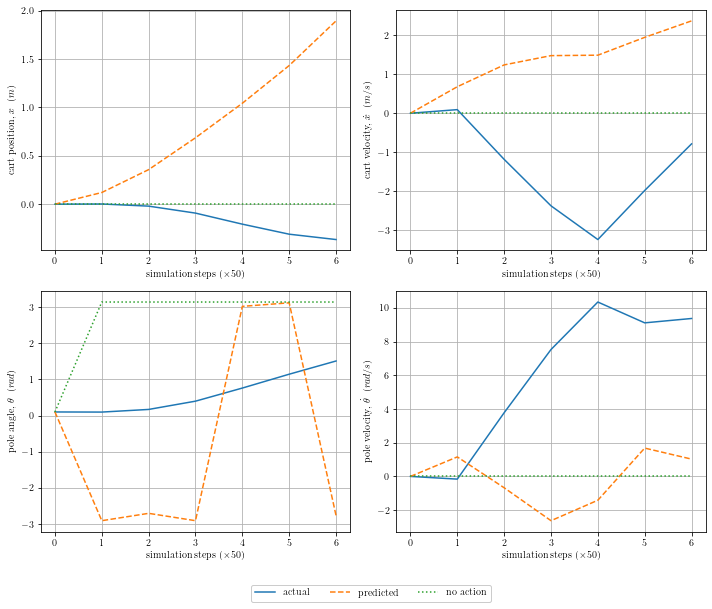

In [121]:
# What about other initial states?
# Now, we try to reduce the time delta for the euler integration

# First check if model fits well from varying cart position - expect no change, but changes, so poor fi
from task2 import *

x, xi, _, _, _, w, *_ = compute_weights_tts_with_action(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_no_action = CartPole(False)
cp_hat = CartPoleHat(False)
cp.delta_time = cp_no_action.delta_time = cp_hat.delta_time = 0.02

T = 6
steps = np.arange(0, T + 1)

x0 = np.array([0, 0, 0.1, 0])
cp.setState(x0)
cp_hat.setState(x0)
cp_hat.setTrainedParams(w, xi, sigma)
initial_p = [1.25839844, 1.00408936, -9.7, 3.3]

sol = t2_4_opt_p(cp_hat, x0, initial_p, steps=4)

linear_policy = sol.x
print(linear_policy)

action = np.dot(linear_policy, x0)
action_hat = np.dot(linear_policy, x0)

x = x0[None, ...]
x_hat = x0[None, ...]
x_no_action = x0[None, ...]
for _ in steps[1:]:
    cp.performAction(action)
    cp_no_action.remap_angle()
    cp.performAction(action)
    cp.remap_angle()
    cp_hat.performAction(action_hat)
    cp_hat.remap_angle()

    x = np.vstack([x, cp.getState()])
    x_hat = np.vstack([x_hat, cp_hat.getState()])
    x_no_action = np.vstack([x_no_action, cp_no_action.getState()])
    
    action = np.dot(linear_policy, x[-1])
    action = np.dot(linear_policy, x_hat[-1])


t2_3_roll_out(steps, x, x_hat, x_no_action, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$")
cp.reset()

fig.tight_layout()
lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=3)
fig.savefig("./assets2/task2_4__0.png", bbox_extra_artists=(lgd,), bbox_inches='tight')


Samples drawn: 2048
(2048, 320)
(320, 4)
SE: [  17.67831584  597.74983486   54.54273515 3440.88259866]
[ 1.25839844  1.00408936 -9.7         3.3       ]
[ 1.32131836  1.00408936 -9.7         3.3       ]
[ 1.25839844  1.05429383 -9.7         3.3       ]
[  1.25839844   1.00408936 -10.185        3.3       ]
[ 1.25839844  1.00408936 -9.7         3.465     ]
[ 1.2898584   1.02919159 -9.215       3.3825    ]
[ 1.30558838  1.04174271 -8.73        3.42375   ]
[ 1.31345337  1.04801827 -9.215       3.196875  ]
[ 1.34098084  0.99467602 -8.9725      3.3103125 ]
[ 1.28789215  1.04017382 -8.60875     3.31546875]
[ 1.27117905  1.05821605 -8.063125    3.32320313]
[ 1.35720238  1.06723717 -7.7903125   3.32707031]
[ 1.40660435  1.09881107 -6.83546875  3.34060547]
[ 1.34872294  1.04870466 -7.08554687  3.50206055]
[ 1.32506652  1.12906122 -6.38457031  3.48449707]
[ 1.31710936  1.19625383 -5.09060547  3.57158936]
[ 1.36621947  1.15925009 -4.80737305  3.44497925]
[ 1.39653501  1.21800378 -2.84605957  3.455

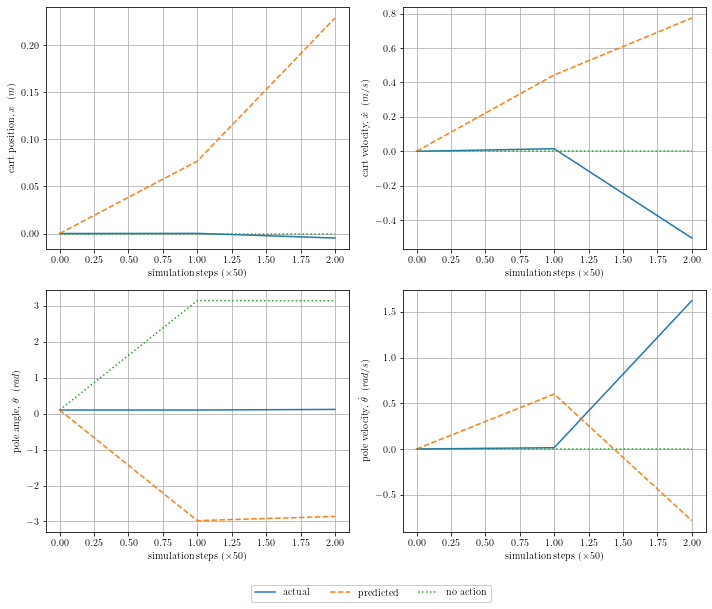

In [124]:
# What about other initial states?
# Now, we try to reduce the time delta for the euler integration

# First check if model fits well from varying cart position - expect no change, but changes, so poor fi
from task2 import *

x, xi, _, _, _, w, *_ = compute_weights_tts_with_action(2048, 320, basis_placement='sobol')
sigma = np.std(x, axis=0)

fig, axs = plt.subplots(2, 2, figsize=(10, 8))


cp = CartPole(False)
cp_no_action = CartPole(False)
cp_hat = CartPoleHat(False)
cp.delta_time = cp_no_action.delta_time = cp_hat.delta_time = 0.01

T = 2
steps = np.arange(0, T + 1)

x0 = np.array([0, 0, 0.1, 0])
cp.setState(x0)
cp_hat.setState(x0)
cp_hat.setTrainedParams(w, xi, sigma)
initial_p = [1.25839844, 1.00408936, -9.7, 3.3]

sol = t2_4_opt_p(cp_hat, x0, initial_p, steps=1)

linear_policy = sol.x
print(linear_policy)

action = np.dot(linear_policy, x0)
action_hat = np.dot(linear_policy, x0)

x = x0[None, ...]
x_hat = x0[None, ...]
x_no_action = x0[None, ...]
for _ in steps[1:]:
    cp.performAction(action)
    cp_no_action.remap_angle()
    cp.performAction(action)
    cp.remap_angle()
    cp_hat.performAction(action_hat)
    cp_hat.remap_angle()

    x = np.vstack([x, cp.getState()])
    x_hat = np.vstack([x_hat, cp_hat.getState()])
    x_no_action = np.vstack([x_no_action, cp_no_action.getState()])
    
    action = np.dot(linear_policy, x[-1])
    action = np.dot(linear_policy, x_hat[-1])


t2_3_roll_out(steps, x, x_hat, x_no_action, fig=fig, axs=axs, xlabel=r"simulation steps $(\times 50)$")
cp.reset()

fig.tight_layout()
lgd = fig.legend(loc="lower center", framealpha=1, bbox_to_anchor=(0.52, -0.06), ncol=3)
fig.savefig("./assets2/task2_4__1.png", bbox_extra_artists=(lgd,), bbox_inches='tight')
